# Region Generation

This notebook performs the segmentation of the updates in the Reddit experiment.

The general idea is to build a graph of updates and learn to compute weights for its edges based on a few hand-engineered features from updates. We later perform a second phase where regions from the first phase are clustered using a new set of features. In both cases these weights are learned using ground truth project/artpiece assignments from the place atlas.

In [4]:
import csv
import numpy as np
import scipy
import networkx as nx
import math
import sys
import os
import subprocess
import scipy.stats
import scipy.optimize
import operator
import time
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingRegressor
from scipy.sparse import csr_matrix

sys.path.append("../Python_code") # go to parent dir
from canvas_vis import * 
from analytics_combined import *
from generate_proj_to_remove import *
from project_data_analysis import *
from user_embedding import *
from segmentation import *
from evaluation import *
import pickle

In [5]:
#Parameters

#Area of the canvas considered (0-1002,0-1002 is the full canvas)
min_x = 0
max_x = 1002
min_y = 0
max_y = 1002

#distance threshold in update graphs
#updates within dist_threshold positions from each other
#that co-exist at any point in time will be connected
dist_threshold = 4

#Multithreading
num_threads = 3

#Kappa parameter for the region segmentation of the
#update graph
KAPPA_updates = 1.

#Kappa parameter for the segmentation of the
#region graph
KAPPA_region = .55

#User signed embedding parameters
ndim=160
threshold=5
total_samples=300
n_negatives=5
n_iterations=10

In [6]:
#Reading ground truth data

t = time.time()

projects_to_remove = get_list_of_removed_proj(output_filename = "../data/proj_to_remove.txt")

input_file= "../data/sorted_tile_placements_proj.csv"
js_filename = "../data/atlas_complete.json"

names, descriptions = read_picture_names_and_descriptions(js_filename)

print("time = ", time.time()-t, " seconds")

time =  368.4489412307739  seconds


## Part I: Update segmentation.

In [8]:
#Creating and saving update graph and associated list of updates

t = time.time()

G_ups, ups = create_graph(input_file, projects_to_remove, dist_threshold, min_x, max_x, min_y, max_y)

print("num edges = ", G_ups.n_edges)

pfile = open('graph.pkl', 'wb')
pickle.dump(G_ups, pfile)
pfile.close()

pfile = open('ups.pkl', 'wb')
pickle.dump(ups, pfile)
pfile.close()

print("time = ", time.time()-t, " seconds")

num edges =  468179461
time =  11670.487200975418  seconds


In [7]:
#Reading existing update graph and associated list of updates

pfile = open('graph.pkl', 'rb')
G_ups = pickle.load(pfile)
pfile.close()

pfile = open('ups.pkl', 'rb')
ups = pickle.load(pfile)
pfile.close()

In [15]:
#Functions that compute edge features for the
#update graph. The functions receive indexes
#of a pair of updates and some necessary data
#and return a real value.

def different_color(i, j, ups, data=None):
    '''
        Simply checks if updates have different color.
    '''
    if ups[i][4] == ups[j][4]:
        return 0
    else:
        return 1
        
def distance_space(i, j, ups, data=None):
    '''
        Eclidean distance between updates.
    '''
    xi = ups[i][2]
    yi = ups[i][3]
    xj = ups[j][2]
    yj = ups[j][3]
    
    return np.sqrt(pow(xi-xj,2)+pow(yi-yj,2))

def distance_time(i, j, ups, data=None):
    '''
        Time distance between updates
        in hours.
    '''
    time_i = ups[i][0]
    time_j = ups[j][0]
    
    return np.abs(time_i-time_j) / 3600000 #hours

def distance_duration(i, j, ups, durations):
    '''
        Distance between duration of updates.
        See function dist_duration for details.
    '''
    return dist_duration(durations[i], durations[j])
   
def distance_user_embedding(i, j, ups, data):
    '''
        Euclidean distance between user embeddings.
    '''
    user_i = ups[i][1]
    user_j = ups[j][1]
    user_i_id = data['index'][user_i]
    user_j_id = data['index'][user_j]
    
    return np.linalg.norm(data['emb'][user_i_id]-data['emb'][user_j_id])

def distance_user_colors(i, j, ups, data):
    '''
        Distance between user color histograms.
        One minus sum of minimum values for each
        color.
    '''
    user_i = ups[i][1]
    user_j = ups[j][1]
    user_i_id = data['index'][user_i]
    user_j_id = data['index'][user_j]
    
    return 1.-data['emb'][user_i_id].minimum(data['emb'][user_j_id]).sum()

def distance_color(i, j, ups, conflicts):
    color_i = ups[i][4]
    color_j = ups[j][4]
    
    if color_i == color_j:
        return 0
    else:
        max_up = len(ups)
        dist = 0
        
        conf_i = []
        if conflicts[i][0] <= max_up:
            conf_i.append(ups[conflicts[i][0]][4])
            
        if conflicts[i][1] <= max_up:
            conf_i.append(ups[conflicts[i][1]][4])
        
        conf_j = []
        if conflicts[j][0] <= max_up:
            conf_j.append(ups[conflicts[j][0]][4])
            
        if conflicts[j][1] <= max_up:
            conf_j.append(ups[conflicts[j][1]][4])
        
        if color_i in conf_j:
            dist = dist + 1
            
        if color_j in conf_i:
            dist = dist + 1
        
        return dist

In [ ]:
act_embedding(G_act, user_index, "actnet", ndim=2, threshold=5, total_samples=100, n_negatives=5, n_iterations=10)

In [17]:
#ndim=80
#threshold=5
#total_samples=300
#n_negatives=5
#n_iterations=10

def embed_users_act(G, ups, ndim=40, threshold=5, total_samples=100, n_negatives=5, n_iterations=10):
    '''
    '''
    G_act, user_index = compute_user_activity_graph(G, ups)

    act_embedding(G_act, user_index, "actnet", ndim, threshold, total_samples, n_negatives,  n_iterations)

    emb = read_embedding("actnet", user_index, ndim)

    return user_index, emb


user_index_act, emb_act = embed_users_act(G_ups, ups, ndim=160, threshold=5, total_samples=300, n_negatives=5, n_iterations=10)

python ../../signet/signet.py -l actnet_id.txt -i actnet.txt -o actnet -d 160 -t 5 -s 300


In [8]:
user_index_sign, emb_sign = embed_users_sign(G_ups, ups, ndim, threshold, total_samples, n_negatives, n_iterations, True)

python ../../signet/signet.py -l signet_id.txt -i signet.txt -o signet -d 160 -t 5 -s 300
balanced:
+++  0.5976795913378369  rand =  0.29385183715605007
+--  0.17136901946737437  rand =  0.22406061290053328
unbalanced:
++-  0.20882472445355368  rand =  0.44443432383806364
---  0.022126664741235123  rand =  0.03765322610535283
avg pos =  0.80931474176828 , n =  16547693
avg neg =  1.3813488293252074 , n =  8342484


In [9]:
same_proj = []
diff_proj = []

with open(G_ups.unique_edges_file_name, 'r') as file_in:
    reader = csv.reader(file_in)

    for r in reader:
        u = int(r[0])
        v = int(r[1])
        lb = int(r[2])
        type_edge = int(r[3])
            
        if type_edge > 0 and lb in [0,1]:
            user_u = user_index_sign[ups[u][1]]
            user_v = user_index_sign[ups[v][1]]
            
            dist = np.linalg.norm(emb_sign[user_u]-emb_sign[user_v])
            
            if lb == 1:
                diff_proj.append(dist)
            else:
                same_proj.append(dist)

In [10]:
np.mean(diff_proj)

0.780305977860449

In [11]:
np.mean(same_proj)

1.041782262829354

In [27]:
np.mean(diff_proj)

0.2972444031859221

In [28]:
np.mean(same_proj)

0.4015938728997916

(array([2.212228e+06, 9.764200e+04, 6.999530e+05, 2.071016e+06,
        3.854651e+06, 5.315509e+06, 6.310182e+06, 6.930779e+06,
        7.187615e+06, 7.214905e+06, 7.099016e+06, 6.880783e+06,
        6.606722e+06, 6.309532e+06, 5.984748e+06, 5.636914e+06,
        5.336835e+06, 5.013341e+06, 4.759267e+06, 4.467004e+06,
        4.215577e+06, 3.971058e+06, 3.719700e+06, 3.497120e+06,
        3.267614e+06, 3.063816e+06, 2.857153e+06, 2.668797e+06,
        2.492914e+06, 2.329326e+06, 2.168535e+06, 2.042986e+06,
        1.905700e+06, 1.777955e+06, 1.655729e+06, 1.549545e+06,
        1.431871e+06, 1.326626e+06, 1.231300e+06, 1.146278e+06,
        1.055563e+06, 9.838530e+05, 9.080740e+05, 8.354120e+05,
        7.697560e+05, 7.018590e+05, 6.394460e+05, 5.778040e+05,
        5.311650e+05, 4.785160e+05, 4.298920e+05, 3.838650e+05,
        3.368160e+05, 2.974830e+05, 2.589490e+05, 2.238560e+05,
        1.943340e+05, 1.645820e+05, 1.401280e+05, 1.207770e+05,
        1.002220e+05, 8.433000e+04, 6.94

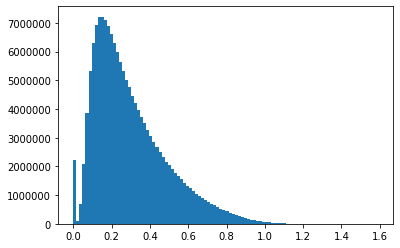

In [34]:
plt.hist(diff_proj, bins=100)

(array([1.26533e+05, 5.83000e+03, 4.15450e+04, 1.23036e+05, 2.43216e+05,
        3.70593e+05, 4.76454e+05, 5.53120e+05, 6.03874e+05, 6.36537e+05,
        6.64367e+05, 6.76091e+05, 6.82459e+05, 6.89285e+05, 6.88692e+05,
        6.82004e+05, 6.75691e+05, 6.73728e+05, 6.67059e+05, 6.54288e+05,
        6.49338e+05, 6.41037e+05, 6.30768e+05, 6.16093e+05, 5.98048e+05,
        5.82305e+05, 5.64219e+05, 5.44914e+05, 5.26191e+05, 5.06620e+05,
        4.90322e+05, 4.67862e+05, 4.49619e+05, 4.33294e+05, 4.18388e+05,
        4.01279e+05, 3.88550e+05, 3.68246e+05, 3.53093e+05, 3.41015e+05,
        3.22299e+05, 3.08184e+05, 2.96188e+05, 2.84310e+05, 2.77537e+05,
        2.65992e+05, 2.53457e+05, 2.36069e+05, 2.21009e+05, 2.07947e+05,
        1.95804e+05, 1.83148e+05, 1.67818e+05, 1.54733e+05, 1.41359e+05,
        1.26870e+05, 1.15792e+05, 1.04230e+05, 9.17080e+04, 8.07890e+04,
        6.87590e+04, 5.85370e+04, 5.13840e+04, 4.39080e+04, 3.68410e+04,
        3.00140e+04, 2.38250e+04, 1.97460e+04, 1.58

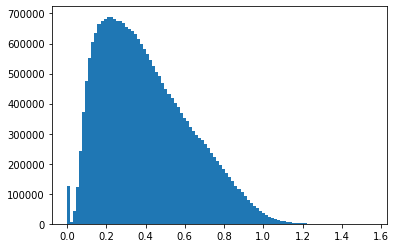

In [35]:
plt.hist(same_proj, bins=100)

(array([2.212228e+06, 1.150000e+02, 2.009000e+03, 1.232800e+04,
        5.068900e+04, 1.273250e+05, 2.576550e+05, 4.004720e+05,
        6.092390e+05, 8.683650e+05, 1.121703e+06, 1.381323e+06,
        1.632235e+06, 1.865733e+06, 2.057206e+06, 2.251910e+06,
        2.407988e+06, 2.565364e+06, 2.676723e+06, 2.750182e+06,
        2.840344e+06, 2.910369e+06, 2.950304e+06, 2.998391e+06,
        3.023846e+06, 3.041414e+06, 3.058682e+06, 3.086100e+06,
        3.072369e+06, 3.088442e+06, 3.085083e+06, 3.056906e+06,
        3.060241e+06, 3.060951e+06, 3.047895e+06, 3.021965e+06,
        3.020970e+06, 2.990364e+06, 2.960406e+06, 2.930328e+06,
        2.909375e+06, 2.885746e+06, 2.851301e+06, 2.838750e+06,
        2.814088e+06, 2.767643e+06, 2.735542e+06, 2.711015e+06,
        2.662863e+06, 2.621870e+06, 2.570458e+06, 2.518718e+06,
        2.466794e+06, 2.425351e+06, 2.353525e+06, 2.304472e+06,
        2.241846e+06, 2.171147e+06, 2.099773e+06, 2.027336e+06,
        1.944080e+06, 1.855018e+06, 1.76

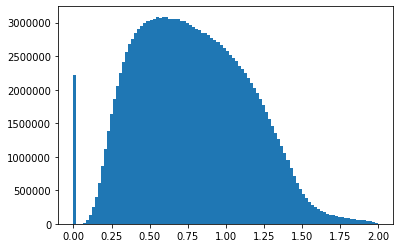

In [12]:
plt.hist(diff_proj, bins=100)

(array([1.26533e+05, 9.00000e+00, 4.60000e+01, 5.76000e+02, 2.02700e+03,
        3.96800e+03, 9.59400e+03, 1.48030e+04, 2.48880e+04, 4.02750e+04,
        5.42260e+04, 7.10360e+04, 8.69930e+04, 1.07130e+05, 1.22549e+05,
        1.44307e+05, 1.56593e+05, 1.71846e+05, 1.84544e+05, 1.92445e+05,
        2.05147e+05, 2.17061e+05, 2.24215e+05, 2.32137e+05, 2.37042e+05,
        2.44615e+05, 2.50647e+05, 2.57703e+05, 2.56632e+05, 2.63589e+05,
        2.68167e+05, 2.63868e+05, 2.68015e+05, 2.74561e+05, 2.76768e+05,
        2.81241e+05, 2.83171e+05, 2.91703e+05, 2.93372e+05, 2.98649e+05,
        3.04016e+05, 3.08500e+05, 3.14568e+05, 3.20639e+05, 3.25620e+05,
        3.29482e+05, 3.40235e+05, 3.45896e+05, 3.55779e+05, 3.64336e+05,
        3.76199e+05, 3.85931e+05, 3.97332e+05, 4.10067e+05, 4.21765e+05,
        4.38939e+05, 4.52950e+05, 4.66830e+05, 4.87334e+05, 5.06239e+05,
        5.25037e+05, 5.47661e+05, 5.65961e+05, 5.79772e+05, 5.99692e+05,
        6.01635e+05, 6.01704e+05, 5.97804e+05, 5.84

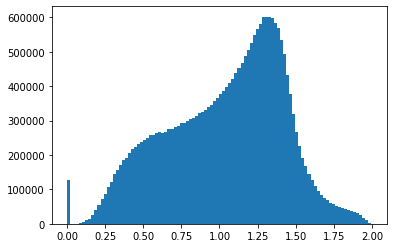

In [13]:
plt.hist(same_proj, bins=100)

In [5]:
user_index_sign, emb_sign = embed_users_sign(G_ups, ups, ndim, threshold, total_samples, n_negatives, n_iterations, True)


../Python_code/user_embedding.py:44: RuntimeWarning: overflow encountered in ushort_scalars
  writer.writerow([u+1, v+1, usr_rel_same_color[u,v] - usr_rel_diff_color[u,v]])
../Python_code/user_embedding.py:52: RuntimeWarning: overflow encountered in ushort_scalars
  writer.writerow([u+1, v+1, usr_rel_same_color[u,v] - usr_rel_diff_color[u,v]])


python ../../signet/signet.py -l signet_id.txt -i signet.txt -o signet -d 160 -t 5 -s 300
balanced:
+++  0.5976795913378369  rand =  0.29385183715605007
+--  0.17136901946737437  rand =  0.22406061290053328
unbalanced:
++-  0.20882472445355368  rand =  0.44443432383806364
---  0.022126664741235123  rand =  0.03765322610535283
avg pos =  0.16153866430072256 , n =  24638704
avg neg =  0.13932847764630932 , n =  251473


In [18]:
#Prepares data for feature computation and saves it.
#Takes a long time.

t = time.time()

durations = compute_update_durations(ups)
user_color, user_index_color = compute_user_color(ups)

#user_index_sign, emb_sign = embed_users_sign(G_ups, ups, ndim, threshold, total_samples, n_negatives, n_iterations, True)

#user_index_act, emb_act = embed_users_act(G_ups, ups, ndim, threshold, total_samples, n_negatives, n_iterations)

features = [{'name': "different_color", 'func': different_color, 'data': None}, 
    {'name': "distance_space",  'func': distance_space, 'data': None}, 
    {'name': "distance_time", 'func': distance_time, 'data': None}, 
    {'name': "distance_sign_embedding", 'func': distance_user_embedding, 'data': {'index': user_index_sign, 'emb': emb_sign}},
    {'name': "distance_act_embedding", 'func': distance_user_embedding, 'data': {'index': user_index_act, 'emb': emb_act}},
    {'name': "distance_user_colors", 'func': distance_user_colors, 'data': {'index': user_index_color, 'emb': user_color}}]

pfile = open('features.pkl', 'wb')
pickle.dump(features, pfile)
pfile.close()

print("time = ", time.time()-t, " seconds")

time =  286.0179646015167  seconds


In [8]:
#Reading existing feature data

pfile = open('features.pkl', 'rb')
features = pickle.load(pfile)
pfile.close()

In [9]:
user_index_sign = features[4]['data']['index']
emb_sign = features[4]['data']['emb']

In [19]:
def compute_feature_values(edge_buffer, ups, features):
    '''
    '''
    feat_values = np.zeros((len(edge_buffer), len(features)))

    for e in range(len(edge_buffer)):
        u = edge_buffer[e][0]
        v = edge_buffer[e][1]

        for f in range(len(features)):
            feat_values[e][f] = features[f]['func'](u, v, ups, features[f]['data'])

    return feat_values

def compute_feature_values_wrapper(param):
    '''
        Simple wrapper for the compute_weight function
    '''
    #Loading pickled features
    #Each thread has its own copy, which is quite inneficient
    pfile = open(param[2], 'rb')
    features = pickle.load(pfile)
    pfile.close()

    return compute_feature_values(param[0], param[1], features)

def build_feat_label_data_multithread(G, ups, features, features_file_name, n_threads, pixel=False):
    '''
    '''
    #Pickling feature data to be shared with threads
    if not os.path.exists(features_file_name):
        pfile = open(features_file_name, 'wb')
        pickle.dump(features, pfile)
        pfile.close()
        
    n_labelled = 0
    with open(G.unique_edges_file_name, 'r') as file_in:
        reader = csv.reader(file_in)

        for r in reader:
            u = int(r[0])
            v = int(r[1])
            lb = r[2]
            type_edge = int(r[3])

            #updates.append([ts, user, x, y, color, proj, pixel, pixel_color])
            
            if type_edge > 0:
                if pixel is True:
                    if int(ups[u][6]) == 1 and int(ups[v][6]) == 1:
                        n_labelled = n_labelled + 1
                else:
                    if int(ups[u][7]) == 1 and int(ups[v][7]) == 1:
                        n_labelled = n_labelled + 1

    A = np.zeros((n_labelled, len(features)))
    b = np.zeros(n_labelled)

    edge_buffer = []
    
    i = 0
    n = 0
    with open(G.unique_edges_file_name, 'r') as file_in:
        reader = csv.reader(file_in)

        for r in reader:
            u = int(r[0])
            v = int(r[1])
            lb = int(r[2])
            type_edge = int(r[3])
            
            if type_edge > 0:
                if pixel is True:
                    if int(ups[u][6]) == 1 and int(ups[v][6]) == 1:
                        edge_buffer.append((u,v))
                        
                        if lb == 1:
                            b[i] = 0.
                        else:
                            b[i] = 1.
                            
                        i = i + 1
                else:
                    if int(ups[u][7]) == 1 and int(ups[v][7]) == 1:
                        edge_buffer.append((u,v))
                        
                        if lb == 1:
                            b[i] = 0.
                        else:
                            b[i] = 1.
                            
                        i = i + 1
                    
            if len(edge_buffer) > G.buffer_size:
                edges_per_thread = int(len(edge_buffer) / n_threads)
                edge_parts = []
    
                for t in range(n_threads):
                    edge_parts.append([])

                e = 0
                for e in range(len(edge_buffer)):
                    t = e % n_threads
                    edge_parts[t].append(edge_buffer[e])

                futures = []

                #Multithreading
                with concurrent.futures.ProcessPoolExecutor(max_workers=n_threads) as executor:
                    for t in range(n_threads):
                        fut = executor.submit(compute_feature_values_wrapper, (edge_parts[t], ups, features_file_name))
                        futures.append(fut)

                #Collecting results
                for t in range(n_threads):
                    fut = futures[t]
                    res = fut.result()
                    for e in range(res.shape[0]):
                        A[n+e*n_threads+t] = res[e]
                
                n = n + len(edge_buffer)
                        
                edge_buffer = []
                
    if len(edge_buffer) > 0:
        edges_per_thread = int(len(edge_buffer) / n_threads)
        edge_parts = []
    
        for t in range(n_threads):
            edge_parts.append([])

        e = 0
        for e in range(len(edge_buffer)):
            t = e % n_threads
            edge_parts[t].append(edge_buffer[e])

        futures = []

        #Multithreading
        with concurrent.futures.ProcessPoolExecutor(max_workers=n_threads) as executor:
            for t in range(n_threads):
                fut = executor.submit(compute_feature_values_wrapper, (edge_parts[t], ups, features_file_name))
                futures.append(fut)

        #Collecting results
        for t in range(n_threads):
            fut = futures[t]
            res = fut.result()
            for e in range(res.shape[0]):
                A[n+e*n_threads+t] = res[e]
                                        
    return A, b

In [112]:
import tensorflow as tf
from keras.layers import Dense, Dropout, Activation
from keras.models import Sequential
from keras import optimizers
import numpy as np
import random

class NNRegression:
    def __init__(self):
        self.model = None
    
    def predict(self, X):
        return self.model.predict_proba(X)
    
    def fit(self,A, b, train_proportion = 0.9, first_nodes = 128, second_nodes = 64, dropout = 0.2, 
        learning_rate = 0.001, batch_size = 2, epochs = 256):
        '''
            Given a matrix A and set of labels b, create and return a
            nonlinear regression neural net
        '''
        SEED = 1021
        random.seed(SEED)
        np.random.seed(SEED)
        tf.random.set_seed(SEED)

        # Split data into training and validation
        rand = np.random.rand(A.shape[0], A.shape[1])
        np.random.shuffle(rand)

        num_training = int(A.shape[0] * train_proportion)

        train_A = A[:num_training]
        val_A = A[num_training:]
        train_b = b[:num_training]
        val_b = b[num_training:]

        dims = train_A.shape[1] # Number of columns

        # create model
        self.model = Sequential()

        # Hidden layer j with 128 neurons plus activation layer.
        self.model.add(Dense(first_nodes, input_dim=dims, kernel_initializer='glorot_uniform', bias_initializer='zeros', activation='relu'))
        self.model.add(Dropout(dropout))
        # Hidden layer k with 64 neurons.
        self.model.add(Dense(second_nodes, kernel_initializer='glorot_uniform', bias_initializer='zeros', activation='relu'))
        self.model.add(Dropout(dropout))
        # Output Layer.
        self.model.add(Dense(1, kernel_initializer='glorot_uniform', bias_initializer='zeros', activation='sigmoid'))

       
        # Model is derived and compiled using mean square error as loss
        # function, accuracy as metric and gradient descent optimizer.
        #model.compile(loss='mse', optimizer=adam)
        self.model.compile(loss='binary_crossentropy', optimizer='adam')
        
        # Training model with train data.
        callbacks = [
            tf.keras.callbacks.EarlyStopping(
                # Stop training when `val_loss` is no longer improving
                monitor='val_loss',
                # "no longer improving" being defined as "no better than 1e-2 less"
                min_delta=1e-2,
                # "no longer improving" being further defined as "for at least 2 epochs"
                patience=50,
                verbose=1)
        ]

        self.model.fit(train_A, train_b, epochs=epochs, callbacks=callbacks, batch_size=batch_size, validation_data=(val_A, val_b), verbose=2)
        
        return self

Using TensorFlow backend.


In [113]:
#Creating feature matrix A and vector of labels b
#for learning an edge weight model

from sklearn.preprocessing import StandardScaler

t = time.time()

A,b = build_feat_label_data_multithread(G_ups, ups, features, 'features.pkl', 5)

print("time = ", time.time()-t, " seconds")

time =  42785.45951795578  seconds


In [115]:
scaler_A = StandardScaler()
scaler_b = StandardScaler()

scaler_A.fit(A)
scaled_A = scaler_A.transform(A)

transformed_b = np.matrix(b).T
scaler_b.fit(transformed_b)
scaled_b = scaler_b.transform(transformed_b)
scaled_b = scaled_b.T[0]

In [17]:
A.shape

(183225309, 6)

In [114]:
np.mean(b)

0.132574608830604

In [55]:
A.shape

(183160993, 6)

In [116]:
#Learning edge weight model using gradient boosting regression
#and saving model.

t = time.time()

modelNN =  NNRegression().fit(scaled_A, b, train_proportion=0.8, dropout=0.)

print("time = ", time.time()-t, " seconds")

Train on 146528794 samples, validate on 36632199 samples
Epoch 1/256


KeyboardInterrupt: 

In [24]:
#Learning edge weight model using gradient boosting regression
#and saving model.

t = time.time()

model = GradientBoostingRegressor(random_state=1, n_estimators=50).fit(scaled_A, scaled_b)

pfile = open('model.pkl', 'wb')
pickle.dump(model, pfile)
pfile.close()

print("time = ", time.time()-t, " seconds")

time =  40479.770945072174  seconds


In [23]:
model.train_score_

array([0.98344006, 0.969917  , 0.95864005, 0.9493197 , 0.94145537,
       0.93491935, 0.92936932, 0.92457529, 0.92050602, 0.91702793,
       0.91397826, 0.91136446, 0.90903988, 0.90691808, 0.90514861,
       0.90339701, 0.90197477, 0.90060752, 0.89937   , 0.89837787,
       0.89734541, 0.89652747, 0.89570383, 0.8949046 , 0.89417952])

In [59]:
model.train_score_

array([0.98360717, 0.97006807, 0.95876582, 0.94932451, 0.94138915,
       0.93469672, 0.92900561, 0.92419928, 0.92009267, 0.91646589,
       0.91332694, 0.91056867, 0.90811702, 0.90597584, 0.90413694,
       0.90229785, 0.900832  , 0.89936145, 0.89805324, 0.8967977 ,
       0.89579643, 0.89479979, 0.89392157, 0.89311482, 0.89239871,
       0.89176693, 0.89114147, 0.89058437, 0.89006117, 0.88963222,
       0.88921959, 0.88885536, 0.88842756, 0.88808633, 0.88780254,
       0.88750594, 0.88725631, 0.88689795, 0.8866326 , 0.8864287 ,
       0.88623598, 0.88598922, 0.88574821, 0.88559872, 0.88545376,
       0.88524129, 0.8850808 , 0.88497594, 0.88478941, 0.88466775])

In [25]:
model.train_score_

array([0.97861275, 0.96117645, 0.94694191, 0.9350724 , 0.92535002,
       0.9171228 , 0.91034702, 0.90451848, 0.89966432, 0.89552779,
       0.89172786, 0.88852192, 0.88571146, 0.88320697, 0.88101503,
       0.87904411, 0.87713842, 0.87558641, 0.87405778, 0.87284689,
       0.87171423, 0.87059192, 0.86963678, 0.86881375, 0.86808217,
       0.867388  , 0.86682591, 0.86615254, 0.86564925, 0.86509971,
       0.86452757, 0.86417405, 0.86376932, 0.86347367, 0.86305428,
       0.86281114, 0.86254401, 0.8622168 , 0.8619533 , 0.86173167,
       0.86145388, 0.86126603, 0.86108663, 0.86086384, 0.86073203,
       0.8605475 , 0.86039764, 0.86028245, 0.86006178, 0.85992726])

In [7]:
#Reading an existing edge weight model

pfile = open('model.pkl', 'rb')
model = pickle.load(pfile)
pfile.close()

In [60]:
#Feature importances

for f in range(len(features)):
    print("feature: ", features[f]['name'], model.feature_importances_[f])

feature:  different_color 0.45223772735025003
feature:  distance_space 0.11599556503984479
feature:  distance_time 0.06251897706743952
feature:  distance_sign_embedding 0.006759677712517535
feature:  distance_act_embedding 0.2722174761270014
feature:  distance_user_colors 0.09027057670294684


In [26]:
#Feature importances

for f in range(len(features)):
    print("feature: ", features[f]['name'], model.feature_importances_[f])

feature:  different_color 0.2921186405757576
feature:  distance_space 0.10540065809546399
feature:  distance_time 0.054464579018053565
feature:  distance_sign_embedding 0.47865341305772874
feature:  distance_act_embedding 0.05593873757876618
feature:  distance_user_colors 0.01342397167423005


In [ ]:
#Computing edge weights using multithreading
#and sorting the edges in increasing order.
#Not every edge in the the unique_edges file
#will be included in the new file.

t = time.time()

compute_edge_weights_multithread(G_ups, ups, model, features, 'features.pkl', num_threads)
G_ups.sort_edges()

print("time = ", time.time()-t, " seconds")

In [43]:
#Performing region segmentation on the update graph

t = time.time()

comp_assign, int_weights = region_segmentation(G_ups, ups, 0.999)
regions, sizes, int_weights = extract_regions(comp_assign, int_weights)

#regions, sizes, int_weights = superv_reg_segm_ups(G_ups, ups, 0., 2., updates_proj, recall, 0.5, False, 1e-2)

pfile = open('up_regions.pkl', 'wb')
pickle.dump([regions, sizes, int_weights], pfile)
pfile.close()

print("num regions = ", len(regions), " max size region = ", np.max(sizes))

print("time = ", time.time()-t, " seconds")

num regions =  1907362  max size region =  14715
time =  2986.2017500400543  seconds


In [ ]:
pfile = open('up_regions.pkl', 'rb')
ups_region_info = pickle.load(pfile)
pfile.close()

regions = ups_region_info[0]
sizes = ups_region_info[1]
int_weights = ups_region_info[2]

time =  710.6224706172943  seconds


<Figure size 432x288 with 0 Axes>

<Figure size 7200x7200 with 0 Axes>

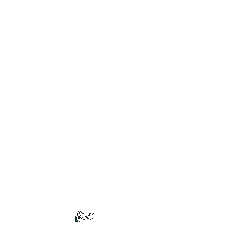

In [45]:
#Drawing top 100 regions

def draw_region(ups, region, output_file_name):
    '''
        Draws region into file.
    '''
    ups_region = updates_region(ups, region)

    plt.close('all')

    canvas_ups = extract_canvas_updates_region(ups_region)
    canvas_ups_rgb = canvas_color_code_rgb(canvas_ups)

    draw_canvas(canvas_ups_rgb, output_file_name)

def draw_top_regions(ups, regions, sizes, k, output_file_name='../plots/top_region_ups'):
    '''
        Draws top k largest regions
    '''
    ind  = np.argsort(sizes)

    for i in range(1, k+1):
        r = ind[-i]

        draw_region(ups, regions[r], output_file_name+"_"+str(i)+".svg")

t = time.time()

draw_top_regions(ups, regions, sizes, 100)

print("time = ", time.time()-t, " seconds")

In [46]:
#Distribution of region sizes

size_dist = np.zeros(np.max(sizes)+1)

for r in regions:
    size_dist[len(r)] = size_dist[len(r)] + 1
    
for i in range(size_dist.shape[0]):
    if size_dist[i] > 0:
        print("size = ", i, " number = ", size_dist[i], " % of total updates = ", 100*i*size_dist[i] / len(ups))

size =  1  number =  1291038.0  % of total updates =  9.010329889106414
size =  2  number =  245094.0  % of total updates =  3.421088757791246
size =  3  number =  97705.0  % of total updates =  2.045689472692071
size =  4  number =  56160.0  % of total updates =  1.5677931294732337
size =  5  number =  35143.0  % of total updates =  1.226338896658606
size =  6  number =  24653.0  % of total updates =  1.0323398509856738
size =  7  number =  18017.0  % of total updates =  0.8802016635329183
size =  8  number =  14218.0  % of total updates =  0.7938348545174657
size =  9  number =  11178.0  % of total updates =  0.7021150481270756
size =  10  number =  9151.0  % of total updates =  0.6386607428690154
size =  11  number =  7596.0  % of total updates =  0.5831486944723357
size =  12  number =  6413.0  % of total updates =  0.537086396330761
size =  13  number =  5433.0  % of total updates =  0.4929294023395879
size =  14  number =  4731.0  % of total updates =  0.46225609925894834
size = 

size =  230  number =  39.0  % of total updates =  0.06260285065604926
size =  231  number =  38.0  % of total updates =  0.06126285652829436
size =  232  number =  36.0  % of total updates =  0.05828974455733817
size =  233  number =  42.0  % of total updates =  0.0682978256990076
size =  234  number =  41.0  % of total updates =  0.0669578315712527
size =  235  number =  25.0  % of total updates =  0.04100242448208354
size =  236  number =  30.0  % of total updates =  0.04941228346096196
size =  237  number =  38.0  % of total updates =  0.0628540995550033
size =  238  number =  53.0  % of total updates =  0.08803482253906414
size =  239  number =  30.0  % of total updates =  0.050040405708347065
size =  240  number =  35.0  % of total updates =  0.0586247430892769
size =  241  number =  27.0  % of total updates =  0.045413238485943426
size =  242  number =  43.0  % of total updates =  0.07262489006988279
size =  243  number =  37.0  % of total updates =  0.06274941251377246
size =  

size =  491  number =  15.0  % of total updates =  0.05140133724434814
size =  492  number =  17.0  % of total updates =  0.05837349419032285
size =  493  number =  18.0  % of total updates =  0.06193285359217181
size =  494  number =  13.0  % of total updates =  0.0448200119189686
size =  495  number =  17.0  % of total updates =  0.05872943013050775
size =  496  number =  18.0  % of total updates =  0.062309726940602876
size =  497  number =  16.0  % of total updates =  0.05549809012451547
size =  498  number =  20.0  % of total updates =  0.06951219537728547
size =  499  number =  15.0  % of total updates =  0.052238833574194954
size =  500  number =  14.0  % of total updates =  0.04885395257439742
size =  501  number =  23.0  % of total updates =  0.0804205850735402
size =  502  number =  11.0  % of total updates =  0.0385387894451175
size =  503  number =  15.0  % of total updates =  0.05265758173911836
size =  504  number =  14.0  % of total updates =  0.0492447841949926
size =  

size =  824  number =  5.0  % of total updates =  0.02875404065807391
size =  825  number =  7.0  % of total updates =  0.04030451087387787
size =  826  number =  5.0  % of total updates =  0.028823832018894477
size =  827  number =  5.0  % of total updates =  0.02885872769930476
size =  828  number =  9.0  % of total updates =  0.05200852208348708
size =  829  number =  2.0  % of total updates =  0.011571407624050132
size =  830  number =  6.0  % of total updates =  0.03475609768864273
size =  831  number =  6.0  % of total updates =  0.034797972505135076
size =  832  number =  6.0  % of total updates =  0.03483984732162741
size =  833  number =  3.0  % of total updates =  0.017440861069059878
size =  834  number =  6.0  % of total updates =  0.0349235969546121
size =  835  number =  8.0  % of total updates =  0.04662062902813925
size =  836  number =  5.0  % of total updates =  0.029172788822997314
size =  837  number =  7.0  % of total updates =  0.04089075830477064
size =  838  num

size =  1156  number =  7.0  % of total updates =  0.05647516917600341
size =  1158  number =  1.0  % of total updates =  0.008081839583021744
size =  1159  number =  4.0  % of total updates =  0.0323552748764152
size =  1160  number =  4.0  % of total updates =  0.03238319142074343
size =  1161  number =  1.0  % of total updates =  0.008102776991267914
size =  1162  number =  3.0  % of total updates =  0.024329268382049914
size =  1163  number =  2.0  % of total updates =  0.016233470526864056
size =  1164  number =  3.0  % of total updates =  0.024371143198542253
size =  1165  number =  1.0  % of total updates =  0.008130693535596142
size =  1166  number =  2.0  % of total updates =  0.016275345343356395
size =  1167  number =  5.0  % of total updates =  0.04072325903880127
size =  1168  number =  3.0  % of total updates =  0.024454892831526936
size =  1169  number =  1.0  % of total updates =  0.008158610079924368
size =  1170  number =  2.0  % of total updates =  0.0163311784320128

size =  1393  number =  4.0  % of total updates =  0.03888774624922035
size =  1394  number =  2.0  % of total updates =  0.019457831396774285
size =  1395  number =  3.0  % of total updates =  0.029207684503407598
size =  1396  number =  2.0  % of total updates =  0.019485747941102513
size =  1398  number =  1.0  % of total updates =  0.00975683224271537
size =  1399  number =  3.0  % of total updates =  0.02929143413639228
size =  1400  number =  2.0  % of total updates =  0.019541581029758965
size =  1401  number =  2.0  % of total updates =  0.01955553930192308
size =  1402  number =  3.0  % of total updates =  0.02935424636113079
size =  1403  number =  2.0  % of total updates =  0.019583455846251308
size =  1404  number =  1.0  % of total updates =  0.00979870705920771
size =  1406  number =  1.0  % of total updates =  0.009812665331371824
size =  1408  number =  2.0  % of total updates =  0.019653247207071876
size =  1409  number =  1.0  % of total updates =  0.00983360273961799

size =  1976  number =  2.0  % of total updates =  0.02758154579628837
size =  1977  number =  1.0  % of total updates =  0.013797752034226242
size =  1983  number =  1.0  % of total updates =  0.013839626850718583
size =  1990  number =  1.0  % of total updates =  0.013888480803292979
size =  1992  number =  1.0  % of total updates =  0.013902439075457093
size =  2000  number =  1.0  % of total updates =  0.013958272164113548
size =  2002  number =  1.0  % of total updates =  0.01397223043627766
size =  2009  number =  2.0  % of total updates =  0.028042168777704116
size =  2012  number =  1.0  % of total updates =  0.01404202179709823
size =  2013  number =  1.0  % of total updates =  0.014049000933180286
size =  2015  number =  2.0  % of total updates =  0.0281259184106888
size =  2018  number =  1.0  % of total updates =  0.01408389661359057
size =  2019  number =  2.0  % of total updates =  0.028181751499345254
size =  2022  number =  1.0  % of total updates =  0.01411181315791879

In [47]:
#Printing top regions sizes

ind  = np.argsort(sizes)
k=20

for i in range(1, k):
    r = ind[-i]
    print(i, " region: ", r, " size = ", len(regions[r]))

1  region:  2985  size =  14715
2  region:  585284  size =  9647
3  region:  390918  size =  7892
4  region:  2328  size =  7666
5  region:  22392  size =  5537
6  region:  195865  size =  5394
7  region:  10035  size =  5214
8  region:  474277  size =  5074
9  region:  294065  size =  4982
10  region:  632975  size =  4852
11  region:  267496  size =  4688
12  region:  87112  size =  4418
13  region:  42748  size =  4183
14  region:  182761  size =  4119
15  region:  7187  size =  3965
16  region:  34375  size =  3907
17  region:  16917  size =  3871
18  region:  1950  size =  3842
19  region:  60383  size =  3811


In [550]:
#Creating a folder with figures for producing
#bash convert_svg_png.sh region_video
#ffmpeg -framerate 1 -i region_video/%d.png -vcodec mjpeg video.avi

create_region_video(ups, regions[ind[-1]], "../plots/region_video")

## Part II: Region clustering

In [48]:
def region_label(region, ups, pixel=False):
    '''
        Computes region label using majority voting.
        Also returns the participation of the majority project
        in the region.
    '''
    projs = {}
    size_final = 0
    for u in region:
        #updates.append([ts, user, x, y, color, proj, pixel, pixel_color])
        if pixel is True:
            if ups[u][6] == 1:
                proj = ups[u][5]
                size_final = size_final + 1
                
                if proj not in projs:
                    projs[proj] = 0

                projs[proj] = projs[proj] + 1
        else:
            if ups[u][7] == 1:
                proj = ups[u][5]
                size_final = size_final + 1
                
                if proj not in projs:
                    projs[proj] = 0

                projs[proj] = projs[proj] + 1

    if len(projs) > 0:
        max_proj, max_count = max(projs.items(), key=operator.itemgetter(1))
    else:
        max_proj = 0
        max_count = 0

    if size_final > 0:
        return max_proj, max_count / size_final
    else:
        return 0, 0.


def build_region_graph(G, regions, ups, updates_proj, label_threshold, name='reg'):
    '''
        Builds graph of adjacent regions
    '''
    comp_assign = []

    for u in ups:
        comp_assign.append(0)

    region_labels = []
    n_labelled = 0
    for r in range(len(regions)):
        for u in regions[r]:
            comp_assign[u] = r

        proj, score = region_label(regions[r], ups)
        #proj, score = max_intersection_over_union(regions[r], updates_proj, ups, False)
        
        #If intersection over union is above threshold
        #assign region to project
        if score >= label_threshold:
            region_labels.append(int(proj))
            n_labelled = n_labelled + 1
        else:
            region_labels.append(0)

    print("#labelled regions = ", n_labelled)
    print("#unlabelled regions = ", len(regions)-n_labelled)

    G_reg = MyGraph(name)
    G_reg.clear()

    with open(G.sorted_edges_file_name, 'r') as file_in:
        reader = csv.reader(file_in)

        for r in reader:
            u = int(r[0])
            v = int(r[1])
            lb = r[2]
            type_edge = int(r[3])

            reg_u = comp_assign[u]
            reg_v = comp_assign[v]

            if reg_u != reg_v and type_edge > 0:
                G_reg.add_edge(reg_u, reg_v, 0, 1)

    G_reg.flush_edges()
    G_reg.remove_repeated_edges()

    true_edges = 0
    false_edges = 0
    unlabelled_edges = 0
    
    with open(G_reg.unique_edges_file_name, 'r') as file_in:
        reader = csv.reader(file_in)

        for r in reader:
            reg_u = int(r[0])
            reg_v = int(r[1])
            lb = r[2]
            type_edge = int(r[3])

            lb_u = region_labels[reg_u]
            lb_v = region_labels[reg_v]

            #add_edge(self, node1, node2, label, type_edge)
            if lb_u > 0 or lb_v > 0:
                if lb_u == lb_v:
                    G_reg.add_edge(reg_u, reg_v, 1, 1)
                    false_edges = false_edges + 1
                else:
                    G_reg.add_edge(reg_u, reg_v, 0, 1)
                    true_edges = true_edges + 1
            else:
                G_reg.add_edge(reg_u, reg_v, 2, 1)
                unlabelled_edges = unlabelled_edges + 1

    G_reg.flush_edges()
    G_reg.remove_repeated_edges()

    print("#true edges = ", true_edges)
    print("#false edges = ", false_edges)
    print("#unlabelled edges = ", unlabelled_edges)

    return G_reg

In [49]:
#Building region graph and saving it

t = time.time()

G_reg = build_region_graph(G_ups, regions, ups, updates_proj, 0.5)

pfile = open('reg_graph.pkl', 'wb')
pickle.dump(G_reg, pfile)
pfile.close()

print("time = ", time.time()-t, " seconds")

#labelled regions =  645968
#unlabelled regions =  1261394
#true edges =  14326643
#false edges =  5316290
#unlabelled edges =  1992736
time =  2908.4342172145844  seconds


In [51]:
region_label(regions[585284], ups)

('1122', 0.9979838709677419)

In [ ]:
pfile = open('reg_graph.pkl', 'rb')
G_reg = pickle.load(pfile)
pfile.close()

In [52]:
#Functions that compute edge features for the
#region graph. The functions receive indexes
#of a pair of regions and some necessary data
#and return a real value.

def difference_internal_weights(i, j, ups, data):
    '''
        Internal weights measure the diversity of
        of the edges in a region. This computes
        their difference.
    '''
    return np.abs(data[i]-data[j])
    
def sum_internal_weights(i, j, ups, data):
    '''
        Internal weights measure the diversity of
        of the edges in a region. This computes
        their sum.
    '''
    return data[i]+data[j]
    
def distance_region_user_embedding(i, j, ups, data):
    '''
        Distance between avg user embeddings for regions.
    '''
    return np.linalg.norm(data[i]-data[j])

def distance_region_user_colors(i, j, ups, data):
    '''
        Distance between avg user color embeddings for regions.
    '''
    return 1.-np.minimum(data[i], data[j]).sum()
    
def distance_region_durations(i, j, ups, data):
    '''
        Distance between the durations of two regions.
    '''
    return dist_duration(data[i], data[j])

def distance_users_per_region(i, j, ups, data):
    '''
        Distance between user participations between regions.
        It is weighted by user activity.
    '''
    sz = min(len(data['regions'][i]), len(data['regions'][j]))
    dist = sz
    for u in data['users'][i]:
        if u in data['users'][j]:
            dist = dist - min(data['users'][i][u], data['users'][j][u])
            
    return dist / sz

def superposition(i,j, ups, data):
    '''
        Superposition between two regions, which is a 
        normalized count of the number of updates in 
        the same position but with different colors
        in the final version of the region (as there
        can be layers).
    '''
    pos_i = {}
    for ui in data[i]:
        up = ups[ui]
        x = up[2]
        y = up[3]
        t = up[0]
        c = up[4]
        
        if (x,y) not in pos_i:
            pos_i[(x,y)] = (c,t)
        elif pos_i[(x,y)][1] < t:
            pos_i[(x,y)] = (c,t)
    
    pos_j = {}
    for uj in data[j]:
        up = ups[uj]
        x = up[2]
        y = up[3]
        t = up[0]
        c = up[4]
        
        if (x,y) not in pos_j:
            pos_j[(x,y)] = (c,t)
        elif pos_j[(x,y)][1] < t:
            pos_j[(x,y)] = (c,t)
    
    count = 0
    for (x,y) in pos_i:
        if (x,y) in pos_j:
            if pos_i[(x,y)][0] != pos_j[(x,y)][0]:
                count = count + 1
                
    return count / min(len(pos_i), len(pos_j))
    
def avg_update_time_distance(i,j,ups,data):
    '''
        Computes (absolute) distance between the
        average time of two regions.
    '''
    avg_ti = 0
    for ui in data[i]:
        upi = ups[ui]
        avg_ti = avg_ti + upi[0]
    
    avg_ti = avg_ti / len(data[i])
    
    avg_tj = 0
    for uj in data[j]:
        upj = ups[uj]
        avg_tj = avg_tj + upj[0]      
    
    avg_tj = avg_tj / len(data[j])
    
    return np.abs(avg_ti-avg_tj) / 3600000 #hours

def avg_update_pos_distance(i,j,ups,data):
    '''
        Computes the distance between the average
        points of two regions.
    '''
    avg_xi = 0
    avg_yi = 0
    
    for ui in data[i]:
        upi = ups[ui]
        xi = upi[2]
        yi = upi[3]
        
        avg_xi = avg_xi + xi
        avg_yi = avg_yi + yi
        
    avg_xi = avg_xi / len(data[i])
    avg_yi = avg_yi / len(data[i])
    
    avg_xj = 0
    avg_yj = 0
            
    for uj in data[j]:
        upj = ups[uj]
        xj = upj[2]
        yj = upj[3]
        
        avg_xj = avg_xj + xj
        avg_yj = avg_yj + yj
        
    avg_xj = avg_xj / len(data[j])
    avg_yj = avg_yj / len(data[j])
    
    return math.sqrt(math.pow(avg_xi-avg_xj,2)+math.pow(avg_yi-avg_yj,2))

def sizes(i, j, ups, data):
    '''
    '''
    return len(data[i])+len(data[j])

def bounding_box_distance(i, j, ups, data):
    '''
        Amount of empty space in the bounding box
        of the combined region.
    '''
    min_xi = data[i][0]
    max_xi = data[i][1]
    min_yi = data[i][2]
    max_yi = data[i][3]

    min_xj = data[j][0]
    max_xj = data[j][1]
    min_yj = data[j][2]
    max_yj = data[j][3]
    
    joint_area = (max(max_xi, max_xj)-min(min_xi, min_xj)+1) * (max(max_yi, max_yj)-min(min_yi, min_yj)+1)
    inters_area = (min(max_xi, max_xj)-max(min_xi, min_xj)+1) * (min(max_yi, max_yj)-max(min_yi, min_yj)+1)
    inters_area = max(0,inters_area)
    
    area_i = (max_xi-min_xi+1) * (max_yi-min_yi+1)
    area_j = (max_xj-min_xj+1) * (max_yj-min_yj+1)
    
    return (min(area_i, area_j) - inters_area) / min(area_i, area_j)

def distance_region_colors(i, j, ups, data):
    '''
        Distance between distributions of user colors
        in the regions.
    '''
    return 1.-data[i].minimum(data[j]).sum()

In [193]:
def compute_region_colors(regions, ups):
    '''
        Computes sparse matrix of color frequencies
        for each region.
    '''
    rows = []
    cols = []
    data = []
    for r in range(len(regions)):
        region = regions[r]
        colors = np.zeros(16)
        for u in region:
            up = ups[u]
            color = int(up[4])
            colors[color] = colors[color] + 1

        colors = colors / np.sum(colors)

        for c in range(len(colors)):
            if colors[c] > 0:
                rows.append(r)
                cols.append(c)
                data.append(colors[c])

    return scipy.sparse.csr_matrix((data, (rows, cols)), shape=(len(regions), 16))


In [53]:
#Prepares data for feature computation and saves it.

t = time.time()

durations = compute_update_durations(ups)
region_durations = compute_region_durations(regions, durations, ups)
users_per_region = compute_users_per_region(regions, ups)

emb_sign = features[3]['data']['emb']
user_index_sign = features[3]['data']['index']

emb_act = features[4]['data']['emb']
user_index_act = features[4]['data']['index']

region_sign_emb = compute_user_vector_regions(regions, emb_sign, user_index_sign, ups)
region_act_emb = compute_user_vector_regions(regions, emb_act, user_index_act, ups)

user_color = features[5]['data']['emb']
user_index_color = features[5]['data']['index']

region_colors_emb = compute_user_vector_regions(regions, user_color, user_index_color, ups)

region_colors = compute_region_colors(regions, ups)

bounding_boxes = compute_region_bounding_boxes(regions, ups)

region_features = [{'name': "distance_sign_embedding", 'func': distance_region_user_embedding, 'data': region_sign_emb},
    {'name': "distance_act_embedding", 'func': distance_region_user_embedding, 'data': region_act_emb},
    {'name': "users_per_region", 'func': distance_users_per_region, 'data':{'users': users_per_region, 'regions':regions}}, 
    {'name': "pos_distance", 'func': avg_update_pos_distance, 'data':regions},
    {'name': "sizes", 'func': sizes, 'data':regions},
    {'name': "bounding_box", 'func': bounding_box_distance, 'data':bounding_boxes},
    {'name': "dist_region_color", 'func': distance_region_colors, 'data':region_colors},
    {'name': 'avg_update_distance', 'func': avg_update_pos_distance, 'data':regions},
    {'name': 'dist_user_colors', 'func': distance_region_user_colors, 'data':region_colors_emb},
    {'name': 'dist_region_durations', 'func': distance_region_durations, 'data':region_durations},
    {'name': 'diff_internal_weight', 'func': difference_internal_weights, 'data':int_weights},
    {'name': 'sum_internal_weight', 'func': sum_internal_weights, 'data':int_weights}
]

pfile = open('features_regions.pkl', 'wb')
pickle.dump(region_features, pfile)
pfile.close()

print("time = ", time.time()-t, " seconds")

time =  4450.346696138382  seconds


In [ ]:
#Reading existing feature data

pfile = open('features_regions.pkl', 'rb')
region_features = pickle.load(pfile)
pfile.close()

In [54]:
def region_neighborhood(region, G, ups, features, regions, model=None):
    '''
        Prints neighborhood information (edges and feature values)
        for a given region.
    '''
    with open(G.unique_edges_file_name, 'r') as file_in:
        reader = csv.reader(file_in)

        for r in reader:
            u = int(r[0])
            v = int(r[1])
            lb = int(r[2])
            type_edge = int(r[3])
            
            if (u == region or v == region) and len(regions[u]) > 50 and len(regions[v]) > 50:
                print(u, ",", v, ",",lb)
                print("size_u=", len(regions[u])," size_v=", len(regions[v]))
                feat_values = np.zeros(len(features))
                for f in range(len(features)):
                    print(features[f]['name'], " ", features[f]['func'](u, v, ups, features[f]['data']))
                    feat_values[f] = features[f]['func'](u, v, ups, features[f]['data'])
                    
                if model is not None:
                    print("model ", model.predict([feat_values])[0])

                print()
           

In [55]:
#Neighborhood information for a particular region

region_neighborhood(585284, G_reg, ups, region_features, regions, model)

0 , 585284 , 1
size_u= 1557  size_v= 9647
distance_sign_embedding   0.6302727263299823
distance_act_embedding   0.2116501454996601
users_per_region   0.9775208734746307
pos_distance   20.534424577163104
sizes   11204
bounding_box   0.12866308305878274
dist_region_color   0.4655773998778593
avg_update_distance   20.534424577163104
dist_user_colors   0.34555651305234025
dist_region_durations   0.4114860825170984
diff_internal_weight   0.3441088165964299
sum_internal_weight   0.744528153217304


ValueError: Number of features of the model must match the input. Model n_features is 6 and input n_features is 12 

<Figure size 432x288 with 0 Axes>

<Figure size 7200x7200 with 0 Axes>

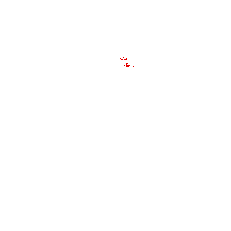

In [241]:
draw_region(ups, regions[194771], '../plots/region.svg')

In [56]:
def build_feat_label_regions(G, ups, features):
    ''' 
        Extracts feature values and labels for edges between regions.

        features is a dictionary with both functions that compute
        feature values and the data structures they require, used as:

        A[i,f] = features[f]['func'](u, v, ups, features[f]['data'])

        Returns matrix A with feature values and vector b with labels
    '''
    #Counting labelled points
    n_labelled = 0
    with open(G.unique_edges_file_name, 'r') as file_in:
        reader = csv.reader(file_in)

        for r in reader:
            u = int(r[0])
            v = int(r[1])
            lb = int(r[2])
            type_edge = int(r[3])

            if lb in [0,1]:
                n_labelled = n_labelled + 1

    A = np.zeros((n_labelled+1, len(features)))
    b = np.zeros(n_labelled+1)

    i = 0
    with open(G.unique_edges_file_name, 'r') as file_in:
        reader = csv.reader(file_in)

        for r in reader:
            u = int(r[0])
            v = int(r[1])
            lb = int(r[2])
            type_edge = int(r[3])

            if lb in [0,1]:
                for f in range(len(features)):
                    A[i,f] = features[f]['func'](u, v, ups, features[f]['data'])

                    if lb == 1:
                        b[i] = float(0.)
                    else:
           '*(y-inv(A'*A+a*eye)*A'*b)              b[i] = float(1.)

                i = i + 1
                   
    return A, b

In [57]:
#Creating feature matrix A and vector of labels b
#for learning an region edge weight model

t = time.time()

A, b = build_feat_label_regions(G_reg, ups, region_features)

print("time = ", time.time()-t, " seconds")

time =  30612.208392620087  seconds


In [58]:
scaler_A = StandardScaler()
scaler_b = StandardScaler()

scaler_A.fit(A)
scaled_A = scaler_A.transform(A)

transformed_b = np.matrix(b).T
scaler_b.fit(transformed_b)
scaled_b = scaler_b.transform(transformed_b)
scaled_b = scaled_b.T[0]

In [59]:
#Learning region edge weight model using gradient boosting regression
#and saving model.

t = time.time()

model = GradientBoostingRegressor(random_state=1, n_estimators=50).fit(scaled_A, scaled_b)

pfile = open('model_regions.pkl', 'wb')
pickle.dump(model, pfile)
pfile.close()

print("time = ", time.time()-t, " seconds")

time =  7334.909534215927  seconds


In [ ]:
#Reading an existing region edge weight model

pfile = open('model_regions.pkl', 'rb')
model = pickle.load(pfile)
pfile.close()

In [60]:
#Feature importances

for f in range(len(region_features)):
    print("feature: ", region_features[f]['name'], model.feature_importances_[f])

feature:  distance_sign_embedding 0.22062799246695616
feature:  distance_act_embedding 0.005377730269211436
feature:  users_per_region 0.001927661823915637
feature:  pos_distance 0.021183914811696826
feature:  sizes 0.011536763654362072
feature:  bounding_box 0.012394846104651535
feature:  dist_region_color 0.6158966597744452
feature:  avg_update_distance 0.03449035202099721
feature:  dist_user_colors 0.008761481491168621
feature:  dist_region_durations 0.04403314377930266
feature:  diff_internal_weight 0.01294848137285668
feature:  sum_internal_weight 0.010820972430435815


In [61]:
#Computing region edge weights using multithreading
#and sorting the edges in increasing order.

t = time.time()

compute_edge_weights_multithread(G_reg, ups, model, region_features, 'features_regions.pkl', num_threads)
G_reg.sort_edges()

print("time = ", time.time()-t, " seconds")

time =  11932.859884738922  seconds


In [77]:
#Performing segmentation on the region graph

t = time.time()

comp_assign_reg, int_weights_reg = region_segmentation(G_reg, regions, 0.15)
reg_regions, reg_sizes, super_int_weights = extract_regions(comp_assign_reg, int_weights_reg)
super_regions, super_region_sizes, super_region_assign = extract_super_region_info(reg_regions, regions)

pfile = open('super_regions.pkl', 'wb')
pickle.dump([super_regions, super_region_sizes, super_region_assign], pfile)
pfile.close()

print("num regions = ", len(super_regions), " max size region = ", np.max(super_region_sizes))

print("time = ", time.time()-t, " seconds")

num regions =  1852085  max size region =  70280
time =  186.87515020370483  seconds


time =  718.7829480171204  seconds


<Figure size 432x288 with 0 Axes>

<Figure size 7200x7200 with 0 Axes>

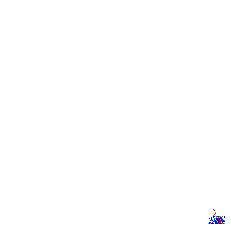

In [78]:
#Drawing top 1000 regions

t = time.time()

draw_top_regions(ups, super_regions, super_region_sizes, 100, output_file_name='../plots/top_region_super')

print("time = ", time.time()-t, " seconds")

In [29]:
#Distribution of region sizes

size_dist = np.zeros(np.max(super_region_sizes)+1)

for r in super_regions:
    size_dist[len(r)] = size_dist[len(r)] + 1
    
for i in range(size_dist.shape[0]):
    if size_dist[i] > 0:
        print("size = ", i, " number = ", size_dist[i], " % of total updates = ", 100*i*size_dist[i] / len(ups))

size =  1  number =  793990.0  % of total updates =  5.5413642577922575
size =  2  number =  106163.0  % of total updates =  1.4818520477587867
size =  3  number =  38153.0  % of total updates =  0.7988249368161363
size =  4  number =  19492.0  % of total updates =  0.5441492820458025
size =  5  number =  11973.0  % of total updates =  0.4178059815523288
size =  6  number =  8569.0  % of total updates =  0.358825302522867
size =  7  number =  5963.0  % of total updates =  0.2913161192011318
size =  8  number =  4556.0  % of total updates =  0.2543755519188053
size =  9  number =  3644.0  % of total updates =  0.22888774694713396
size =  10  number =  3031.0  % of total updates =  0.2115376146471408
size =  11  number =  2462.0  % of total updates =  0.18900896337426154
size =  12  number =  2090.0  % of total updates =  0.17503673293798389
size =  13  number =  1821.0  % of total updates =  0.16521708847053002
size =  14  number =  1574.0  % of total updates =  0.15379224270420305
size

size =  225  number =  17.0  % of total updates =  0.02669519551386716
size =  226  number =  13.0  % of total updates =  0.0205047018090828
size =  227  number =  9.0  % of total updates =  0.014258375015641988
size =  228  number =  15.0  % of total updates =  0.023868645400634166
size =  229  number =  13.0  % of total updates =  0.020776888116283015
size =  230  number =  17.0  % of total updates =  0.027288422080841986
size =  231  number =  21.0  % of total updates =  0.03385578913405741
size =  232  number =  14.0  % of total updates =  0.0226682339945204
size =  233  number =  13.0  % of total updates =  0.021139803192549968
size =  234  number =  17.0  % of total updates =  0.027763003334421846
size =  235  number =  14.0  % of total updates =  0.022961357709966785
size =  236  number =  15.0  % of total updates =  0.02470614173048098
size =  237  number =  10.0  % of total updates =  0.016540552514474553
size =  238  number =  13.0  % of total updates =  0.021593447037883656


size =  513  number =  3.0  % of total updates =  0.010740890430285375
size =  514  number =  5.0  % of total updates =  0.01793637973088591
size =  515  number =  3.0  % of total updates =  0.010782765246777716
size =  516  number =  6.0  % of total updates =  0.021607405310047772
size =  517  number =  2.0  % of total updates =  0.007216426708846704
size =  518  number =  2.0  % of total updates =  0.007230384981010818
size =  519  number =  4.0  % of total updates =  0.014488686506349862
size =  520  number =  1.0  % of total updates =  0.0036291507626695224
size =  521  number =  2.0  % of total updates =  0.007272259797503159
size =  522  number =  6.0  % of total updates =  0.021858654209001814
size =  523  number =  7.0  % of total updates =  0.025550617196409848
size =  524  number =  7.0  % of total updates =  0.025599471148984247
size =  525  number =  2.0  % of total updates =  0.007328092886159612
size =  526  number =  3.0  % of total updates =  0.011013076737485588
size =

size =  797  number =  1.0  % of total updates =  0.005562371457399249
size =  798  number =  2.0  % of total updates =  0.011138701186962611
size =  799  number =  2.0  % of total updates =  0.011152659459126725
size =  800  number =  1.0  % of total updates =  0.0055833088656454186
size =  801  number =  3.0  % of total updates =  0.016770864005182427
size =  803  number =  4.0  % of total updates =  0.022416985095566357
size =  805  number =  3.0  % of total updates =  0.016854613638167107
size =  806  number =  3.0  % of total updates =  0.01687555104641328
size =  807  number =  3.0  % of total updates =  0.01689648845465945
size =  808  number =  1.0  % of total updates =  0.005639141954301873
size =  809  number =  2.0  % of total updates =  0.01129224218076786
size =  810  number =  1.0  % of total updates =  0.005653100226465987
size =  812  number =  2.0  % of total updates =  0.0113341169972602
size =  813  number =  1.0  % of total updates =  0.005674037634712157
size =  81

size =  1062  number =  2.0  % of total updates =  0.014823685038288587
size =  1063  number =  1.0  % of total updates =  0.0074188216552263505
size =  1065  number =  1.0  % of total updates =  0.007432779927390464
size =  1066  number =  2.0  % of total updates =  0.01487951812694504
size =  1067  number =  1.0  % of total updates =  0.007446738199554577
size =  1069  number =  3.0  % of total updates =  0.022382089415156074
size =  1070  number =  1.0  % of total updates =  0.007467675607800748
size =  1071  number =  1.0  % of total updates =  0.007474654743882805
size =  1072  number =  1.0  % of total updates =  0.007481633879964861
size =  1073  number =  2.0  % of total updates =  0.014977226032093836
size =  1074  number =  4.0  % of total updates =  0.0299823686085159
size =  1076  number =  2.0  % of total updates =  0.015019100848586178
size =  1077  number =  1.0  % of total updates =  0.007516529560375146
size =  1079  number =  3.0  % of total updates =  0.0225914634976

size =  1563  number =  1.0  % of total updates =  0.010908389696254737
size =  1566  number =  2.0  % of total updates =  0.021858654209001814
size =  1568  number =  1.0  % of total updates =  0.01094328537666502
size =  1569  number =  1.0  % of total updates =  0.010950264512747079
size =  1570  number =  1.0  % of total updates =  0.010957243648829135
size =  1573  number =  1.0  % of total updates =  0.010978181057075305
size =  1574  number =  1.0  % of total updates =  0.010985160193157362
size =  1576  number =  1.0  % of total updates =  0.010999118465321476
size =  1577  number =  1.0  % of total updates =  0.011006097601403532
size =  1580  number =  1.0  % of total updates =  0.011027035009649702
size =  1590  number =  1.0  % of total updates =  0.01109682637047027
size =  1593  number =  2.0  % of total updates =  0.022235527557432883
size =  1601  number =  2.0  % of total updates =  0.02234719373474579
size =  1602  number =  1.0  % of total updates =  0.01118057600345

size =  2132  number =  2.0  % of total updates =  0.02975903625389008
size =  2134  number =  1.0  % of total updates =  0.014893476399109155
size =  2136  number =  1.0  % of total updates =  0.014907434671273269
size =  2138  number =  1.0  % of total updates =  0.014921392943437382
size =  2139  number =  2.0  % of total updates =  0.029856744159038877
size =  2144  number =  1.0  % of total updates =  0.014963267759929722
size =  2145  number =  1.0  % of total updates =  0.01497024689601178
size =  2147  number =  1.0  % of total updates =  0.014984205168175894
size =  2152  number =  2.0  % of total updates =  0.030038201697172355
size =  2153  number =  1.0  % of total updates =  0.015026079984668234
size =  2155  number =  1.0  % of total updates =  0.015040038256832347
size =  2159  number =  1.0  % of total updates =  0.015067954801160575
size =  2164  number =  2.0  % of total updates =  0.030205700963141718
size =  2168  number =  1.0  % of total updates =  0.0151307670258

size =  3029  number =  1.0  % of total updates =  0.021139803192549968
size =  3030  number =  1.0  % of total updates =  0.021146782328632024
size =  3031  number =  2.0  % of total updates =  0.04230752292942816
size =  3047  number =  1.0  % of total updates =  0.02126542764202699
size =  3058  number =  1.0  % of total updates =  0.021342198138929614
size =  3062  number =  1.0  % of total updates =  0.021370114683257842
size =  3071  number =  1.0  % of total updates =  0.021432926907996353
size =  3081  number =  1.0  % of total updates =  0.02150271826881692
size =  3085  number =  1.0  % of total updates =  0.02153063481314515
size =  3096  number =  1.0  % of total updates =  0.021607405310047772
size =  3098  number =  1.0  % of total updates =  0.021621363582211884
size =  3101  number =  1.0  % of total updates =  0.021642300990458056
size =  3115  number =  1.0  % of total updates =  0.02174000889560685
size =  3130  number =  1.0  % of total updates =  0.0218446959368377

size =  4801  number =  1.0  % of total updates =  0.03350683232995457
size =  4830  number =  1.0  % of total updates =  0.033709227276334214
size =  4835  number =  1.0  % of total updates =  0.033744122956744504
size =  4850  number =  1.0  % of total updates =  0.033848809997975356
size =  4857  number =  1.0  % of total updates =  0.03389766395054975
size =  4863  number =  1.0  % of total updates =  0.03393953876704209
size =  4870  number =  1.0  % of total updates =  0.03398839271961649
size =  4872  number =  1.0  % of total updates =  0.0340023509917806
size =  4874  number =  1.0  % of total updates =  0.034016309263944715
size =  4878  number =  1.0  % of total updates =  0.03404422580827294
size =  4882  number =  1.0  % of total updates =  0.03407214235260117
size =  4888  number =  1.0  % of total updates =  0.03411401716909351
size =  4914  number =  1.0  % of total updates =  0.034295474707226985
size =  4921  number =  2.0  % of total updates =  0.06868865731960276
si

size =  9099  number =  1.0  % of total updates =  0.06350315921063458
size =  9106  number =  1.0  % of total updates =  0.06355201316320898
size =  9144  number =  1.0  % of total updates =  0.06381722033432714
size =  9192  number =  1.0  % of total updates =  0.06415221886626586
size =  9276  number =  1.0  % of total updates =  0.06473846629715864
size =  9296  number =  1.0  % of total updates =  0.06487804901879977
size =  9333  number =  1.0  % of total updates =  0.06513627705383587
size =  9337  number =  1.0  % of total updates =  0.0651641935981641
size =  9353  number =  1.0  % of total updates =  0.06527585977547701
size =  9432  number =  1.0  % of total updates =  0.0658272115259595
size =  9447  number =  1.0  % of total updates =  0.06593189856719034
size =  9471  number =  1.0  % of total updates =  0.0660993978331597
size =  9490  number =  1.0  % of total updates =  0.06623200141871878
size =  9495  number =  1.0  % of total updates =  0.06626689709912907
size =  9

size =  30557  number =  1.0  % of total updates =  0.21326146125940884
size =  30733  number =  1.0  % of total updates =  0.21448978920985082
size =  31264  number =  1.0  % of total updates =  0.218195710469423
size =  31375  number =  1.0  % of total updates =  0.21897039457453127
size =  31784  number =  1.0  % of total updates =  0.2218248612320925
size =  32014  number =  1.0  % of total updates =  0.22343006253096556
size =  32329  number =  1.0  % of total updates =  0.22562849039681343
size =  32358  number =  1.0  % of total updates =  0.2258308853431931
size =  32438  number =  1.0  % of total updates =  0.22638921622975763
size =  32913  number =  1.0  % of total updates =  0.22970430586873458
size =  33015  number =  1.0  % of total updates =  0.2304161777491044
size =  34032  number =  1.0  % of total updates =  0.2375139591445561
size =  34225  number =  1.0  % of total updates =  0.23886093240839307
size =  34270  number =  1.0  % of total updates =  0.2391749935320856

In [282]:
#Printing top regions

ind  = np.argsort(super_region_sizes)
k=20

for i in range(1, k+1):
    r = ind[-i]
    print(i, " region: ", r, " size = ", len(super_regions[r]))

1  region:  7629  size =  163240
2  region:  945  size =  162497
3  region:  1276  size =  133967
4  region:  52  size =  133342
5  region:  784  size =  117425
6  region:  104  size =  108248
7  region:  5643  size =  100348
8  region:  5615  size =  76509
9  region:  4895  size =  71124
10  region:  762  size =  69024
11  region:  1653  size =  68827
12  region:  3599  size =  62869
13  region:  6145  size =  61977
14  region:  409155  size =  59338
15  region:  135192  size =  59178
16  region:  2515  size =  57430
17  region:  4031  size =  50303
18  region:  3361  size =  49638
19  region:  105093  size =  45805
20  region:  288792  size =  39952


## Part 3: Region Clustering Again

In [79]:
#Building region graph and saving it

t = time.time()

G_reg_2 = build_region_graph(G_ups, super_regions, ups, updates_proj, .5, 'reg_2')

pfile = open('reg_2_graph.pkl', 'wb')
pickle.dump(G_reg, pfile)
pfile.close()

print("time = ", time.time()-t, " seconds")

#labelled regions =  603618
#unlabelled regions =  1248467
#true edges =  10313356
#false edges =  3143797
#unlabelled edges =  1814455
time =  2604.7558097839355  seconds


In [80]:
#Prepares data for feature computation and saves it.

t = time.time()

super_region_durations = compute_region_durations(super_regions, durations, ups)
users_per_super_region = compute_users_per_region(super_regions, ups)

emb_sign = features[3]['data']['emb']
user_index_sign = features[3]['data']['index']

emb_act = features[4]['data']['emb']
user_index_act = features[4]['data']['index']

super_region_sign_emb = compute_user_vector_regions(super_regions, emb_sign, user_index_sign, ups)
super_region_act_emb = compute_user_vector_regions(super_regions, emb_act, user_index_act, ups)

user_color = features[5]['data']['emb']
user_index_color = features[5]['data']['index']

super_region_colors_emb = compute_user_vector_regions(super_regions, user_color, user_index_color, ups)

super_region_colors = compute_region_colors(super_regions, ups)

super_bounding_boxes = compute_region_bounding_boxes(super_regions, ups)

super_region_features = [{'name': "distance_sign_embedding", 'func': distance_region_user_embedding, 'data': super_region_sign_emb},
    {'name': "distance_act_embedding", 'func': distance_region_user_embedding, 'data': super_region_act_emb},
    {'name': "users_per_region", 'func': distance_users_per_region, 'data':{'users': users_per_super_region, 'regions':super_regions}}, 
    {'name': "pos_distance", 'func': avg_update_pos_distance, 'data':super_regions},
    {'name': "sizes", 'func': sizes, 'data':super_regions},
    {'name': "bounding_box", 'func': bounding_box_distance, 'data':super_bounding_boxes},
    {'name': "dist_region_color", 'func': distance_region_colors, 'data':super_region_colors},
    {'name': 'avg_update_distance', 'func': avg_update_pos_distance, 'data':super_regions},
    {'name': 'dist_user_colors', 'func': distance_region_user_colors, 'data':super_region_colors_emb},
    {'name': 'dist_region_durations', 'func': distance_region_durations, 'data':super_region_durations},
    {'name': 'diff_internal_weight', 'func': difference_internal_weights, 'data':super_int_weights},
    {'name': 'sum_internal_weight', 'func': sum_internal_weights, 'data':super_int_weights}
]


pfile = open('features_super_regions.pkl', 'wb')
pickle.dump(super_region_features, pfile)
pfile.close()

print("time = ", time.time()-t, " seconds")

time =  4231.551353216171  seconds


In [ ]:
#Reading existing feature data

pfile = open('features_super_regions.pkl', 'rb')
super_region_features = pickle.load(pfile)
pfile.close()

In [ ]:
#Creating feature matrix A and vector of labels b
#for learning an region edge weight model

t = time.time()

A, b = build_feat_label_regions(G_reg_2, ups, super_region_features)

print(A.shape)
print(b.sum() / b.shape[0])

print("time = ", time.time()-t, " seconds")

In [82]:
A.shape

(13457154, 12)

In [83]:
scaler_A = StandardScaler()
scaler_b = StandardScaler()

scaler_A.fit(A)
scaled_A = scaler_A.transform(A)

transformed_b = np.matrix(b).T
scaler_b.fit(transformed_b)
scaled_b = scaler_b.transform(transformed_b)
scaled_b = scaled_b.T[0]

In [84]:
#Learning region edge weight model using gradient boosting regression
#and saving model.

t = time.time()

model = GradientBoostingRegressor(random_state=1, n_estimators=50).fit(A, b)

pfile = open('model_super_regions.pkl', 'wb')
pickle.dump(model, pfile)
pfile.close()

print("time = ", time.time()-t, " seconds")

time =  4412.092351436615  seconds


In [85]:
#Feature importances

for f in range(len(super_region_features)):
    print("feature: ", super_region_features[f]['name'], model.feature_importances_[f])

feature:  distance_sign_embedding 0.20084865227231727
feature:  distance_act_embedding 0.0007883176651612796
feature:  users_per_region 0.004199787115975717
feature:  pos_distance 0.04771573711618182
feature:  sizes 0.02770973767405343
feature:  bounding_box 0.009148953090803835
feature:  dist_region_color 0.5788622530453057
feature:  avg_update_distance 0.049857917536245404
feature:  dist_user_colors 0.01433658546942893
feature:  dist_region_durations 0.06411468713120001
feature:  diff_internal_weight 0.0007689399845547098
feature:  sum_internal_weight 0.0016484318987717824


In [290]:
#Neighborhood information for a particular region

region_neighborhood(5615, G_reg_2, ups, super_region_features, super_regions, model)

1143 , 5615 , 0
size_u= 279  size_v= 76509
distance_user_embedding   0.8716819294096814
users_per_region   0.5878136200716846
superposition   0.6108597285067874
pos_distance   43.395547220557695
sizes   76788
bounding_box   0.0
dist_region_color   0.5284999150426748
avg_update_distance   43.395547220557695
dist_user_colors   0.18666820603380185
dist_region_durations   0.19802607789844395
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9697382955664844

1450 , 5615 , 0
size_u= 17985  size_v= 76509
distance_user_embedding   0.623756176766516
users_per_region   0.8671670836808452
superposition   0.012175324675324676
pos_distance   65.53545435083855
sizes   94494
bounding_box   0.17135416666666667
dist_region_color   0.5179590868588062
avg_update_distance   65.53545435083855
dist_user_colors   0.2716418259081671
dist_region_durations   0.0052911496834233684
diff_internal_weight   0.09397421251244109
sum_internal_weight   1.8921634800194953
model 

superposition   0.47130434782608693
pos_distance   53.26402374186891
sizes   77271
bounding_box   0.05696460056964601
dist_region_color   0.549832848649477
avg_update_distance   53.26402374186891
dist_user_colors   0.26049521405407394
dist_region_durations   0.022950455453324414
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9799185035645971

3432 , 5615 , 0
size_u= 90  size_v= 76509
distance_user_embedding   0.709288198160072
users_per_region   0.9444444444444444
superposition   0.8333333333333334
pos_distance   34.01930892636053
sizes   76599
bounding_box   0.0
dist_region_color   0.6444313740867087
avg_update_distance   34.01930892636053
dist_user_colors   0.3584239791012719
dist_region_durations   0.3607134629439206
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9972402573396281

3683 , 5615 , 0
size_u= 2709  size_v= 76509
distance_user_embedding   0.5790058265224637
users_per_region   0.90439

dist_user_colors   0.13189351698015916
dist_region_durations   0.935841003051699
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9975021476274171

5615 , 1021313 , 0
size_u= 76509  size_v= 1610
distance_user_embedding   0.85794824119831
users_per_region   0.9583850931677018
superposition   0.3973941368078176
pos_distance   56.37313511740939
sizes   78119
bounding_box   0.0
dist_region_color   1.0
avg_update_distance   56.37313511740939
dist_user_colors   0.3890740794082128
dist_region_durations   0.9439171792179862
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9998493520888451

5615 , 1046691 , 0
size_u= 76509  size_v= 115
distance_user_embedding   0.3358267232909303
users_per_region   0.043478260869565216
superposition   0.6486486486486487
pos_distance   52.4766603179966
sizes   76624
bounding_box   0.0
dist_region_color   1.0
avg_update_distance   52.4766603179966
dist_user_colors   0.1616174529

pos_distance   55.36287366936954
sizes   77361
bounding_box   0.009684473601999375
dist_region_color   0.5284999150426748
avg_update_distance   55.36287366936954
dist_user_colors   0.11854612485753191
dist_region_durations   0.15959690470096588
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9639642658064812

5615 , 135715 , 0
size_u= 76509  size_v= 120
distance_user_embedding   0.7169460974824806
users_per_region   0.9666666666666667
superposition   0.0
pos_distance   41.74946816537179
sizes   76629
bounding_box   0.025615384615384616
dist_region_color   0.5284999150426748
avg_update_distance   41.74946816537179
dist_user_colors   0.14118505981803664
dist_region_durations   0.48338590954227756
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9934412224521679

5615 , 14019 , 0
size_u= 76509  size_v= 143
distance_user_embedding   0.8101921992706566
users_per_region   0.8181818181818182
superposition  

dist_user_colors   0.2671964206834576
dist_region_durations   0.18158533611793826
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9968023995808606

5615 , 175226 , 0
size_u= 76509  size_v= 64
distance_user_embedding   1.1247144571545382
users_per_region   0.859375
superposition   1.0
pos_distance   23.744187416155096
sizes   76573
bounding_box   0.0
dist_region_color   1.0
avg_update_distance   23.744187416155096
dist_user_colors   0.5034264940345481
dist_region_durations   0.8970385384282183
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9994827705245521

5615 , 17900 , 0
size_u= 76509  size_v= 436
distance_user_embedding   0.635274941138766
users_per_region   0.9587155963302753
superposition   0.3352941176470588
pos_distance   50.56308972223794
sizes   76945
bounding_box   0.03657616892911011
dist_region_color   0.4657470291016911
avg_update_distance   50.56308972223794
dist_user_colors   0.25258

pos_distance   72.19510514402806
sizes   78093
bounding_box   0.03466308083071866
dist_region_color   0.5558626346989481
avg_update_distance   72.19510514402806
dist_user_colors   0.22854783047692417
dist_region_durations   0.24012094403309003
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9817093474253651

5615 , 219727 , 0
size_u= 76509  size_v= 102
distance_user_embedding   0.13564648027673798
users_per_region   0.12745098039215685
superposition   1.0
pos_distance   43.96076791121537
sizes   76611
bounding_box   0.0
dist_region_color   0.8485537649165458
avg_update_distance   43.96076791121537
dist_user_colors   0.11927858867955254
dist_region_durations   0.8810781719268457
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9951102132447668

5615 , 219973 , 0
size_u= 76509  size_v= 1002
distance_user_embedding   0.7977289688383061
users_per_region   0.9481037924151696
superposition   0.057915057915

pos_distance   12.793712636915865
sizes   76564
bounding_box   0.0
dist_region_color   0.6181818181818182
avg_update_distance   12.793712636915865
dist_user_colors   0.2502712276351533
dist_region_durations   0.946587107094426
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9997697875158915

5615 , 28172 , 0
size_u= 76509  size_v= 981
distance_user_embedding   0.08156285643578587
users_per_region   0.24057084607543322
superposition   0.6758409785932722
pos_distance   14.866723311078012
sizes   77490
bounding_box   0.0
dist_region_color   0.8923656040465827
avg_update_distance   14.866723311078012
dist_user_colors   0.11557735869552532
dist_region_durations   0.017933918356942913
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9000413091862026

5615 , 28316 , 0
size_u= 76509  size_v= 234
distance_user_embedding   0.7027577545131619
users_per_region   0.7350427350427351
superposition   0.7906976744186

dist_user_colors   0.3620650262677323
dist_region_durations   0.6884348619105086
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9974416135105904

5615 , 312819 , 0
size_u= 76509  size_v= 256
distance_user_embedding   0.3723865998897641
users_per_region   0.3671875
superposition   0.5652173913043478
pos_distance   29.492243986494035
sizes   76765
bounding_box   0.0
dist_region_color   0.5361657309107426
avg_update_distance   29.492243986494035
dist_user_colors   0.18614746093808665
dist_region_durations   0.30376499172710825
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9809496222144224

5615 , 313768 , 0
size_u= 76509  size_v= 85
distance_user_embedding   0.7457812969748805
users_per_region   0.6823529411764706
superposition   0.8032786885245902
pos_distance   3.5062793358272337
sizes   76594
bounding_box   0.0
dist_region_color   0.4115076042572462
avg_update_distance   3.5062793358272337
dist_u

pos_distance   92.4653319427779
sizes   76617
bounding_box   0.050063042349625456
dist_region_color   0.5615036575217731
avg_update_distance   92.4653319427779
dist_user_colors   0.21168510657035022
dist_region_durations   0.33490837370407855
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9918296881146678

5615 , 355837 , 0
size_u= 76509  size_v= 81
distance_user_embedding   0.7708226799607699
users_per_region   0.8518518518518519
superposition   0.1956521739130435
pos_distance   87.2709111472106
sizes   76590
bounding_box   0.04047907822922984
dist_region_color   0.3692710080586017
avg_update_distance   87.2709111472106
dist_user_colors   0.2951559597575446
dist_region_durations   0.33810824951555873
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9953587558495193

5615 , 366255 , 0
size_u= 76509  size_v= 235
distance_user_embedding   0.843638729480285
users_per_region   0.9702127659574468
superpo

dist_user_colors   0.3286256809441286
dist_region_durations   0.4157542207084787
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9972402573396281

5615 , 431215 , 0
size_u= 76509  size_v= 314
distance_user_embedding   0.6739815293749941
users_per_region   0.8471337579617835
superposition   0.1320754716981132
pos_distance   43.58796270831609
sizes   76823
bounding_box   0.06936744847192608
dist_region_color   0.6797508856416126
avg_update_distance   43.58796270831609
dist_user_colors   0.33976546946860486
dist_region_durations   0.40573349089703414
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9953587558495193

5615 , 433566 , 0
size_u= 76509  size_v= 283
distance_user_embedding   0.3253213389818045
users_per_region   0.2332155477031802
superposition   0.42342342342342343
pos_distance   57.74458452423435
sizes   76792
bounding_box   0.0
dist_region_color   0.5022640122663691
avg_update_distance   5

pos_distance   54.73059173255855
sizes   76747
bounding_box   0.0
dist_region_color   1.0
avg_update_distance   54.73059173255855
dist_user_colors   0.4229915226690857
dist_region_durations   0.4661773849221321
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9848504055759421

5615 , 495146 , 0
size_u= 76509  size_v= 679
distance_user_embedding   0.2219527098318643
users_per_region   0.4167893961708395
superposition   0.15246636771300448
pos_distance   40.756426865573296
sizes   77188
bounding_box   0.0
dist_region_color   0.8485537649165458
avg_update_distance   40.756426865573296
dist_user_colors   0.14649409107835631
dist_region_durations   0.46328438417297013
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9813277459658102

5615 , 495505 , 0
size_u= 76509  size_v= 154
distance_user_embedding   0.6127691051892027
users_per_region   0.8636363636363636
superposition   0.0
pos_distance   53.015002180

pos_distance   54.202869232397866
sizes   76927
bounding_box   0.025153846153846155
dist_region_color   0.7305937863519325
avg_update_distance   54.202869232397866
dist_user_colors   0.2979421421599504
dist_region_durations   0.49960027451768607
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9971612503778844

5615 , 55186 , 0
size_u= 76509  size_v= 1877
distance_user_embedding   0.6454711309462524
users_per_region   0.8726691529035695
superposition   0.023809523809523808
pos_distance   72.25452812381022
sizes   78386
bounding_box   0.04491899852724595
dist_region_color   0.7305937863519325
avg_update_distance   72.25452812381022
dist_user_colors   0.24064347586383827
dist_region_durations   0.05743786775355675
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9931946588471613

5615 , 552476 , 0
size_u= 76509  size_v= 223
distance_user_embedding   0.24466910128189662
users_per_region   0.2197309417040

pos_distance   57.34863119556278
sizes   77123
bounding_box   0.12064029151483602
dist_region_color   0.4754274932973971
avg_update_distance   57.34863119556278
dist_user_colors   0.16226377430899308
dist_region_durations   0.049716800226655145
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.967078885471947

561 , 5615 , 0
size_u= 4777  size_v= 76509
distance_user_embedding   0.2466839253942632
users_per_region   0.39208708394389785
superposition   0.27100681302043905
pos_distance   7.557640541667699
sizes   81286
bounding_box   0.049592345529277
dist_region_color   0.5284999150426748
avg_update_distance   7.557640541667699
dist_user_colors   0.10022409392772524
dist_region_durations   0.006782142149408976
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9184764034975519

5615 , 621415 , 0
size_u= 76509  size_v= 72
distance_user_embedding   0.14931258726277716
users_per_region   0.06944444444444445
s

superposition   0.03942652329749104
pos_distance   65.29788325134705
sizes   76824
bounding_box   0.013675213675213675
dist_region_color   0.8923656040465827
avg_update_distance   65.29788325134705
dist_user_colors   0.483953622211327
dist_region_durations   0.013378831788666057
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9953086735047831

5615 , 674742 , 0
size_u= 76509  size_v= 67
distance_user_embedding   0.4199212792346208
users_per_region   0.417910447761194
superposition   0.4857142857142857
pos_distance   58.66881368332037
sizes   76576
bounding_box   0.0
dist_region_color   0.6246600975438847
avg_update_distance   58.66881368332037
dist_user_colors   0.23783364072100965
dist_region_durations   0.6900735706262406
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9973546642268677

5615 , 678258 , 0
size_u= 76509  size_v= 56
distance_user_embedding   0.64876842341079
users_per_region   0.9821

superposition   0.03614457831325301
pos_distance   48.48618328299308
sizes   76598
bounding_box   0.09384998222538216
dist_region_color   1.0
avg_update_distance   48.48618328299308
dist_user_colors   0.632866829152106
dist_region_durations   0.6756423024797373
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9974383712836349

5615 , 82410 , 0
size_u= 76509  size_v= 65
distance_user_embedding   0.724088738401049
users_per_region   0.5538461538461539
superposition   0.9629629629629629
pos_distance   45.632164459440105
sizes   76574
bounding_box   0.0
dist_region_color   1.0
avg_update_distance   45.632164459440105
dist_user_colors   0.5039763756765827
dist_region_durations   0.443757146533189
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9752561117835838

5615 , 824691 , 0
size_u= 76509  size_v= 97
distance_user_embedding   1.0101713431044614
users_per_region   1.0
superposition   0.0
pos_distance  

pos_distance   73.67006329500134
sizes   77864
bounding_box   0.18826784726065302
dist_region_color   0.8485537649165458
avg_update_distance   73.67006329500134
dist_user_colors   0.4205846127477729
dist_region_durations   0.8574049607388223
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9994021273823146

5615 , 959839 , 0
size_u= 76509  size_v= 1162
distance_user_embedding   0.10339525653976465
users_per_region   0.3803786574870912
superposition   0.3675889328063241
pos_distance   59.5383053657477
sizes   77671
bounding_box   0.01077788191190253
dist_region_color   0.5284999150426748
avg_update_distance   59.5383053657477
dist_user_colors   0.1404064048064244
dist_region_durations   0.8642867519417805
diff_internal_weight   0.8990946337535272
sum_internal_weight   0.8990946337535272
model  0.9934829329595151

5615 , 963370 , 0
size_u= 76509  size_v= 190
distance_user_embedding   0.27036935087032693
users_per_region   0.3473684210526316
supe

<Figure size 432x288 with 0 Axes>

<Figure size 7200x7200 with 0 Axes>

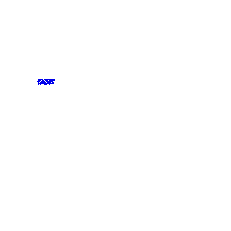

In [292]:
draw_region(ups, super_regions[11562], '../plots/region.svg')

In [283]:
for u in super_regions[7629]:
    print(ups[u])

[1490984786000, 'UAWGtZ+J5Q5cWDiUCbfhC20XbBk=', 519, 535, 5, '1122', 0, 0]
[1490985163000, 'UjOUauFO4B9Com/iu6QcIoMmCRo=', 519, 533, 5, '1122', 0, 1]
[1491023207000, 'F3UlUpqTfzJLk/nSMvgMrIwn+54=', 518, 532, 5, '1122', 0, 1]
[1491103879000, 'UgD3tk+0GWAqtZ4FpJV8Dk49HDE=', 467, 533, 5, '1122', 0, 1]
[1491103921000, 'gkv6GFx5VgZJI077SYw2DYRPDMQ=', 467, 533, 5, '1122', 0, 1]
[1491104240000, 'V3m2bfCOAZGVoE16fS2n16St99Y=', 467, 533, 5, '1122', 0, 1]
[1491104324000, 'jHNc1+4ZAopBlCJUvXKdifgQmgE=', 467, 533, 5, '1122', 0, 1]
[1491104633000, 'V3m2bfCOAZGVoE16fS2n16St99Y=', 469, 533, 5, '1122', 0, 1]
[1491105023000, 'BSAq+8CIYjIX3Ik0wdzy7JOplUk=', 466, 531, 5, '1122', 0, 1]
[1491105045000, 'YTLiB+w/LK48vPjQUI3ODudkgJI=', 471, 533, 5, '1122', 0, 1]
[1491105109000, 'Poa6/JX5dZ8xFzlIHzxX0vgSDBQ=', 465, 528, 5, '1122', 0, 1]
[1491105164000, 'fqjFniLKAgoMgLN/M0hT8mTpIwg=', 467, 530, 5, '1122', 0, 1]
[1491105348000, 'tmu4UTfv6Cjvc5FvFk+b+lgz1UM=', 507, 529, 5, '1122', 0, 1]
[1491105429000, 'rmv+oeuS

[1491180913000, 'OlHGpuisDjIVn3JIS2w0khBCDMo=', 536, 531, 5, '1122', 0, 1]
[1491180917000, 'cDedZrZ/Zp0A6CZBuqiSH76MGVo=', 487, 529, 5, '1122', 0, 1]
[1491180931000, '/oIalkFl7B04ncaZ1Sm9hfSewhI=', 487, 529, 5, '1122', 0, 1]
[1491180941000, '6aN32wDUCA4wcq2Kjj7m9hMCeSU=', 536, 531, 5, '1122', 0, 1]
[1491180963000, 'CDoM+Jk7b0KqzH1CgbQmktoG15g=', 484, 531, 5, '1122', 0, 1]
[1491180964000, 'e+/M93xhTn0qRoSYh8E4LZrh1tM=', 484, 530, 5, '1122', 0, 1]
[1491180966000, 'o2fxTVX3SUDaWmn4WoYp2YI74GU=', 484, 530, 5, '1122', 0, 1]
[1491180967000, 'nT36XYoqmMSMqkRypf/Nzd1PZ5c=', 484, 530, 5, '1122', 0, 1]
[1491180968000, 'bE60aosQpnwutC7V+IEdnv1jTEw=', 484, 530, 5, '1122', 0, 1]
[1491180975000, 'axpDPREAJuVqRA2805dSZQjblpM=', 484, 530, 5, '1122', 0, 1]
[1491180975000, 'bOIJV8n62GYVEySuAkcLKN3XjCQ=', 484, 529, 5, '1122', 0, 1]
[1491180977000, '3ZkXmYGjXTR2M+Ri0YkP6e6GB9k=', 484, 530, 5, '1122', 0, 1]
[1491180978000, 'WbMN9gs4rkNf03FXFZhy9NVBpCo=', 536, 531, 5, '1122', 0, 1]
[1491180979000, 'qz7X2YIc

[1491097434000, 'vKZCgdaNhYb5nanvPgIm98Bc1Bs=', 440, 503, 13, '1122', 0, 1]
[1491097435000, 'i8ZIdhUzYRkpEcztTWO++df8i0g=', 460, 490, 13, '1122', 0, 1]
[1491097447000, 'HvYFT6qD2l7XUyF9KGBDvNV42Xk=', 447, 496, 13, '1122', 0, 1]
[1491097451000, 'lJKnGLrR9pX6rUtxx6cyBu5Offo=', 479, 476, 13, '1122', 0, 1]
[1491097458000, 'Kecy0IlwlUD0kqDblamqio8Oaqs=', 466, 477, 13, '1122', 0, 1]
[1491097459000, 'FLQumEbR6Av1uRN4oYT+xUQWst8=', 443, 508, 13, '1122', 0, 1]
[1491097460000, 'k09b6Ta0uxlw1uu8KDZuD67dKzg=', 488, 477, 13, '1122', 0, 1]
[1491097476000, 'dLJT3+P58qgvHtLprjI+rGGOlFE=', 488, 477, 13, '1122', 0, 1]
[1491097476000, 'O/1eEiG8C4QJ2hMct96UY3rnygg=', 471, 480, 13, '1122', 0, 1]
[1491097481000, 'i0lwfBtuZ6SNKfReGSvEOQNW3hU=', 470, 475, 13, '1122', 0, 1]
[1491097483000, 'G4tNKORWPGa2baO2Lf+39CtoLqI=', 482, 475, 13, '1122', 0, 1]
[1491097485000, '+4LMo8eGPRnTWykS47pQX5XDlpQ=', 455, 494, 13, '1122', 0, 1]
[1491097492000, 'fBoTN3aGaoysnJYKWG28Y3990jw=', 488, 476, 13, '1122', 0, 1]
[14910974920

[1491101516000, '6Z0YzCR2ZNT7h2UrK87e+gCbFBA=', 471, 507, 13, '1122', 0, 1]
[1491101518000, 'F8ZJlOQcvJ0rbIzpErHP1cQDdZQ=', 480, 498, 13, '1122', 0, 1]
[1491101519000, '8fePVig08nmD9lfrKKZH8RYwKlw=', 486, 499, 13, '1122', 0, 1]
[1491101520000, '7adnoNOxtip060Cru89Lv4HLsY8=', 482, 500, 13, '1122', 0, 1]
[1491101521000, 'Moud6L0ElxcpEAwytW0A2OWVhpE=', 478, 497, 13, '1122', 0, 1]
[1491101522000, 'CNaCEFxZjs5DQM1I49YPsjVUNOs=', 472, 490, 13, '1122', 0, 1]
[1491101523000, 'cZoP0MJNzjksjYFVWrYZ0wZmqDw=', 486, 501, 13, '1122', 0, 1]
[1491101523000, 'KjzpXRBz6ys+gpIWCEF5gBzQvPE=', 464, 506, 13, '1122', 0, 1]
[1491101524000, 'WTgoIDdmOvHhxYYhvhIfPugTVoE=', 473, 506, 13, '1122', 0, 1]
[1491101525000, 'Hk8TPAuX7zFEbuQzJAGQZPtUiO8=', 480, 497, 13, '1122', 0, 1]
[1491101528000, 'FoYuYs55+Fb2pMuCiAjrKb8PZeY=', 481, 496, 13, '1122', 0, 1]
[1491101528000, 'w7gOF0K8fiACKlbUxPQmWT38wF0=', 481, 496, 13, '1122', 0, 1]
[1491101529000, 'yn1nGT9/91tW982D4m0bFXFqH1k=', 477, 499, 13, '1122', 0, 1]
[14911015300

[1491146507000, '26WNsm7TJXxONbdnNy8aBDhFd84=', 451, 472, 0, '1122', 0, 0]
[1491146513000, 'EmODVwN/zeNCNhznDp3mA0a/OoI=', 477, 489, 0, '1122', 0, 1]
[1491146527000, '8jDxzXmxKaYByLpkz8Q7N4K96wg=', 453, 479, 0, '1122', 0, 1]
[1491146534000, 'ai0dbLdFXTKQPbFsXNlRnWOhEr0=', 452, 472, 0, '1122', 0, 1]
[1491146551000, 'UfWiZawrUF9lGRqCb9k04fn4HLA=', 470, 498, 0, '1122', 0, 0]
[1491146554000, 'mynk0xRkMA881iSYMKiwApjmGTw=', 473, 491, 0, '1122', 0, 1]
[1491146562000, 'OALQI2f8ZwDUEDaPExyL7SfIyyE=', 472, 492, 0, '1122', 0, 1]
[1491146569000, 'Yapj82T5Qtx8N1RXxOGiRZq87qk=', 472, 492, 0, '1122', 0, 1]
[1491146570000, 'buZQpwIj4mW+8I18pemKJmHjWo8=', 452, 474, 0, '1122', 0, 0]
[1491146585000, 'GFpuXPW061kEKkcWSV27YLlpAMM=', 468, 504, 0, '1122', 0, 1]
[1491146585000, 'nP4/u4DQ/2bWYveuCxNWrNKP5hU=', 472, 492, 0, '1122', 0, 1]
[1491146588000, '1XrBK81uOH+AqiLsNY7Xrz/vbMc=', 459, 471, 0, '1122', 0, 1]
[1491146612000, '2PXBcZKytG3uXpJKq/QsC2Duvfc=', 476, 488, 0, '1122', 0, 1]
[1491146620000, 'CgawvUeF

[1491170521000, '41hylerFKy5Oi5k1KumykSm1OEg=', 468, 488, 0, '1122', 0, 1]
[1491170529000, '+55EwQERODWx0/YO+iPqYBu1bsk=', 476, 488, 0, '1122', 0, 1]
[1491170536000, 'VD0dfDDgyYM/9cuHHedxYLYhm50=', 480, 492, 0, '1122', 0, 1]
[1491170558000, 'B54dpdZih/Tj8AMor5g75ereETg=', 449, 483, 0, '1122', 0, 1]
[1491170577000, 'zIdTxblAfqV+1jsgNti7QFVrubA=', 476, 488, 0, '1122', 0, 1]
[1491170593000, 'xFdpaiSglvBEBGq/W+08KSffw+U=', 476, 472, 0, '1122', 0, 0]
[1491170604000, 'NugV9kBEBcz3oSOlSgx6TKx+HbQ=', 448, 484, 0, '1122', 0, 1]
[1491170605000, 'zEB+YTABKYGQcFNMsPM6qo2aLDQ=', 476, 472, 0, '1122', 0, 0]
[1491170631000, 'jgWnMR0AfaKNl1PBYK1nk6OmzyM=', 449, 483, 0, '1122', 0, 1]
[1491170635000, 'ADFFzIkY21RVLmBsqTrP4UoN2Pg=', 449, 483, 0, '1122', 0, 1]
[1491170644000, 'u7wTSW0NBnh/PqfjY3071RogwSw=', 476, 476, 0, '1122', 0, 0]
[1491170650000, 'DsY/fYFebak22Yno7yO/Bc+mSBU=', 447, 483, 0, '1122', 0, 1]
[1491170662000, 'ie4DU0fLmedFm8IjE652by7R0Fg=', 475, 477, 0, '1122', 0, 0]
[1491170665000, 'qCGbVoBd

[1491108855000, 'QBV5YScWmaxIQV1JJ8jMQzcwnBQ=', 452, 496, 0, '1122', 0, 1]
[1491108868000, 'UjnLUnxLDRqiyLvcAseca6d0ODs=', 468, 496, 0, '1122', 0, 0]
[1491108870000, 'vlw9/VmoD9o8NFJ6pRaUZJ1tkVA=', 467, 489, 0, '1122', 0, 1]
[1491108877000, 'lvHVL2APCIyBSCvX8Us/V64xDZs=', 469, 505, 0, '1122', 0, 1]
[1491108884000, 'nkj4e+ZIOjLOP3doMox5nGfgYYk=', 464, 492, 0, '1122', 0, 1]
[1491108892000, 'MSfahA6cSqfV1xiLw0yKzd3PU+o=', 464, 492, 0, '1122', 0, 1]
[1491108910000, 'EUX4hjH31a20IhuJ0H6EIWQAAq4=', 464, 492, 0, '1122', 0, 1]
[1491108958000, 'TayyY8qzOB6ywlausv9RLfMqI0k=', 456, 500, 0, '1122', 0, 1]
[1491108972000, 'woZ1khV5YXWFdktFmbkjLlTE6lM=', 471, 499, 0, '1122', 0, 1]
[1491108992000, 'HD8V27hxdk/YbVMCxF83ebzhh4Y=', 469, 503, 0, '1122', 0, 1]
[1491109003000, 'M5KRL9sigJXRDT5PXCnElRiI+3E=', 472, 500, 0, '1122', 0, 1]
[1491109021000, 'TjkJz3zLDH6XLflkVqrom9hZ9uo=', 464, 492, 0, '1122', 0, 1]
[1491109038000, 'Zvc4tHFLpDRIbOTgzWyUL+TkexE=', 471, 501, 0, '1122', 0, 1]
[1491109041000, 'uXqdV75q

[1491106636000, 'w3Fi6+/2HD+n8a8Kwvq81+TPOjw=', 468, 496, 13, '1122', 0, 0]
[1491106651000, 'CeiOQIrk2TXBTct3UkzrWfxB/8I=', 470, 497, 13, '1122', 0, 1]
[1491106652000, 'WUxn9OlukTQSBUhz97Ku/5Bi6zw=', 464, 493, 13, '1122', 0, 1]
[1491106681000, 'w0/Elo6I6EaQpMGs3nCgzAlCD1M=', 468, 497, 13, '1122', 0, 1]
[1491106682000, 'rFOuiN7Mga8tv3Fds9G8yXhFiug=', 465, 489, 13, '1122', 0, 1]
[1491106688000, 'rfv9PoxtXaTsziKAnRHWGuRZ/5M=', 464, 493, 13, '1122', 0, 1]
[1491106706000, 'Yjs5I45rRBbHAjIPJXczyrxLG8k=', 468, 489, 13, '1122', 0, 1]
[1491106718000, 'RDmC6YCLWBgLsVTlLvKmdh9j4pI=', 461, 504, 13, '1122', 0, 1]
[1491106722000, 'VpCHxkEGvgu0T8NoFOIPkupt+VY=', 467, 502, 13, '1122', 0, 1]
[1491106729000, 'kDS0N08XzuNDTBeSxoU0FxZoHOY=', 470, 493, 13, '1122', 0, 1]
[1491106738000, 'IDPPmvkTXJWscibclQXe/tw5ELc=', 469, 496, 13, '1122', 0, 1]
[1491106760000, 'Qd8A8FexvaFjWDKx5dalssV+DrE=', 464, 493, 13, '1122', 0, 1]
[1491106768000, 'lVZm61lwFgrJIx+5+E2aHmZ4RLo=', 464, 493, 13, '1122', 0, 1]
[14911067680

[1491105934000, 'AzAlpVl/4ZIRF2stenZ+B1RcFtg=', 494, 511, 0, '1122', 0, 1]
[1491105950000, 'Vp1KRh8Y4rpy2jOjl+L4a7m4/V8=', 494, 511, 0, '1122', 0, 1]
[1491105958000, 'aEOLeR57SnB/Tx28AIXLRiLIjto=', 543, 513, 0, '1122', 0, 1]
[1491105976000, '8FBioXKFhzTfraPWXIZa0oXzjqg=', 533, 512, 0, '1122', 0, 1]
[1491105977000, '6ZQhqbQxi6JbFAEFrN/My9jEsbw=', 494, 511, 0, '1122', 0, 1]
[1491105979000, 'H3O7DbvyelfWJaexDVD8fooODxA=', 549, 512, 0, '1122', 0, 1]
[1491105990000, 'kmXmYDzrY1wQmg6vlxe4X042vdU=', 530, 510, 0, '1122', 0, 1]
[1491105996000, 'tbT2F6bHYaBrm0t2WXPzGdM4UIc=', 570, 513, 0, '1122', 0, 1]
[1491105997000, 'eyGJ6BIkn6jA4ldHxrbDWqv/Nsc=', 570, 513, 0, '1122', 0, 1]
[1491105997000, 'RFRhMl8uP07YxEisdY1ZA8YotXA=', 552, 512, 0, '1122', 0, 1]
[1491105999000, 'A75zHB1SglmJOpqg6YAub9JEr0k=', 469, 513, 0, '1122', 0, 1]
[1491106003000, 'inip+mzo3fqEOmveLZ63fvsnTWI=', 566, 513, 0, '1122', 0, 1]
[1491106004000, 'gfS/BZTddSVGk5E5xcV+T7SoKjI=', 540, 514, 0, '1122', 0, 1]
[1491106005000, 'mUBuWnUC

[1491112244000, 'Gw5Kbs6Z/vGeDVpaDIapchrCNQg=', 501, 514, 0, '1122', 0, 1]
[1491112246000, 'GuzpiMEu2byzKOSAeqGJNeprG0E=', 479, 513, 0, '1122', 0, 1]
[1491112263000, 'NCBMP0+Mr3Scl4o+1V+CpkSv7mI=', 478, 514, 0, '1122', 0, 1]
[1491112267000, 'uadghm86uW+Q6L0NtVvc1DuMNLg=', 478, 514, 0, '1122', 0, 1]
[1491112276000, '/0FPyT7izT8TiLKYHqgJjdylhc0=', 478, 514, 0, '1122', 0, 1]
[1491112291000, 'Cx3HrWMrHMx5q7QNzdtGnBg+CeI=', 478, 514, 0, '1122', 0, 1]
[1491112293000, 'o2fxTVX3SUDaWmn4WoYp2YI74GU=', 507, 512, 0, '1122', 0, 1]
[1491112297000, '0JubOOOZO/WVwH0B3bIZTUqsvIg=', 506, 512, 0, '1122', 0, 1]
[1491112300000, '1kx90a9f9MMmRHTzxBQOsRPQnjo=', 513, 513, 0, '1122', 0, 1]
[1491112302000, 'SS3jWhdM0yZ1SNCjEhqVB1cOKo8=', 517, 514, 0, '1122', 0, 1]
[1491112306000, 'mHFixm4oKH7gRs5RwJLghtf9Gtk=', 478, 514, 0, '1122', 0, 1]
[1491112314000, 'qJHQaxWv223YsNP54eyZ5tWu2gc=', 506, 512, 0, '1122', 0, 1]
[1491112335000, 'lCKMDuFgQZtePHaZ+CdAeXJQ4+8=', 519, 514, 0, '1122', 0, 1]
[1491112355000, 'hcG7yCzE

[1491109937000, 'hWeCbCbMeVvE4wksqP2a4GWptUU=', 488, 508, 13, '1122', 0, 1]
[1491109940000, 'enO2XzkvO679fcI0up2yoeriuik=', 487, 508, 13, '1122', 0, 1]
[1491109943000, 'aCnLt8NU92xK6Luz6Y5uvPLH5BM=', 488, 508, 13, '1122', 0, 1]
[1491109943000, 'e7L0bfsQ0XnaLWLn0tFvvE63ubg=', 484, 505, 13, '1122', 0, 1]
[1491109948000, 'ue+BvAov0wa6E+FjlR4da19o9LE=', 488, 507, 13, '1122', 0, 1]
[1491109956000, 'uSzEVLo2vZPETCjD6RPXFsdQzko=', 440, 509, 13, '1122', 0, 1]
[1491109961000, 'Dm53bAVuvqoXRgH07fre+VFjX/g=', 488, 507, 13, '1122', 0, 1]
[1491109966000, 'lvHVL2APCIyBSCvX8Us/V64xDZs=', 475, 504, 13, '1122', 0, 1]
[1491109972000, '5vM9TJpXMEEgsTeJx0Jjif1mYG8=', 447, 490, 13, '1122', 0, 1]
[1491109980000, 'Af6vnk0VVc8CB8DqIqtQoTnCMEo=', 455, 492, 13, '1122', 0, 1]
[1491109998000, 'rfv9PoxtXaTsziKAnRHWGuRZ/5M=', 457, 497, 13, '1122', 0, 1]
[1491110014000, 'Yw62k6XIqBRQ5BOyILLfneD+6zE=', 456, 496, 13, '1122', 0, 1]
[1491110018000, 'KfuH+QbNSroIOvU26XR3khHUbhw=', 488, 507, 13, '1122', 0, 1]
[14911100190

[1491101736000, 'KCxJ9qFfyJUf/tcdRH69K9eghTM=', 454, 521, 5, '1122', 0, 1]
[1491101743000, 'qfwsQx320e9Clp3tr/omjcJ3X6U=', 457, 517, 5, '1122', 0, 1]
[1491101749000, 'gDMX16R+l2Q5Mc1MWIZvQGXd2Hg=', 458, 520, 5, '1122', 0, 1]
[1491101749000, 'i/no29DFtAYFSh+ByLdd5N2Yr+A=', 445, 516, 5, '1122', 0, 1]
[1491101751000, 'PjsizMrunytIHFShjRjBEP1ZSAA=', 467, 519, 5, '1122', 0, 1]
[1491101760000, 'LHGbdYeU2ucBHAmpFSbDAmrdPIk=', 454, 518, 5, '1122', 0, 1]
[1491101768000, 'fqjFniLKAgoMgLN/M0hT8mTpIwg=', 460, 519, 5, '1122', 0, 1]
[1491101772000, 'o4wbUqtRDeoRSlmhXbgyutasrG8=', 463, 516, 5, '1122', 0, 1]
[1491101779000, 'eNztKIXjWwg722r65u8KaFuwPqU=', 456, 520, 5, '1122', 0, 1]
[1491101786000, '+CezWNE4OBsFwGRIWBfHI9CkkRI=', 457, 516, 5, '1122', 0, 1]
[1491101789000, 'gv6J0PBQhtiSNfqrcrupLsX8mGQ=', 457, 517, 5, '1122', 0, 1]
[1491101791000, 'FQDqClRShmuMAdLnl1/xcBP4NeM=', 459, 516, 5, '1122', 0, 1]
[1491101798000, 'n+U1flrHR/QDl9zKSvvdQzjBu6k=', 462, 516, 5, '1122', 0, 1]
[1491101798000, 'P9QItF2R

[1491110127000, 'JwdCqbwmFgf+Z9w4Rc4VcaBBEp4=', 496, 516, 5, '1122', 0, 1]
[1491110127000, 'Wo44o9AShk2YTP1Q3PMyID1ps3I=', 498, 517, 5, '1122', 0, 1]
[1491110127000, 'zHRJ7fRcL2Mfy5TFc2FfyZYNWVw=', 498, 517, 5, '1122', 0, 1]
[1491110130000, 'T5y46aFgMMXW4LFpPHav6oux9L8=', 502, 519, 5, '1122', 0, 1]
[1491110130000, 't7iU3RvGMRPvUhnc+t3MsGgTg94=', 515, 518, 5, '1122', 0, 1]
[1491110145000, '2GTPHBXerFzfO8rT7ot0Z9/qNHg=', 515, 518, 5, '1122', 0, 1]
[1491110161000, 'zTe/AC3YM4P6qR3j6m3DnjBZpQY=', 498, 517, 5, '1122', 0, 1]
[1491110165000, 'dMRm+NViTuYvFzI8Kgn8UvK6Fgc=', 498, 517, 5, '1122', 0, 1]
[1491110165000, 'IeeVcIynv0ZghqVYwkb8kWlqxRw=', 441, 519, 5, '1122', 0, 1]
[1491110166000, 'bsgefj8ew/vPYszjg3HhlBC9wk8=', 519, 519, 5, '1122', 0, 1]
[1491110167000, '9nRV3Egsj/JylEWC5FzykCuS9bE=', 506, 521, 5, '1122', 0, 1]
[1491110167000, 'yvKt0LqUEfUkJnSYrHFZDaDqxrY=', 481, 519, 5, '1122', 0, 1]
[1491110168000, 'y5pEUp47doXj/whsvBknStAKEyA=', 519, 519, 5, '1122', 0, 1]
[1491110173000, 'O2pz4pYF

[1491107445000, 'UChbuH58HdivhJKSrGXy/yCh/7Y=', 494, 509, 5, '1122', 0, 1]
[1491107457000, 'nMMF3ziWwUc6IoQiG8Saz3wDlpo=', 494, 509, 5, '1122', 0, 1]
[1491107460000, 'GQrrN/KaVVNV1Z8lZ9MPZnrCQ7U=', 576, 506, 5, '1033', 0, 0]
[1491107463000, 'U0C7A/X/o8XPo2yryeUK44lMnF0=', 502, 505, 5, '1122', 0, 1]
[1491107464000, 'pglt7FIHDfOiot6pHFP9bM/S0+c=', 531, 505, 5, '1122', 0, 1]
[1491107489000, 'VVknRjmXpxwcRYPTPBFkqtsi4OM=', 530, 506, 5, '1122', 0, 1]
[1491107494000, '01+P2KmHQX6AZSivdNyKL1QibwY=', 494, 509, 5, '1122', 0, 1]
[1491107502000, 'WlEbFfyVAdmXw47pRdrpTDQesWI=', 502, 509, 5, '1122', 0, 1]
[1491107507000, '61C6rteLW9tGbiChv8UIw6zZ+Qo=', 489, 509, 5, '1122', 0, 1]
[1491107513000, 't6QLM+mnAV2L+ecwQw21UD/hboQ=', 489, 509, 5, '1122', 0, 1]
[1491107514000, '0+8ukaM4dKuMyAkIvzX/vICwc/A=', 494, 509, 5, '1122', 0, 1]
[1491107515000, 'oM5TgxB12UnVQaIFN3vnu5Aprcw=', 500, 506, 5, '1122', 0, 1]
[1491107515000, 'Rw5YT/3IIvlgJHP3Td4YBHcob6w=', 489, 509, 5, '1122', 0, 1]
[1491107533000, 'Wan6zCYR

[1491103355000, 'M0YoCrdiYPM1lQxPtRDPaumZqdc=', 466, 527, 0, '1122', 0, 1]
[1491103360000, 'RnZ4RxB2yvWLvIgWB5mLXSSfnHs=', 464, 526, 0, '1122', 0, 1]
[1491103364000, 'rVICTczQAhcaU/SXnh1ZIpGhDqE=', 493, 525, 0, '1122', 0, 1]
[1491103371000, 'PX5M6bzFYrPiCdnIKMRv6iXNF+Y=', 468, 526, 0, '1122', 0, 1]
[1491103373000, 'aMyFyEORTzn7440k4l2aMGPEb9U=', 476, 527, 0, '1122', 0, 1]
[1491103382000, 'fE4p7x+WggEbsBEbqRzeiq4pCaY=', 495, 528, 0, '1122', 0, 0]
[1491103406000, 'jjLmoFKD7TL11AIrt7W5Jq/F8A4=', 460, 525, 0, '1122', 0, 1]
[1491103412000, 'Rs+4o21J5glvEnXZiq4YAPgZLjk=', 467, 526, 0, '1122', 0, 1]
[1491103413000, 'KBrA/wQM29MHlQF5giHcFLRsZ2s=', 492, 524, 0, '1122', 0, 1]
[1491103414000, 'CsfL2N+7B6a/Me8A0mWrMlh1fQs=', 477, 525, 0, '1122', 0, 1]
[1491103415000, 'NS3BHI2isET0C65IrV0gOmihW8o=', 454, 523, 0, '1122', 0, 1]
[1491103416000, 'nf0XBrpQANixkGxysyPmo768AIo=', 467, 526, 0, '1122', 0, 1]
[1491103432000, 'eeEYrTm/8UXdKcxc3UASCyufjiw=', 468, 526, 0, '1122', 0, 1]
[1491103441000, 'gcZWQAVI

[1491112103000, 'tajcRhsLWvMrZnLkg4/zm/oQMg0=', 528, 523, 0, '1122', 0, 1]
[1491112174000, 'h1p074OsUCN/MqBcueWx7cp+VIg=', 509, 527, 0, '1122', 0, 1]
[1491112183000, 'eiDPA44UiaWCnZpAxSa+hmKtw6c=', 501, 527, 0, '1122', 0, 1]
[1491112253000, '/y/o5gX7yGJ43HlbYzSXquYT3JI=', 511, 524, 0, '1122', 0, 1]
[1491112296000, 'EUHxJJ4yNhqbf8oAnjFqnmgMB/s=', 487, 525, 0, '1122', 0, 1]
[1491112299000, 'wlGWL+Cfacg0YPNxRO5bNqFiliM=', 451, 527, 0, '1122', 0, 1]
[1491112324000, '5eTC0QZCsZd1sNhVdwLXAM6sWiM=', 451, 528, 0, '1122', 0, 0]
[1491112345000, 'esoR6k0CQ5t+mYhJwh5aau1L2KE=', 451, 529, 0, '1122', 0, 0]
[1491112363000, '+CezWNE4OBsFwGRIWBfHI9CkkRI=', 535, 523, 0, '1122', 0, 1]
[1491112554000, 'qKovuB3ZO/6SmU+MjiUD23vkveo=', 531, 523, 0, '1122', 0, 1]
[1491112560000, 'JqBSDZrFVun8ivMe4iy66cHFfeI=', 499, 527, 0, '1122', 0, 1]
[1491112650000, 'eiDPA44UiaWCnZpAxSa+hmKtw6c=', 502, 527, 0, '1122', 0, 1]
[1491112653000, 'V/JlymLglCZSe8Fnot9EROnxr3o=', 544, 524, 0, '1122', 0, 1]
[1491112660000, 'ZWe+IBMu

[1491110365000, 'HpIy9nZj+mU1E37uBUPE5MRxsXA=', 570, 492, 5, '1122', 0, 1]
[1491110397000, 'S2Y3BG+BGI0sl1MHemfBjRUOrf4=', 502, 496, 5, '1122', 0, 1]
[1491110440000, 'BxKnyNZiYEv2ABWzakNg7Y4EP20=', 562, 495, 5, '1122', 0, 1]
[1491110444000, '6F8PH37hYpwlNOUi5Od05wa+RNM=', 497, 497, 5, '1122', 0, 1]
[1491110454000, 'pMcS4h141l9SlttmKW7gjQHtjT8=', 502, 496, 5, '1122', 0, 1]
[1491110471000, 'lm6yim176JyRdCqrpk6ZFJ+Enbc=', 497, 496, 5, '1122', 0, 1]
[1491110507000, 'Gtbh8z2BwoPG1rWW06TJxl6+6wk=', 500, 494, 5, '1122', 0, 1]
[1491110509000, 'rVgXjG+DcvnK1x706MX7Pmxun64=', 497, 497, 5, '1122', 0, 1]
[1491110515000, 'bHQS4qux3SVlb/+P1SVv6wEOgCo=', 497, 493, 5, '1122', 0, 1]
[1491110518000, 'LDaFJcLbOZM5jNpD9dpDFCEEmpw=', 498, 493, 5, '1122', 0, 1]
[1491110534000, 'N8WoQnVTYY8EcgYj7a0Qaw2XUKs=', 500, 494, 5, '1122', 0, 1]
[1491110542000, 'YL+Zg5qb59mX2kq5w/SbvlxNCw8=', 501, 494, 5, '1122', 0, 1]
[1491110543000, 'AEoY12eegpKLhx+Ni+j+wUwUnT4=', 500, 494, 5, '1122', 0, 1]
[1491110545000, 'E6T2VBXn

[1491124002000, 'UHKhOwfeWapEDvcYizEv+K2oxEY=', 442, 469, 13, '1122', 0, 1]
[1491124013000, '6TzQELBv6H1Pd1/ixH6oeewE0gw=', 440, 468, 13, '1122', 0, 1]
[1491124039000, 'pw8/aaezfZgFanePlqyFR0reif4=', 440, 470, 13, '1122', 0, 1]
[1491124081000, 'rVgXjG+DcvnK1x706MX7Pmxun64=', 442, 468, 13, '1122', 0, 0]
[1491124103000, 'UapQMOGcLRZOSWa9ThlCTna2pF8=', 441, 487, 13, '1122', 0, 1]
[1491124106000, 'mSjqZOfdAGk3+eRr/Ko6+d5gTZw=', 440, 487, 13, '1122', 0, 1]
[1491124110000, 'rvXPTRq33MhPqx/oqR7AWa5+tiQ=', 443, 480, 13, '1122', 0, 1]
[1491124115000, 'e7y6R//jQuRcEi8WhxF1uWYV8GU=', 441, 487, 13, '1122', 0, 1]
[1491124117000, 'JVOYibe2kAe/VaCkkZFgNQiZL28=', 440, 468, 13, '1122', 0, 1]
[1491124141000, 'lJdpY5HsRxdflod78donwBqbrzs=', 440, 488, 13, '1122', 0, 1]
[1491124144000, 'WUMOnxU9hbB8fLwzgfBw4vj0ad0=', 441, 487, 13, '1122', 0, 1]
[1491124154000, 'rFiEgqIpolDnEyBT2pydTmt6uyo=', 443, 468, 13, '1122', 0, 1]
[1491124163000, 'usqBIj4OxpRP4TtB5uawCTn+2pc=', 440, 468, 13, '1122', 0, 1]
[14911241920

[1491103084000, '94hJd5TNEc+pn3gHbg+RjVj5Pzw=', 462, 528, 5, '1122', 0, 1]
[1491103089000, '9II6U51QgtIc3sWpOtc9hIoFN8Q=', 494, 530, 5, '1122', 0, 1]
[1491103089000, 'OMpquhUae1arwXBwqejp+yYqHHY=', 466, 533, 5, '1122', 0, 1]
[1491103098000, '3doN/BKkCtsw9rSGqx1OxlYoobc=', 468, 533, 5, '1122', 0, 1]
[1491103101000, 'Dc4GlUlnK1aqjjOmGgEnSBI4ha8=', 463, 528, 5, '1122', 0, 1]
[1491103101000, 'l/PGGe89BjBDkn1VjXzx0sBFRtc=', 497, 531, 5, '1122', 0, 1]
[1491103101000, 'X/20b2mrJCBwEuJ1GHnlwxNpREA=', 467, 528, 5, '1122', 0, 1]
[1491103113000, 'RRodogvq+PTk3mpK2u7IvaripyI=', 463, 528, 5, '1122', 0, 1]
[1491103114000, 'L07xfMFCZDYJ74XJh74sfEA3ZhQ=', 470, 531, 5, '1122', 0, 1]
[1491103114000, 'VCFAXQ1RizotI6MfybEPfs/Pn50=', 471, 531, 5, '1122', 0, 1]
[1491103116000, 'jYlz5VNuMKi2YvMiM9nr3gjIrXQ=', 465, 528, 5, '1122', 0, 1]
[1491103121000, 'm1YfVdmbAdw8BMSg17V4sgocR7U=', 468, 528, 5, '1122', 0, 1]
[1491103126000, 'Gqztz+xkT86H+PI8JndLuW0wUpY=', 462, 533, 5, '1122', 0, 1]
[1491103128000, 'mazi8Fyi

[1491102981000, 'cbnYHnsQZGaB0NhmbG/xfkhjnVg=', 511, 539, 0, '1122', 0, 1]
[1491102985000, 'R7rLgMXVGDMlVNJ+E50XYt3zs88=', 453, 538, 0, '1122', 0, 1]
[1491103002000, 'uE74gJUQvxn/WDYF8+QoV6tRsC0=', 514, 539, 0, '1122', 0, 1]
[1491103008000, 'fqjFniLKAgoMgLN/M0hT8mTpIwg=', 495, 537, 0, '1122', 0, 1]
[1491103018000, 'G4TvuiMqxZYzveEJz7GhSVjQZsQ=', 464, 535, 0, '1122', 0, 1]
[1491103046000, 'HpduEQj6uoqsagSQ1zdINx2zYKg=', 449, 534, 0, '1122', 0, 1]
[1491103047000, 'iPrwKsYG+a8/yllYuWF3aBl0GLs=', 495, 534, 0, '1122', 0, 1]
[1491103049000, 'M0YoCrdiYPM1lQxPtRDPaumZqdc=', 455, 535, 0, '1122', 0, 1]
[1491103057000, '8OPU6b321vwYh61V4wtWA7roacw=', 459, 537, 0, '1122', 0, 1]
[1491103057000, 'TUJ7uG3antWjuH58pWwN9KjhE1A=', 466, 538, 0, '1122', 0, 1]
[1491103065000, 'qFtAvK/BzaSLeQIgBzGhpRG55mk=', 500, 537, 0, '1122', 0, 1]
[1491103068000, 'zw/DRfqb2ZXNzVpVqD3T6TtY+TI=', 493, 533, 0, '1122', 0, 0]
[1491103072000, '2cULSuLU4FW49HPPOdelY9s2GGQ=', 448, 536, 0, '1122', 0, 1]
[1491103072000, 'PJK/RST8

[1491107944000, 'CVmZwqsisUVKDoT5wjoOsCOVhks=', 485, 505, 0, '1122', 0, 1]
[1491107947000, '1hUFZ/9kFv0yS+Bm+HMIg3GgEg0=', 484, 504, 0, '1122', 0, 1]
[1491107960000, 'tltumoVtGU6PDy7Oaj2Fe6NIrms=', 485, 505, 0, '1122', 0, 1]
[1491107973000, 'lLd7zWYHMrRWvq9ll+HOm0xGbvk=', 485, 505, 0, '1122', 0, 1]
[1491107980000, 'KlS+Cav8TL8ZbIHzN9G/k8HLJW8=', 485, 505, 0, '1122', 0, 1]
[1491107984000, '3nGifOmo9XAGarw+8qoW2YfjuN8=', 484, 504, 0, '1122', 0, 1]
[1491108012000, 'gip1b+oZKd/5UlGck4aFIy0qf8Q=', 485, 505, 0, '1122', 0, 1]
[1491108013000, '0jKQN45ahRpYr58R2Vo+VMO+/gc=', 485, 505, 0, '1122', 0, 1]
[1491108015000, 'rVgXjG+DcvnK1x706MX7Pmxun64=', 484, 504, 0, '1122', 0, 1]
[1491108037000, 'BUKZ3tXs30eKAIcZ0LRx5yhKg20=', 483, 505, 0, '1122', 0, 1]
[1491108044000, 'AeH2Xqu84alqQfvEo+hADEOR69g=', 483, 505, 0, '1122', 0, 1]
[1491108053000, '0nNEMfstnXxVNK7iAkRO9fb/344=', 483, 505, 0, '1122', 0, 1]
[1491108066000, 'ox/V1q4xuxp95okZJ4D5hzOiUtU=', 485, 505, 0, '1122', 0, 1]
[1491108076000, 'wBFtuPUA

[1491138289000, 'PxPf0ZS7qoR0OuQZzN6QZGeuKBg=', 510, 513, 0, '1122', 0, 1]
[1491138296000, 'ktFiolBvHVpn9jUkvvVIze+kSwg=', 509, 511, 0, '1122', 0, 1]
[1491138360000, '5fSpHNCwApPfYkSvRvL+ASGUNk4=', 526, 500, 0, '1122', 0, 1]
[1491138360000, 'TbpASY5Wg3E9gL33QvSj/pJG8mo=', 520, 499, 0, '1122', 0, 1]
[1491138379000, 'uNfqTT25p8gB3GJeuNiFhS14Gos=', 522, 498, 0, '1122', 0, 1]
[1491138407000, 'U/WxvyncwsRWXWMIMaxu4V8AuQU=', 510, 512, 0, '1122', 0, 1]
[1491138421000, 'nNs9vNy+0JiA3NJz5Dw+whQe+h0=', 520, 500, 0, '1122', 0, 1]
[1491138433000, 'NAVX35xTRUOg3ihBGrdjkuriw+4=', 520, 501, 0, '1122', 0, 1]
[1491138462000, 'OKQA2yw5mbgxFbKT0bNYNvtzXF4=', 522, 499, 0, '1122', 0, 1]
[1491138484000, 'N3XwtS0qMiYFFiJBuq2/+mqc1y4=', 488, 488, 0, '1122', 0, 0]
[1491138498000, 'wjV3/Tgj1WL8X6S4+5VkbyLNp54=', 507, 511, 0, '1122', 0, 1]
[1491138531000, 'z2dcN1vxMlGI631Dghyl8WGeFkU=', 518, 501, 0, '1122', 0, 1]
[1491138554000, 'oUkD1ykQvpknBQjtIjvN+NfVpWg=', 484, 515, 0, '1122', 0, 1]
[1491138577000, 'NftxbAGm

[1491119836000, 'QEXhrk4WZAnj33fNd1IHMCM/9gs=', 471, 508, 13, '1122', 0, 1]
[1491119852000, 'YXrBel9xxA6Fr9EuV0gBKSBMBWY=', 473, 497, 13, '1122', 0, 1]
[1491119855000, 'KLYNlKxAdf2EpF9uT7RoPGTh0QE=', 476, 496, 13, '1122', 0, 0]
[1491119867000, '8B7Mmah6v6eTNu7WeDpy84R3jTc=', 470, 498, 13, '1122', 0, 1]
[1491119954000, 'rrL/pX3r5a6TfKF1oG5dTj40etw=', 468, 492, 13, '1122', 0, 1]
[1491120043000, 'y/Orbh8j+NR61uTH6My8vXhSH3c=', 468, 489, 13, '1122', 0, 1]
[1491120045000, '40Yh4X8nj9ier/5LWXbx7n0G7M4=', 476, 496, 13, '1122', 0, 0]
[1491120252000, 'B54dpdZih/Tj8AMor5g75ereETg=', 468, 487, 13, '1122', 0, 1]
[1491120254000, 'PSMCwMqsPYUYQV4rGUehzPsVX6s=', 468, 487, 13, '1122', 0, 1]
[1491120279000, '0Nw2tQ9Y+VvoIW/Z2OnabqvlAE4=', 468, 487, 13, '1122', 0, 1]
[1491120280000, 'AJJ2fQQWigWpgyN0gGN3k9VFjLo=', 475, 497, 13, '1122', 0, 0]
[1491120289000, 'aZBBFIEWNi3UCfo5KTv//d2DqT0=', 462, 502, 13, '1122', 0, 1]
[1491120289000, 'ZMSigTmpnCaDpP8Ha8GkP3f5xwA=', 468, 486, 13, '1122', 0, 1]
[14911203280

[1491201363000, 'zV5EQSDuXUsQGEbb96OSKM+pluA=', 505, 506, 5, '1122', 0, 1]
[1491201380000, 'eGm5OnF00DPMtG5ldU0xWlGw5ww=', 505, 506, 5, '1122', 0, 1]
[1491201433000, '1XFyDVg/eQ5kTx76aVy1tQTqp2M=', 532, 506, 5, '1122', 0, 1]
[1491201436000, 'bR1YjcHc2kUCwxne7sEYF22MhXg=', 543, 507, 5, '1122', 0, 1]
[1491201438000, 'l8wViR07mASafvs81s9Z+5dlmkY=', 543, 507, 5, '1122', 0, 1]
[1491201438000, 'vYBiN63xsbfSQxxdOdlo3KTLZxY=', 543, 507, 5, '1122', 0, 1]
[1491201503000, 'LEOkbeVS9ewp4AsS/5jdzztscdQ=', 542, 507, 5, '1122', 0, 1]
[1491201651000, 'qDRM4zmkrKxVZHdaghpBgvBTFDs=', 507, 505, 5, '1122', 0, 1]
[1491201695000, 'xGigTAtldd0a4MZ293w5Fzpvg0U=', 515, 506, 5, '1122', 0, 1]
[1491201843000, 'Ar+sDPsPDcSaumsvO1tz/pGVw3Y=', 530, 506, 5, '1122', 0, 1]
[1491201857000, '5Ade+NQLjURpSwhwkzGV/rTcyuE=', 530, 506, 5, '1122', 0, 1]
[1491201899000, '04FHZOoZsdPEpmBBz2pKplXaXY8=', 543, 508, 5, '1122', 0, 1]
[1491201926000, 'TQU5XvRIPT9ZtRFHyhF/MukQgic=', 507, 505, 5, '1122', 0, 1]
[1491201936000, 'R53nNctU

[1491220406000, 'JrJihZ7ifUa/Qr6h1OyM2a/iOlE=', 515, 493, 5, '1122', 0, 1]
[1491220413000, 'y4jOwBX65RG/ug6RNfA6LSceiyQ=', 540, 518, 5, '1122', 0, 1]
[1491220417000, 'TZYYqW8NzsET6cOKOrhptlpFXiM=', 535, 520, 5, '1122', 0, 1]
[1491220419000, 'QZ7lvWY6rZTnlEh0d1m2OnYNzfs=', 531, 521, 5, '1122', 0, 1]
[1491220436000, 'CNaCEFxZjs5DQM1I49YPsjVUNOs=', 531, 520, 5, '1122', 0, 1]
[1491220443000, 'xw1W4YGqbuyMTC6yaSAEB+eaw1E=', 539, 504, 5, '1122', 0, 1]
[1491220447000, 'qulxJwiF6pnKdpG2hS+aNLQc+EE=', 509, 479, 5, '1122', 0, 0]
[1491220456000, 'TyJw/URhGyFUKsxfbqdzj9i+AAs=', 513, 495, 5, '1122', 0, 1]
[1491220470000, '/FLH091NSFP3wVhkC+0RJEmhhkU=', 559, 517, 5, '1122', 0, 1]
[1491220476000, 'aU6rkaxlcFnYqSNqnMdHDJkohzY=', 502, 479, 5, '1122', 0, 0]
[1491220482000, 'gM5NBw5Bbf7zKQQA++eCFvgoKGc=', 510, 494, 5, '1122', 0, 1]
[1491220499000, 'DzwVNTMvKVzuV2cq3NMmgWPCbTQ=', 567, 518, 5, '1122', 0, 1]
[1491220505000, 'zul3nrEJy9m5kti2rCDVBDcWS8c=', 534, 485, 5, '1122', 0, 1]
[1491220528000, 'OYXUIrhi

[1491142815000, 'ZQrtD1M/B7+Pt62c6Jmst1ybV7M=', 488, 505, 5, '1122', 0, 0]
[1491142859000, 'gl3kCER62gzsShIS4qLfmKNcENU=', 489, 504, 5, '1122', 0, 1]
[1491142867000, 'LKUs5FVA6LmKdViZbBX05Pv//H8=', 489, 504, 5, '1122', 0, 1]
[1491142892000, 'wKOWDlM9Cgdbas9NjhpStZ1nlUY=', 490, 506, 5, '1122', 0, 1]
[1491142955000, 'IiStF+yAjZMaUmdgUaWmSNKfYS4=', 494, 507, 5, '1122', 0, 1]
[1491142976000, 'cRHkPoAV9PKjzka43hoVHQa9jTs=', 491, 506, 5, '1122', 0, 1]
[1491143002000, 'wk31z4HMXaybjk5gtzQ3nMWucHc=', 494, 508, 5, '1122', 0, 1]
[1491143021000, 'ozBB+oZKxkzGHE46mSrgGM3euSw=', 492, 507, 5, '1122', 0, 1]
[1491143030000, '99YJSPGgJbBxgAaiIRt6n2Rmap0=', 494, 506, 5, '1122', 0, 1]
[1491143046000, 'WSRZakkiMCw1F5QzMsi1fePK7x4=', 494, 506, 5, '1122', 0, 1]
[1491143071000, 'hzk6ZuyrFofB/FXUYrTfOA1Tn+s=', 491, 509, 5, '1122', 0, 1]
[1491143075000, 'af2ugoUHb91vdF+y42Z0pLyQp4g=', 495, 509, 5, '1122', 0, 1]
[1491143132000, 'gQcmuZHEtcSkI/qKBbtx7OtATTc=', 487, 508, 5, '1122', 0, 0]
[1491143141000, 'ZQrtD1M/

[1491138196000, 'tPgolSLHuJXHq5rcliTRe2mxMqc=', 445, 533, 5, '1122', 0, 1]
[1491138224000, 'Pzqk3qzTYBK6dECuonY3ZKskt2k=', 451, 531, 5, '1122', 0, 1]
[1491138225000, '1fvg59pfsCphbDKQQnItTe0m0ow=', 473, 530, 5, '1122', 0, 1]
[1491138225000, 'WNIqxtI3MlQ8EgO/kpgKXzPUD5s=', 468, 532, 5, '1122', 0, 1]
[1491138226000, 'dwAeAMYidwC8d3auNk8yWZeD+GE=', 485, 529, 5, '1122', 0, 1]
[1491138317000, 'aDvZH8GG6cHG13bzcpUsHKzSmw0=', 444, 530, 5, '1122', 0, 1]
[1491138336000, '3gj4BChtcDGi97ENkP8vg1qyUFU=', 461, 532, 5, '1122', 0, 1]
[1491138341000, 'WDpwOQuGYBFJoA0wOQke+CyzR7w=', 440, 532, 5, '1122', 0, 1]
[1491138355000, 'xQHu68oXmzXoJRkNYW5JsfLybys=', 449, 532, 5, '1122', 0, 1]
[1491138357000, 'kcc0i5HtwhK6LtlyoMmt5vdtv7Y=', 441, 531, 5, '1122', 0, 1]
[1491138359000, 'EszsKhp11LzMcs74O1lv3zt4L+8=', 460, 529, 5, '1122', 0, 1]
[1491138376000, 'pIOoa61237Ep7vbP55uA/Yu8z/k=', 459, 528, 5, '1122', 0, 1]
[1491138389000, 'DU6eE1ivhlVs5Xkt8WwJe8Qp2Ms=', 440, 528, 5, '1122', 0, 1]
[1491138390000, 'nE55Et4d

[1491144634000, 'I5nEqXEVWtg4hTi+66dOOYJNm68=', 442, 543, 5, '1122', 0, 1]
[1491144662000, '0ii/ksmJ7qzUF5TDF6oRQ4kyHok=', 444, 544, 5, '1122', 0, 1]
[1491144665000, 'w1zgQqCWjZ6V4wWJ37FXh9IwtjA=', 444, 540, 5, '1122', 0, 1]
[1491144714000, 'jVCAwdoE9Pi9w6vNmWyOlTyGfcU=', 444, 541, 5, '1122', 0, 1]
[1491144720000, 'N6Zvs5t75GmFQHlpkIwdmtM7KYQ=', 442, 541, 5, '1122', 0, 1]
[1491144724000, '2N6nskYlibGe3vMiTFgbZyms2b0=', 450, 542, 5, '1122', 0, 1]
[1491144769000, 'wQtllGvbQ4Ks266yJZZ6EwDVxlw=', 447, 542, 5, '1122', 0, 1]
[1491144774000, 'zObbzlKZVDM5kFSlmYjcQR1kd2Y=', 446, 540, 5, '1122', 0, 1]
[1491144779000, '9VY5LZFwR9lkNQucaJEgFsltXpQ=', 447, 541, 5, '1122', 0, 1]
[1491144795000, 'VCTyw5D/5jzp8YyW2kRV04fU06Q=', 444, 545, 5, '1122', 0, 1]
[1491144813000, 'PFqp7TpeZqududGxPMXOlChhTAE=', 443, 541, 5, '1122', 0, 1]
[1491144822000, 'pdOq9G52JHi79E7/IGtENN7u288=', 444, 542, 5, '1122', 0, 1]
[1491144880000, '9Py2YbWmCrTJeNxm6xLpa77B25s=', 450, 540, 5, '1122', 0, 1]
[1491144886000, 'FEjr9Z8q

[1491158851000, 'Vqum7owKcVa/iboFdkFl9zeA1fc=', 467, 525, 0, '1122', 0, 1]
[1491158884000, 'd7AQ3PUIJ6qGBzbbx5mX9hRWqn4=', 456, 526, 0, '1122', 0, 1]
[1491158908000, 'OjAprhhxgNEdnICG84SFvQlYnsE=', 456, 526, 0, '1122', 0, 1]
[1491158910000, 'k09b6Ta0uxlw1uu8KDZuD67dKzg=', 449, 522, 0, '1122', 0, 1]
[1491158912000, 'eyqb0hI0BLkfjdIlHSKF2SCfRp4=', 448, 523, 0, '1122', 0, 1]
[1491158912000, 'xww1iW6A//Bo0f0RCkIcP80oHpo=', 450, 524, 0, '1122', 0, 1]
[1491158913000, '8gFxE1TOthiCOTnQ7ZqOKM2c8pc=', 454, 522, 0, '1122', 0, 1]
[1491158932000, 'D5BmLNVvpooMDOY30kK66n1BqEE=', 449, 523, 0, '1122', 0, 1]
[1491158940000, '9eOQyS8OfxsncaJzjN7qGyFzYeM=', 450, 526, 0, '1122', 0, 1]
[1491158943000, 'ZhBJCrFC5nJT1uO8sn3LaQDRlgo=', 449, 523, 0, '1122', 0, 1]
[1491158945000, 'DsY/fYFebak22Yno7yO/Bc+mSBU=', 449, 523, 0, '1122', 0, 1]
[1491158947000, 'fXd49EjqNRCeQHpR5PjZnk7oXNw=', 449, 523, 0, '1122', 0, 1]
[1491158965000, 'GPfkiFNteaFzzA388dYmzfAMgks=', 469, 525, 0, '1122', 0, 1]
[1491158971000, 'b2OgBY3I

[1491147932000, '0sjeUaaPbwSpld7IkzYWZ6qm1/c=', 440, 509, 13, '1122', 0, 1]
[1491148058000, '1R3hUS9YYzxHYpGIOuu/ZgAg5o4=', 440, 509, 13, '1122', 0, 1]
[1491148137000, 'kxLmd65avZSNKRy6GnUXchY+9L4=', 442, 509, 13, '1122', 0, 1]
[1491148336000, 'IOMAjWp26qKADWGTrR9ufCbZqFg=', 441, 509, 13, '1122', 0, 1]
[1491148350000, 'wBFtuPUA8FpK49azx4fCF/ZuXZM=', 443, 496, 13, '1122', 0, 1]
[1491148369000, 'VjO5MxO0vQFrcKeDxCSGfs/niZY=', 440, 496, 13, '1122', 0, 1]
[1491148370000, 'T+4+DVewVHu2SG+YE7jv8Fts+rk=', 441, 509, 13, '1122', 0, 1]
[1491148444000, 'kxLmd65avZSNKRy6GnUXchY+9L4=', 440, 509, 13, '1122', 0, 1]
[1491148462000, 'tNgucQ81fqycvh7IkqX40hXsU5I=', 448, 509, 13, '1122', 0, 1]
[1491148568000, 'ozx2L21znwdqc2WIt1E1n4WYOeY=', 448, 509, 13, '1122', 0, 1]
[1491148627000, 'vUnY4Qq3Wnhhs6lZzCyjaOAnMYo=', 441, 509, 13, '1122', 0, 1]
[1491148714000, 'nPzdX7LSV0KecB6xZR/GwZSLSfA=', 441, 508, 13, '1122', 0, 1]
[1491148751000, 'OzA3m0u/G2/EkjdgWUkTcAq3wf4=', 442, 508, 13, '1122', 0, 1]
[14911487970

[1491136522000, 'VlujtvjiMjjV/crwXXYu9VTlvWI=', 511, 505, 5, '1122', 0, 1]
[1491136526000, '4cuI1DmPh4MC/QZHbHeKfdjkxs4=', 519, 505, 5, '1122', 0, 1]
[1491136534000, 'buP3KZ7fFyZ7t+P2CE3sR78H63g=', 512, 504, 5, '1122', 0, 1]
[1491136542000, 'bD4ZvGSqkd6nTfP/FexHlDmGV30=', 516, 509, 5, '1122', 0, 1]
[1491136544000, 'jiJq0z8MaEfw42TvYFa3v17mWiA=', 507, 505, 5, '1122', 0, 1]
[1491136549000, 'zkALkJw4+OZcmPaiyJBuQ9pMN1Q=', 520, 507, 5, '1122', 0, 1]
[1491136555000, 'yMxHY/S6jZfecv7JGkMTxyOhepA=', 513, 505, 5, '1122', 0, 1]
[1491136560000, 'O5bs2RD3af+rK8a6njRNjxM7uQU=', 516, 505, 5, '1122', 0, 1]
[1491136569000, '0nmnLjugoNk+wuDEg5i/NAmwqoU=', 516, 509, 5, '1122', 0, 1]
[1491136569000, 'DFlmk/loPl7VuE0HXGPOal9/n0Y=', 510, 505, 5, '1122', 0, 1]
[1491136570000, 'tJh+GKl9yLEsoqfHG57JVW9TggI=', 512, 509, 5, '1122', 0, 1]
[1491136582000, 'uPkwezmuHljeSL3YRc6c3pW5OGE=', 515, 508, 5, '1122', 0, 1]
[1491136601000, '7OnLQ4msfcje1gVMd29GWbW9cDE=', 512, 509, 5, '1122', 0, 1]
[1491136625000, 'sviM41kI

[1491152869000, 'f6mee/1eJEoSlSfSogJNgwz+mTM=', 509, 506, 5, '1122', 0, 1]
[1491152870000, 'ESY9odp1mGGJx/lCsodQA0vV9NI=', 516, 505, 5, '1122', 0, 1]
[1491152878000, 'tct7mYpCBEafCKJPJq9LU/LKARc=', 508, 506, 5, '1122', 0, 1]
[1491152878000, 'VlYRM3vcKwqa0y0vYBW+wMxH8RA=', 518, 505, 5, '1122', 0, 1]
[1491152884000, '51FwYlstDy7PnoV3dXQnGTIh4b4=', 509, 506, 5, '1122', 0, 1]
[1491152912000, 'otO2EyGo+UP9tt0nwiHstuwafdY=', 514, 506, 5, '1122', 0, 1]
[1491152920000, 'eOl/KnB9K3FJfr56sJiq2xq/WbU=', 514, 506, 5, '1122', 0, 1]
[1491152925000, 'BtUQTtUN9juX4lbxI15E9NGH06c=', 509, 506, 5, '1122', 0, 1]
[1491152936000, 'd+3zW9HT8YWsv+HHW6+n5dlF7Ks=', 507, 505, 5, '1122', 0, 1]
[1491152937000, 'sVbA9mX+MWctdNR0dYaru1EVGUs=', 514, 506, 5, '1122', 0, 1]
[1491152942000, 'rgUS6/vA+upnKcbG2bZcmi+RNSM=', 514, 506, 5, '1122', 0, 1]
[1491152944000, 'aCfPxCx/F3FezV5NypmH1ZYfk/g=', 507, 506, 5, '1122', 0, 1]
[1491152947000, 'U69lxlxo0+YU3xOu6DoEXCXtvAM=', 507, 506, 5, '1122', 0, 1]
[1491152965000, 'GnwRlqAe

[1491169347000, 'UuRgA+EdPSx+yRXEp+rP3K4ASoM=', 517, 505, 5, '1122', 0, 1]
[1491169348000, '/UyRFTQA5mLogyDMB+GJ0FPLOCk=', 514, 505, 5, '1122', 0, 1]
[1491169349000, 'qLNyAkyrsNFsFuYEwJBtD7k9o1I=', 517, 505, 5, '1122', 0, 1]
[1491169352000, '6N81pjniWKPzfBkXEbTEWFSQyxw=', 517, 505, 5, '1122', 0, 1]
[1491169352000, 'B0G6NLdvyLvrEQPYSZngHYQwELo=', 517, 505, 5, '1122', 0, 1]
[1491169359000, '3JPrWKDbhXGLxOnPuUieK7UwgBg=', 515, 504, 5, '1122', 0, 1]
[1491169364000, 'j/I9vbH17sclo2+xZyAw7JOyGhc=', 505, 507, 5, '1122', 0, 1]
[1491169365000, 'LlNHFQNErasbw+Qrce+TK46QFmE=', 518, 506, 5, '1122', 0, 1]
[1491169374000, 'WCZDcnZldUon87myks4AwQ2ty2w=', 506, 508, 5, '1122', 0, 1]
[1491169383000, 'zFgKGW7yO2fBUmh3zoFbILtHYOU=', 513, 506, 5, '1122', 0, 1]
[1491169395000, '9O2CcJNSnIZHUvQhzkKiwarEOk4=', 505, 506, 5, '1122', 0, 1]
[1491169395000, 't1O/UZY76qm/zcyHjXvZLj9aEj0=', 517, 505, 5, '1122', 0, 1]
[1491169408000, 'c5+EZtYzv+e9fF82tAMJesYY8eE=', 514, 509, 5, '1122', 0, 1]
[1491169409000, 'uKiMWWfa

[1491191278000, 'iSbS0ovbLbqbVGmiGZGHmObCmv4=', 514, 505, 5, '1122', 0, 1]
[1491191284000, 'ZCSb+0R/mQOTN5Jbpc25FcLJnJs=', 513, 506, 5, '1122', 0, 1]
[1491191285000, 'cV8IXzkAfAsak+UzIOSY8vXpLw4=', 513, 506, 5, '1122', 0, 1]
[1491191300000, '6sWwdUxchSrGipd3btv3TerWAoY=', 513, 506, 5, '1122', 0, 1]
[1491191338000, 'pGHEWyZD5SG88LbjA1yg6G4nbbw=', 515, 506, 5, '1122', 0, 1]
[1491191350000, 'f0CIKURK4ZaVrlOX4bnhSpvX+xM=', 515, 506, 5, '1122', 0, 1]
[1491191352000, '6RDXXxqLr4ytaZeuXC0zaavprh8=', 515, 506, 5, '1122', 0, 1]
[1491191353000, 'MuAIl7+3iWs/iZQ76KCGfgn0RlE=', 507, 507, 5, '1122', 0, 1]
[1491191361000, '3B8/HSGU1hR1xGCAufvGQakGQDs=', 515, 506, 5, '1122', 0, 1]
[1491191361000, 'VUFXrl21RBLre9bTh+qG0IEJtrk=', 507, 507, 5, '1122', 0, 1]
[1491191365000, 'o6f5tKqpDyKQ7B43Qs3kHNF3BK4=', 507, 507, 5, '1122', 0, 1]
[1491191374000, 'iPaTK1ZV8lsP0t8U2u5hhVmg0Iw=', 507, 507, 5, '1122', 0, 1]
[1491191401000, 'l0GpKr3MbBYQcdV8dkPRtt4DY0Y=', 513, 506, 5, '1122', 0, 1]
[1491191427000, 'JW+XzgEG

[1491152385000, 'hbuCaLDPA3RvU1SPzk53Cwdur/A=', 469, 483, 13, '1122', 0, 1]
[1491152408000, 'QJh/NscLt+1eOPv8LZu+tBU8r5U=', 456, 469, 13, '1122', 0, 1]
[1491152411000, 'QEMckPIVJPb+hA+uYp7tqVKcgRc=', 448, 481, 13, '1122', 0, 1]
[1491152444000, '6olbW5v/oLjg4JhtgRoSKQSGTQU=', 452, 474, 13, '1122', 0, 1]
[1491152451000, 's8bFoC0GNY2skWMicpvsmNchuyI=', 467, 472, 13, '1122', 0, 1]
[1491152455000, 'Vo0fZS3tyR5L9zb4fwqZDeC+23M=', 471, 476, 13, '1122', 0, 1]
[1491152466000, '2Uptsq9Dk2YL1JtONMtH/N3IZ30=', 468, 483, 13, '1122', 0, 1]
[1491152470000, 'cK2QoZuTEqzXS5Wpb6IefWqu7kU=', 456, 469, 13, '1122', 0, 1]
[1491152470000, 'SIItn3WkMrAvowcp3wrWwDDBRhw=', 453, 479, 13, '1122', 0, 0]
[1491152473000, 'DichHtf56a+LkwmmSwVQS9jqjMY=', 454, 474, 13, '1122', 0, 1]
[1491152489000, 'zEB+YTABKYGQcFNMsPM6qo2aLDQ=', 457, 472, 13, '1122', 0, 1]
[1491152503000, 'vMrSG+TxzAENU84xQ25He9n3l6M=', 454, 474, 13, '1122', 0, 1]
[1491152507000, 'jOXBC/UsKYr5D+2vDRYx2xPPVa0=', 487, 475, 13, '1122', 0, 1]
[14911525340

[1491163144000, 'sB8vu+PiD88cRjb8YIuvdzebgIo=', 482, 474, 13, '1122', 0, 1]
[1491163147000, 'cop3fYfAEcnCqIIeW0Um699ERLU=', 482, 474, 13, '1122', 0, 1]
[1491163158000, 'kVzdyxqX8tcYOnkn4/Fn3qd44p4=', 479, 473, 13, '1122', 0, 1]
[1491163176000, 'pLKVxA4Oy7afqeS04UtZwIm4WRM=', 483, 473, 13, '1122', 0, 0]
[1491163182000, 'hjDBuBR/BeLPEJS5adctPrFdP6A=', 474, 478, 13, '1122', 0, 1]
[1491163195000, 'gaX6frAkbt+1ezYs6gsnu+S5zLo=', 465, 468, 13, '1122', 0, 1]
[1491163199000, 'DtBULvxIZFpK1X6vHE2MDXDxwq4=', 464, 477, 13, '1122', 0, 1]
[1491163209000, 'XMJOU+X05NKQ4a/NRbOF2jAtZP0=', 482, 474, 13, '1122', 0, 1]
[1491163210000, 'iwgGxQvcL0Rq71G7mHHGFTVCnsg=', 482, 474, 13, '1122', 0, 1]
[1491163218000, 'NGQ1JCCRlN3SXL3XZpoicgk4Me8=', 480, 474, 13, '1122', 0, 1]
[1491163259000, 'BQN9myCES61juwTb1rw4r8h1ee4=', 465, 468, 13, '1122', 0, 1]
[1491163271000, 'QImt56vysOqNFpTGHVhgPvFF52U=', 464, 477, 13, '1122', 0, 1]
[1491163290000, 'Spox4GD8LWiRGrfBadk7UNN/Hdo=', 454, 479, 13, '1122', 0, 1]
[14911633080

[1491146117000, 'd+3zW9HT8YWsv+HHW6+n5dlF7Ks=', 464, 513, 0, '1122', 0, 1]
[1491146147000, 'JibK40yYB2aDEpNmswMllqRI2+o=', 464, 513, 0, '1122', 0, 1]
[1491146171000, 'pbTDMkKhEypUfkGvtl/SRWz5yvE=', 462, 510, 0, '1122', 0, 1]
[1491146209000, 'srEaOHnjJPcT6SbfkhCCJTKO4AE=', 471, 513, 0, '1122', 0, 1]
[1491146348000, 'FUkoKjKf84tJi3D8sZV0o0Gtl0E=', 483, 510, 0, '1122', 0, 1]
[1491146437000, 'Gi3GdZDUocYbnDiYiVpeiUXMMOg=', 483, 511, 0, '1122', 0, 1]
[1491146517000, 'VittjG1GTw+RrgFF1xTg3EoH9Uo=', 484, 509, 0, '1122', 0, 0]
[1491146549000, 'Ou4lQuRi79dmHMLpJXDenbxrIxU=', 470, 513, 0, '1122', 0, 1]
[1491146565000, 'GLGdjxc+nQY76nmsD1b9V2KdGek=', 470, 513, 0, '1122', 0, 1]
[1491146565000, 'KeuiP3kTT4yU0tRJEytlpa6NcjU=', 470, 513, 0, '1122', 0, 1]
[1491146651000, 'iyXNzZ9xCNb/NRDQ5cyxu1vKXi4=', 483, 510, 0, '1122', 0, 1]
[1491146685000, 'F5VQ9TJN9Jpp/IzoZp9gEGwahJI=', 483, 510, 0, '1122', 0, 1]
[1491146699000, '9QHISlBTWzorcVTI0RppKMVrRxs=', 484, 510, 0, '1122', 0, 1]
[1491146790000, 'Bpfl07oa

[1491143821000, 'd6U+8OXKZ8a/GJsx3BoLylXzZmE=', 477, 492, 13, '1122', 0, 1]
[1491143954000, 'gcZWQAVIDS+V7L8zkVgtmjjgnH0=', 477, 491, 13, '1122', 0, 1]
[1491144066000, 'aw6UjpSpcXthw32M2vflZSWS6TY=', 474, 472, 13, '1122', 0, 1]
[1491144094000, 'Si2awpUJmGroHF64iduJrWXiC9Y=', 474, 472, 13, '1122', 0, 1]
[1491144251000, 'VMyKOrpnJUaHhyN0zhWKMkeq6VM=', 474, 472, 13, '1122', 0, 1]
[1491144373000, 'UrW4n7zSIZFURayNGcENqC+65N8=', 476, 493, 13, '1122', 0, 1]
[1491144397000, '5C7rBfzizopE9HqXw3p25Buo1zo=', 478, 492, 13, '1122', 0, 1]
[1491144507000, 'BOyU4u2KEMwZypn0Ye8SlOZ9Pas=', 474, 469, 13, '1122', 0, 1]
[1491144685000, 'Prj9ObLToWUrwryYlUFUyU8EpJo=', 473, 470, 13, '1122', 0, 1]
[1491144726000, 'JvmD2ZzlyhqLgKy4XElouH+THQQ=', 477, 469, 13, '1122', 0, 1]
[1491144806000, 'bNeMf/fS+3A4VnJwVzdPsNd3ikg=', 473, 470, 13, '1122', 0, 1]
[1491144835000, '11dPUHszZa8gF7HPLzhQPndNf2E=', 476, 469, 13, '1122', 0, 1]
[1491144877000, 'Bv2eZvDBWZay/AQoCbiFeurCzxw=', 477, 492, 13, '1122', 0, 1]
[14911450160

[1491197060000, 'l/7KKlvrFEUgWwWM79+FqDKjMmE=', 463, 492, 13, '1122', 0, 1]
[1491197063000, 'bj62jOguwVowvCRmF43chL4ZRtg=', 463, 492, 13, '1122', 0, 1]
[1491197067000, 'CEBaO9uvqvjJDnkdZXfFi2oiXjY=', 464, 491, 13, '1122', 0, 1]
[1491197074000, 'fZzs9kHFYS3GeSK5ZF1jBHPlcgM=', 464, 491, 13, '1122', 0, 1]
[1491197080000, 'FCNSXCaA9lXH/A6Co3NMk9kKd/o=', 463, 492, 13, '1122', 0, 1]
[1491197093000, 'UMuOaN/CI+P6aOYdREhogKOzNF4=', 479, 472, 13, '1122', 0, 1]
[1491197095000, 'lSXzDMVnd5FtJ7AX9OjBLAH9HwU=', 463, 492, 13, '1122', 0, 1]
[1491197106000, 'AqPmljVkeaNnHq9EtE+EznkQi8c=', 457, 496, 13, '1122', 0, 1]
[1491197114000, 'CdGF3Nh0CALMXe4c/0tS8lMAq7U=', 463, 492, 13, '1122', 0, 1]
[1491197149000, '8CnMVCgvnWiZdh7M8LvDg4/+1kE=', 463, 492, 13, '1122', 0, 1]
[1491197185000, 'Oat+2CKVsE/y0L4r9d8G7Nnuty8=', 455, 509, 13, '1122', 0, 1]
[1491197278000, 'rNgbqQbD+SFKNSOjEoadO0TYYWg=', 462, 486, 13, '1122', 0, 1]
[1491197315000, '+59Gz5ayJC0u6/xeAyIrkLW7rTg=', 467, 489, 13, '1122', 0, 0]
[14911973230

[1491150767000, 'NAT7H8ugd0fKM+pv3WjPQFEEsyk=', 516, 516, 5, '1122', 0, 1]
[1491150768000, '2TyZtX7+rMyMCgONNd7mG1Kky/8=', 528, 518, 5, '1122', 0, 1]
[1491150776000, 'D5ic2F2otBtWImohU223HMi0gNM=', 501, 520, 5, '1122', 0, 1]
[1491150800000, 'U43GDqmoZmgBgmzVqxhwgHU4dDM=', 516, 516, 5, '1122', 0, 1]
[1491150816000, 'uuPCgONxHmCgIr4J3ADZeqosMns=', 516, 518, 5, '1122', 0, 1]
[1491150825000, '4beuDg333CFIq2yPWW5ju2XcXSU=', 487, 517, 5, '1122', 0, 1]
[1491150827000, 'DGw2130VLyUS9xqF9nBicS5HceE=', 519, 519, 5, '1122', 0, 1]
[1491150844000, 'Id9i/7Xf7SfIDDT53r/oIR8ve/8=', 498, 516, 5, '1122', 0, 1]
[1491150846000, 'CL/NN9hKozbtrBxgS1pJCI5Th88=', 497, 516, 5, '1122', 0, 1]
[1491150850000, 'm0TIVxRfwB21GIkt/lVznYWe2Io=', 498, 516, 5, '1122', 0, 1]
[1491150868000, 'k1jxUy9St/mMTLYZDq4zofumIDs=', 500, 516, 5, '1122', 0, 1]
[1491150880000, 'X++ST8YqWvShF6jw37Pz8vASRQQ=', 496, 516, 5, '1122', 0, 1]
[1491150889000, 'e4RyCZ5EZm+fykVo9GDn5+eAsO4=', 519, 521, 5, '1122', 0, 1]
[1491150891000, '7zYrYaEA

[1491164680000, 'Vx+9KSss82JK83yk4jz5my3tn20=', 521, 519, 5, '1122', 0, 1]
[1491164683000, 'N5Ijasov9CA/7tgKNPFZee21eYM=', 501, 519, 5, '1122', 0, 1]
[1491164684000, 'MgUkOhOuxOGjC6L6DnkU31J42fQ=', 522, 518, 5, '1122', 0, 1]
[1491164688000, 'Fv7fFEg2eh6v1tUBQ1vrG2N8S0k=', 499, 518, 5, '1122', 0, 1]
[1491164690000, '4ZeW/zb79OTMuYI7De+d2DODuvo=', 502, 519, 5, '1122', 0, 1]
[1491164690000, 'ykrukGlZiittEPFsd+qUoRHfoFs=', 521, 519, 5, '1122', 0, 1]
[1491164698000, 'AzfDyrwiLk6CkKMm5HKrRnBjOcw=', 521, 519, 5, '1122', 0, 1]
[1491164700000, '/fb8iqevV63tqkYz42F2Ac9B0mQ=', 506, 519, 5, '1122', 0, 1]
[1491164705000, 'gIIoT+oPbML64+byH2Ms6FIj1sM=', 514, 517, 5, '1122', 0, 1]
[1491164711000, 'rNX9fKqvuLurBXav+Ap3uJ1NjgU=', 501, 521, 5, '1122', 0, 1]
[1491164712000, 'p0O5EZX9d23vKyFzsRIBSXZDGak=', 499, 518, 5, '1122', 0, 1]
[1491164719000, 'n0rttGFflmlkg0jzHMwoIJE/klI=', 500, 518, 5, '1122', 0, 1]
[1491164754000, 'Nq6ajo/f+JTVHGLn9ZtT7oZP6ag=', 514, 517, 5, '1122', 0, 1]
[1491164768000, '0pe5AV7R

[1491139041000, 'HD8V27hxdk/YbVMCxF83ebzhh4Y=', 486, 508, 13, '1122', 0, 1]
[1491139045000, 'jefDVcB2AidIkIMrIrW5l+3cR5A=', 483, 504, 13, '1122', 0, 1]
[1491139084000, '7mNo1CwpH/Oa8N4gFkOPWf/SZIk=', 476, 493, 13, '1122', 0, 1]
[1491139111000, 'dLEGAJ1PtImHgShGuqewDF5kINY=', 475, 493, 13, '1122', 0, 1]
[1491139114000, 'cMuhdGzIc/zyRHaYVVSpPag/Nkk=', 488, 488, 13, '1122', 0, 1]
[1491139142000, '6/aWheE15LSNx+tHAi7uF7jILMA=', 482, 500, 13, '1122', 0, 1]
[1491139152000, 'Bv2eZvDBWZay/AQoCbiFeurCzxw=', 486, 494, 13, '1122', 0, 1]
[1491139156000, 'cLtE+n41SBSSdTgo0MW7Bl2u3e0=', 488, 487, 13, '1122', 0, 1]
[1491139156000, 'rmaTw/j0ZDLUFPR/qK5pOIeorYg=', 459, 489, 13, '1122', 0, 0]
[1491139172000, 'nt9572VVxvUVJEoFP7ncv1FfMtg=', 488, 488, 13, '1122', 0, 1]
[1491139175000, 'yVLzunLXwfgaPGVmuzP2/xHh9L0=', 488, 498, 13, '1122', 0, 1]
[1491139185000, '0vv85kRnyI0CybUIdYvoYngmO/o=', 488, 506, 13, '1122', 0, 1]
[1491139198000, '/t6YvpxDr4uqEG8oJXQkoxH/uwA=', 479, 495, 13, '1122', 0, 1]
[14911392110

[1491145680000, 'tKdteK8l6MBL8PzbS0IjE7toTd4=', 485, 501, 13, '1122', 0, 1]
[1491145682000, 'P8RC9P+PDaGXPEKr26EOBv/5fgA=', 463, 484, 13, '1122', 0, 1]
[1491145684000, 'ECauC2k6Ib1dFDINPPrwsfERzUM=', 485, 501, 13, '1122', 0, 1]
[1491145687000, 'WrJ7bFo7+NyesEmKAVWvimcgQeI=', 443, 494, 13, '1122', 0, 1]
[1491145690000, '0ElTok2Nrg05VPc7obT6H+YHEkg=', 485, 501, 13, '1122', 0, 1]
[1491145693000, 'nFbECQ5Xc85F+PN+cII4faUdwKw=', 480, 508, 13, '1122', 0, 1]
[1491145700000, 'e1W0PfZth4BZBR3PYjmyg4w+MNs=', 479, 498, 13, '1122', 0, 1]
[1491145700000, '+iSVNl77X4Qf4wEtU9xRIWh1Fos=', 482, 507, 13, '1122', 0, 1]
[1491145702000, 'gUOSFPK2SfeMk+t7pD34D66j7WM=', 488, 501, 13, '1122', 0, 1]
[1491145707000, 'cR7BJzfpwfNeb4jSjBbfTWd6z1E=', 464, 491, 13, '1122', 0, 1]
[1491145711000, 'b5h9NLP0mYzyJ9/IurWmr3VN+4o=', 483, 504, 13, '1122', 0, 1]
[1491145714000, 'KcPKhzlfGUyIfKM+HRhgG74HaaY=', 474, 507, 13, '1122', 0, 1]
[1491145716000, 'KPKM2PkeTOjxEl8+pKtCHY9X/tI=', 466, 504, 13, '1122', 0, 1]
[14911457190

[1491151042000, '7d6oDnq7E+ixtc9jKhxEq64ITUI=', 454, 502, 13, '1122', 0, 1]
[1491151043000, 'GJy9RYg+vkCKCJgHg2VPhibDRvg=', 462, 498, 13, '1122', 0, 0]
[1491151044000, 'gtsNR19M9p5cvqgfkEfSWQvaqdw=', 487, 509, 13, '1122', 0, 1]
[1491151048000, 'ueDT2oGrfJWHTvPvoUVaEBDekqI=', 462, 498, 13, '1122', 0, 0]
[1491151073000, 'DIeiwnXRbr6NdWkRcD8OSBLdlNU=', 487, 507, 13, '1122', 0, 1]
[1491151074000, 'llTQFNJTrau9bDrxO5WddyL4tVE=', 465, 490, 13, '1122', 0, 1]
[1491151075000, 't/w3e2yG4CKU/UxAsy97VL7Ucjs=', 485, 500, 13, '1122', 0, 1]
[1491151076000, 'Ak3fmM7ag4aPz9nKxNHjItuCg6E=', 487, 507, 13, '1122', 0, 1]
[1491151076000, 'DtRvxe0GRuH1ZKmQYTJnqvOY7Fw=', 485, 504, 13, '1122', 0, 1]
[1491151077000, 'E7Yp6x9b7CH2L/l11CcVDIh3Fro=', 482, 509, 13, '1122', 0, 1]
[1491151077000, 'I07aZN2HtdSGVj4aZRg6pIiEScQ=', 487, 507, 13, '1122', 0, 1]
[1491151081000, '111GBJxeL4F2Kwf11Q+CeBiXHI0=', 487, 507, 13, '1122', 0, 1]
[1491151085000, '/CFeIjkZ0AMI9oje726Ek9TuKps=', 466, 490, 13, '1122', 0, 1]
[14911510890

[1491155769000, 'VbSzeBX3LDIM5rlZae5hSDpfyYk=', 460, 496, 13, '1122', 0, 0]
[1491155771000, 'T/ajkc/xFJsnP6MtXh50ikqXdxw=', 464, 491, 13, '1122', 0, 1]
[1491155773000, '2auBsJzMp71jR7O5bnwLNHwUml0=', 466, 489, 13, '1122', 0, 1]
[1491155774000, 'jsJ21Utw0I5+y/GHJ8pHayZ85wE=', 483, 504, 13, '1122', 0, 1]
[1491155774000, 'Q+lcovrbHJDtvXpitf0Ew0smMQE=', 487, 497, 13, '1122', 0, 1]
[1491155774000, 'xWTkEPBYSm74TGudrJTdJTyR1KI=', 484, 505, 13, '1122', 0, 1]
[1491155775000, '0dZlKhH0YsxiRY5c4zqmLLDoTwQ=', 456, 494, 13, '1122', 0, 1]
[1491155781000, 'cnafbQGnQP1BM55GsJLD2zZ2TpA=', 484, 505, 13, '1122', 0, 1]
[1491155782000, '6/aWheE15LSNx+tHAi7uF7jILMA=', 463, 487, 13, '1122', 0, 1]
[1491155782000, 'oJmqEdKBErQjbJuFA2CQWgGTPpA=', 449, 479, 13, '1122', 0, 1]
[1491155783000, 'yktl/8vVilQU1MGNGkOfhEL4BXs=', 466, 489, 13, '1122', 0, 1]
[1491155788000, 'YDGWXXEpra++UCgI+4dos+W/ZBU=', 466, 494, 13, '1122', 0, 1]
[1491155790000, 'f+DML0ltur7nxAoLYw3/oHlaP0Y=', 487, 504, 13, '1122', 0, 1]
[14911557910

[1491160307000, 's7cevRW6JNaaFF8z3LvURJ/Tw6Y=', 475, 489, 13, '1122', 0, 0]
[1491160313000, '0pxEfUkEu6zo8pEZz+uVu19qxEU=', 487, 509, 13, '1122', 0, 1]
[1491160313000, 'iy7Xr+ybCxjP4NQQwAAzCi67Z/M=', 454, 494, 13, '1122', 0, 1]
[1491160336000, 'P/VtT/xajDv9gJdu2acBYHnnCVM=', 462, 488, 13, '1122', 0, 1]
[1491160337000, 'BGMeB5aKCRYbvnZh8UHnttJe44E=', 461, 488, 13, '1122', 0, 1]
[1491160338000, 'He9sMcCVasWLU4zdEwth9DYhvOs=', 451, 497, 13, '1122', 0, 0]
[1491160345000, '6unQj48i283ArUknK6ZhClXaLwY=', 464, 494, 13, '1122', 0, 1]
[1491160349000, 'C6bUv7XBbNOvuRsi1NtWugx46ng=', 450, 498, 13, '1122', 0, 0]
[1491160351000, 'dxBo/O2QarMIxuzVHG3CpJPCaCI=', 466, 490, 13, '1122', 0, 1]
[1491160355000, '0Nw2tQ9Y+VvoIW/Z2OnabqvlAE4=', 458, 494, 13, '1122', 0, 0]
[1491160357000, '90Q5gc9BoEbL+WKx7qpGP93ZxoQ=', 464, 488, 13, '1122', 0, 1]
[1491160359000, 'MunMjhzfGnLfPe2vSSL1/aYO0kE=', 466, 490, 13, '1122', 0, 1]
[1491160363000, 'cR7BJzfpwfNeb4jSjBbfTWd6z1E=', 466, 490, 13, '1122', 0, 1]
[14911603630

[1491171050000, 'FCfKBKDY7BopNJaV8vlNfwAON2o=', 475, 495, 13, '1122', 0, 0]
[1491171070000, 'DpDOeMWA7umS1NXCqdRtXsSJeVY=', 475, 496, 13, '1122', 0, 1]
[1491171070000, 'MzJb9PCVgsNuJKT14mHHIaWD6vo=', 461, 496, 13, '1122', 0, 1]
[1491171076000, 'dBZ5bz6iGHdMMMQtbXetl7DvvbU=', 455, 495, 13, '1122', 0, 1]
[1491171092000, 'L2ryTkStBSUt62HbhgXeYh+mQY8=', 460, 501, 13, '1122', 0, 1]
[1491171101000, 'KuFmZuwFku2s1qOD2iZpfs/cepo=', 458, 490, 13, '1122', 0, 1]
[1491171104000, 'AWJ8AN+9GuOs/RkbjsPuWTaxMnE=', 463, 497, 13, '1122', 0, 1]
[1491171105000, 'xnQvpAyFSVyzNYAcLdKzd5hrIs8=', 464, 488, 13, '1122', 0, 1]
[1491171108000, '2Fxmp1sos3W7uSveSmrGIp/h/TU=', 472, 496, 13, '1122', 0, 1]
[1491171112000, 'FbU7Dd3JDHiPQlW1vqxQgovYsUg=', 475, 495, 13, '1122', 0, 0]
[1491171114000, 'Bdx8ylp70p5TULUL3oL7A6esU4E=', 472, 496, 13, '1122', 0, 1]
[1491171119000, 'NGhdkQWTkGePkKG723z8CYtOUvg=', 472, 496, 13, '1122', 0, 1]
[1491171131000, 'NBQaSqsv0HhOu1z/pxu2ZXkL//0=', 472, 496, 13, '1122', 0, 1]
[14911711380

[1491182209000, 'sf9yEYsSoEdmeHNf5PrNRdQ2fNU=', 468, 501, 13, '1122', 0, 1]
[1491182210000, 'X80VRoGWJIye+zACEz9capsCmsM=', 458, 499, 13, '1122', 0, 1]
[1491182212000, '88UBq24yfNBYEsd4U/o5TBmIjds=', 461, 504, 13, '1122', 0, 1]
[1491182217000, 'B1PpdDkJ64VkVvR6aWfNpi14Thw=', 461, 504, 13, '1122', 0, 1]
[1491182220000, 'Ll60tguGXU8F8TGco+FZIaMFyUY=', 464, 488, 13, '1122', 0, 1]
[1491182237000, 'MaLV+uA9mYIW3IWuQyaX0vT5tL4=', 477, 497, 13, '1122', 0, 0]
[1491182241000, 'LwnSxx8mtWDtvdT2kdxrKSDX8P4=', 461, 485, 13, '1122', 0, 1]
[1491182251000, '4sHexTX41Yzcn1eDAAnxrxN2yX4=', 460, 492, 13, '1122', 0, 1]
[1491182262000, 'TT1oeHBUBW4UsDFdfPFsRgIEzXI=', 475, 488, 13, '1122', 0, 1]
[1491182263000, 'PbesoLU8w2jiexCW5hi5694w7J4=', 458, 490, 13, '1122', 0, 1]
[1491182271000, 'MD2b1FerqxB3KCh8FtvNfi6Th/Q=', 464, 488, 13, '1122', 0, 1]
[1491182275000, 'KfvzJa3OEqm7hrjrnhyzYFiBkyM=', 468, 505, 13, '1122', 0, 1]
[1491182276000, 'iwo8DMiK2SpDNvOlyFi9df0sQJ0=', 464, 488, 13, '1122', 0, 1]
[14911822800

[1491144546000, 'pN8I2JaiJgdN/Zfuc6y/++mdhw8=', 528, 511, 0, '1122', 0, 1]
[1491144549000, 'D/uIMnLMCKFKD/fR6BXrKGl5Qjg=', 528, 513, 0, '1122', 0, 1]
[1491144554000, 'e0La2TznfZb0Oy+jFnBe/lAmZbQ=', 526, 512, 0, '1122', 0, 1]
[1491144578000, '00D1QITcs3xsDGvizajU6S3aTKM=', 505, 513, 0, '1122', 0, 1]
[1491144595000, 'I9c6JyXKMYpQJL+HE5VL6ZIHLiE=', 483, 515, 0, '1122', 0, 1]
[1491144618000, 't/w3e2yG4CKU/UxAsy97VL7Ucjs=', 491, 512, 0, '1122', 0, 1]
[1491144629000, '8MQ2oaOLnkTdn8Ioyvoybn0Uek4=', 499, 511, 0, '1122', 0, 1]
[1491144643000, 'JYGyvkycP0JTN2doeS3jaGC8j2Y=', 484, 514, 0, '1122', 0, 1]
[1491144645000, 'hmTAJz+OkKEFs8nJ+QZLyHgnUsM=', 498, 513, 0, '1122', 0, 1]
[1491144651000, '/DcTV8PiAOnh8CbQ6NHomRJOulQ=', 505, 511, 0, '1122', 0, 1]
[1491144652000, 'gcrNPbKG42TxmdMl9Kk6fFMrZsE=', 486, 512, 0, '1122', 0, 1]
[1491144660000, '/e2u1CENLXpyfE8gMNXxMb6nhUs=', 497, 510, 0, '1122', 0, 1]
[1491144667000, 'EXeyEldFneitwc9Bpxb35t4UBgQ=', 524, 513, 0, '1122', 0, 1]
[1491144683000, 'J3M1XnmT

[1491153802000, 'NzDcckg1adWGtFrlkM9AMc59hzs=', 504, 513, 0, '1122', 0, 1]
[1491153825000, '2+Ip3arKn9ehn2bvcDk8jeVxRmw=', 489, 510, 0, '1122', 0, 1]
[1491153840000, 'U2iWb2d6cr6/rNpDw6Ml8dYiSl8=', 486, 511, 0, '1122', 0, 1]
[1491153841000, 'rpqiyqcTwCONTolAQudWhTiVi4o=', 489, 510, 0, '1122', 0, 1]
[1491153851000, 'zam+8CFcCr6kccBKKQdyE0XWlwc=', 504, 513, 0, '1122', 0, 1]
[1491153852000, 'yErnVXlzvZ5smP/DGN95Z0yAXo0=', 485, 511, 0, '1122', 0, 1]
[1491153863000, 'wYXrkMKwVzmjxwkJHqcmDt+af4w=', 497, 513, 0, '1122', 0, 1]
[1491153865000, 'BYHN31fL9+H//34dHwIREgx/6mI=', 501, 514, 0, '1122', 0, 1]
[1491153874000, 'AoVeBx8uUSm7MV9im0WNVOEQ2T4=', 488, 511, 0, '1122', 0, 1]
[1491153877000, '6bg8MZvOaDIchy5MlH0tRKDkEbQ=', 499, 513, 0, '1122', 0, 1]
[1491153886000, 'R/Xu0xKurCYjXl79I8ZOriHx7xY=', 488, 510, 0, '1122', 0, 1]
[1491153886000, 'XMJOU+X05NKQ4a/NRbOF2jAtZP0=', 485, 510, 0, '1122', 0, 1]
[1491153890000, '1sdb6vipzaMB3EX0lyoV90tjlY4=', 502, 513, 0, '1122', 0, 1]
[1491153906000, 'afjB2GVi

[1491179025000, 'GEJXKOBVkYh8oU8krPsDeIa1QgA=', 495, 514, 0, '1122', 0, 1]
[1491179031000, 'eSpAnC18qcxBduMnEvFNlpbBHfQ=', 496, 511, 0, '1122', 0, 1]
[1491179035000, 'IStocD2XzTH65R+LZYuCE4Ueldo=', 495, 514, 0, '1122', 0, 1]
[1491179039000, '+V3emcy1kJJ1gpoxY+16F2KgrXo=', 495, 514, 0, '1122', 0, 1]
[1491179042000, 'cxq2ykMG5OWWABALbYjcgG4u4hQ=', 494, 513, 0, '1122', 0, 1]
[1491179042000, 'qeTad4+2PUI1odzBVYxXQ/HO8Bs=', 495, 514, 0, '1122', 0, 1]
[1491179044000, 'pawdJXOS6MbMV1cduEJcSvWXnGs=', 495, 514, 0, '1122', 0, 1]
[1491179065000, '0RuKLbkNlyIjcIXrNeKleMxYJeo=', 491, 511, 0, '1122', 0, 1]
[1491179074000, 'QoOKfdKpBlyfk0Psw33a/LLVOlw=', 495, 514, 0, '1122', 0, 1]
[1491179075000, 'E1vm3nDO+45zEa++3mtwBweNpmk=', 490, 514, 0, '1122', 0, 1]
[1491179079000, '2ocErW9pofiNVS6N7yUgxz8PSdw=', 490, 514, 0, '1122', 0, 1]
[1491179087000, '3UlcAZ3Efa4wz3SLcQ5WLYYCLWk=', 490, 514, 0, '1122', 0, 1]
[1491179088000, 'MqeKfGfdjPjkIZ4Y+R8g2g9FTC4=', 490, 514, 0, '1122', 0, 1]
[1491179104000, 'uBO+r66O

[1491151650000, 'CdDy8THcguuiH4s5gwp+AvADM0g=', 571, 504, 5, '1122', 0, 0]
[1491151679000, 'XMJOU+X05NKQ4a/NRbOF2jAtZP0=', 524, 506, 5, '1122', 0, 1]
[1491151684000, '9xWCPNsIPLtHGTDHRlTxgbmyVGg=', 574, 506, 5, '286', 0, 0]
[1491151692000, 'QRanOfB8BNdfpubkZgfVH/aAjBA=', 522, 504, 5, '1122', 0, 1]
[1491151696000, 'AD3ujd+pUV9BAOX31A+bTjSczjk=', 573, 507, 5, '286', 0, 0]
[1491151706000, 'i0oCtIHRjIinRsbMvI82jygLM78=', 574, 507, 5, '1033', 0, 0]
[1491151712000, 'WDH56Dzgsu6wHY8X4sX3UlaQSAg=', 530, 509, 5, '1122', 0, 1]
[1491151715000, 'yoUOB7qACjEV+N9TJedRgJFbu/Y=', 529, 509, 5, '1122', 0, 1]
[1491151762000, 'Y2iwSTL/WWrc+WTKkOOIGnaOgN8=', 528, 509, 5, '1122', 0, 1]
[1491151767000, '7t8k04334g1j3LHPi2ntpsaIFmQ=', 528, 508, 5, '1122', 0, 1]
[1491151769000, 'PsZOEnGQYc5sqENiu1riDyfmsCs=', 531, 507, 5, '1122', 0, 1]
[1491151774000, 'NupgGp+0ojVlHugcJIZRj/7y9Ek=', 530, 509, 5, '1122', 0, 1]
[1491151801000, 'DnYB7FxFNR9QMmIqU2MZ3xRQ06A=', 527, 505, 5, '1122', 0, 1]
[1491151807000, 'zH8McyUQLK

[1491179154000, 'MfV0WYVLS9u/F+DfumcrIfwg7Cg=', 524, 505, 5, '1122', 0, 1]
[1491179269000, '6SdPB891NWrlUSYPRs1ekDJlOfU=', 540, 505, 5, '1122', 0, 1]
[1491179274000, 'fKIigVSQ7Uz8M1JzayHULJh++Rs=', 523, 506, 5, '1122', 0, 1]
[1491179285000, 'kgfVZJTVxhl5BgRJZgsvD+HlyiE=', 521, 505, 5, '1122', 0, 1]
[1491179289000, 'YOnx4R9CQOgsvBpj7D7n6k0cLWU=', 521, 505, 5, '1122', 0, 1]
[1491179291000, 'zwWhHn97GfBCbSff3Lz8GRZmXZE=', 521, 505, 5, '1122', 0, 1]
[1491179292000, 'WgsqXnU9hzFHwPYOiKtKoxDxQhs=', 521, 505, 5, '1122', 0, 1]
[1491179305000, 'xTkdqIpyrzdziogVDUm6shexkiw=', 519, 505, 5, '1122', 0, 1]
[1491179306000, 'IwlOCL2dP2QEtkCLHN2ewhBmcJE=', 519, 505, 5, '1122', 0, 1]
[1491179312000, 'dgcjC9/TXfB1DWVRawSTslw1pPc=', 521, 505, 5, '1122', 0, 1]
[1491179312000, 'KBwGC7uCeh0YPrDnBNMXzlqaD5o=', 519, 505, 5, '1122', 0, 1]
[1491179318000, 'O5MW98N69UPEI9r1Mal4hldL6Hw=', 519, 505, 5, '1122', 0, 1]
[1491179321000, 'yIWPgR1zlhDZJu8HboXvpp88PC4=', 525, 505, 5, '1122', 0, 1]
[1491179345000, 'IPjM8Eq2

[1491171573000, 'H5GBkO2nMeVoypFVG7bFSNE51bM=', 534, 498, 0, '1122', 0, 1]
[1491171607000, 'NSXDVKTjLBaEmFev4fkSXd9thSU=', 534, 502, 0, '1122', 0, 1]
[1491171616000, 'aBA6fiNALwoEmL0osSQn1BHdY6w=', 533, 502, 0, '1122', 0, 1]
[1491171621000, 'enlx26PSMsSctePZOwQ2+LeCxGw=', 533, 498, 0, '1122', 0, 1]
[1491171622000, 'qvbBf0vPmGmokEiXfWgrDMdehjQ=', 533, 502, 0, '1122', 0, 1]
[1491171651000, '799roNtTFFOcfTEzE164dI8K+fo=', 534, 502, 0, '1122', 0, 1]
[1491171693000, 'sWUDsHX5+YbVIc/hgIs+FZnA0YA=', 534, 502, 0, '1122', 0, 1]
[1491171737000, 'SS1X8KXF3z+VHjZGBnsKhKbozLk=', 533, 498, 0, '1122', 0, 1]
[1491171826000, 'bOBtoWsA/+vBIqTE5aC4ZQKeJPU=', 539, 500, 0, '1122', 0, 1]
[1491171971000, 'pM7HIGQyPJvie4TotiUsGWmOr6c=', 533, 502, 0, '1122', 0, 1]
[1491171974000, 'FHd9Cfce/PeusnSYWV1zThj8GlY=', 533, 502, 0, '1122', 0, 1]
[1491171997000, 'Zd1La4O+xjuZVp6gc/+AhW1oK7U=', 533, 502, 0, '1122', 0, 1]
[1491172108000, 'W2LNNjgPw+HDn5ryY62M3ohKPj8=', 533, 502, 0, '1122', 0, 1]
[1491172297000, 'QVG8e9Ju

[1491155005000, '7EdnGzapFeF5siokcRTk4KQsIkk=', 504, 500, 0, '1122', 0, 1]
[1491155016000, '90iLD/+CK8PgZ7ww/k1m9qHYoLg=', 517, 500, 0, '1122', 0, 1]
[1491155054000, 'Y5s6ErT3qNPkryga40HU7CGVEyo=', 519, 501, 0, '1122', 0, 1]
[1491155061000, '3A3PNUSYCHqDdN0DcMDzdpBE/Nw=', 519, 501, 0, '1122', 0, 1]
[1491155063000, 'ZsemjqcOIkQ6rvjr+UjLH5Lg7eU=', 519, 501, 0, '1122', 0, 1]
[1491155065000, '1KExulm46NE5iwsdEh7GjEKoFc0=', 510, 500, 0, '1122', 0, 1]
[1491155065000, '9OvaHRxnq5gsFAaAFzoBWCJnLpo=', 519, 501, 0, '1122', 0, 1]
[1491155068000, 'Z0R6w7Zxti5xarY5M8ydI5Nbgg8=', 510, 500, 0, '1122', 0, 1]
[1491155088000, 'vcfctjk2BdYdF8e2DQaPIB7r9zY=', 510, 500, 0, '1122', 0, 1]
[1491155089000, 'MU6nVnpUC97yYjq/uZ8Xw6QTlQY=', 520, 502, 0, '1122', 0, 1]
[1491155110000, 'JXoLyvsYB4g5ZW0UdCxXkPcmvFI=', 510, 503, 0, '1122', 0, 1]
[1491155112000, '5JyGhNWXaKKM6GtJ/W5mNrEs2+0=', 512, 501, 0, '1122', 0, 1]
[1491155119000, 'pyPJvSCIWlOMw77vZF2lAnB/L1E=', 519, 503, 0, '1122', 0, 1]
[1491155128000, '0Rq1A+Lq

[1491179996000, 'cHF2fpfAypOfUEbjyblw1jtoVao=', 524, 502, 0, '1122', 0, 1]
[1491180005000, 'w85V/9JElmD4wm6/M0DeQ2n3HaQ=', 511, 501, 0, '1122', 0, 1]
[1491180033000, 'UkmIzmJJtirylTh5WngfhXgFahw=', 511, 501, 0, '1122', 0, 1]
[1491180063000, 'Opst61imYiDbMKxpq0FVC8nfem4=', 517, 500, 0, '1122', 0, 1]
[1491180084000, '9CUEfAQSRFZ/6B4Zk/x2PPSp/Q8=', 514, 500, 0, '1122', 0, 1]
[1491180137000, 'ZUxSpl/6p4BcUol9yDwr8R4H+qE=', 518, 501, 0, '1122', 0, 1]
[1491180147000, 'LCwetAS4750YmirFpglOUP/nyjU=', 511, 501, 0, '1122', 0, 1]
[1491180167000, 'in2OV8M+gTXhQ3/p+RK72xyDryg=', 511, 501, 0, '1122', 0, 1]
[1491180173000, 'IdnP5RrKBuCEKwD1caYj5wibUtg=', 524, 502, 0, '1122', 0, 1]
[1491180223000, 'nYaWyn/EjqxLktrnWfC7Q0NYB9Q=', 511, 501, 0, '1122', 0, 1]
[1491180265000, '2Z7x2JIk0SZMtkKg9mGxrsQji/o=', 525, 501, 0, '1122', 0, 1]
[1491180279000, 'naDArlUceaiTf9V7Af0HRTb/2Rk=', 518, 500, 0, '1122', 0, 1]
[1491180347000, 'Qbw1oIo7AwvTFazwIW/Y1jZ1F+c=', 526, 500, 0, '1122', 0, 1]
[1491180348000, 'uzGc3G+/

[1491192675000, 'alatUOnUf4Fk1wyZr6ri/QA/pNI=', 501, 501, 0, '1122', 0, 1]
[1491192688000, 'xc8Jp+TFtR3MFcIju5KlOAoQaTY=', 501, 501, 0, '1122', 0, 1]
[1491192695000, 'UxIjaiGNgkSsUkh5Z0pqdwjsw/0=', 496, 500, 0, '1122', 0, 1]
[1491192696000, 'hp5iiIseucZwrtMn6zznr7uXbvs=', 496, 500, 0, '1122', 0, 1]
[1491192697000, 'ArtfFp4xWGhtb0dhKltRbQZ35pM=', 526, 503, 0, '1122', 0, 1]
[1491192698000, 'pMcS4h141l9SlttmKW7gjQHtjT8=', 496, 500, 0, '1122', 0, 1]
[1491192701000, 'mu3nF979r7ZV8atwJOLmW8VB2l4=', 526, 503, 0, '1122', 0, 1]
[1491192702000, 'Ou4lQuRi79dmHMLpJXDenbxrIxU=', 526, 503, 0, '1122', 0, 1]
[1491192705000, 'eGsdmjsMqslUOo5em0rI6B5OS+U=', 503, 501, 0, '1122', 0, 1]
[1491192709000, 'bHlSwEhy8X/c4YX9HU8vwNdeqy8=', 523, 502, 0, '1122', 0, 1]
[1491192718000, '1/Wih7cSUvl//2zVWbQvYP/AJnE=', 496, 500, 0, '1122', 0, 1]
[1491192726000, 'lfA5Op7iUZTAh0NEo4IKtrDqlyk=', 526, 503, 0, '1122', 0, 1]
[1491192728000, '9jWXuge9WQ1HmOAVa1GXmb3lhQk=', 500, 498, 0, '1122', 0, 1]
[1491192753000, '+/4QE13Y

[1491150847000, 'PhE+7GtkWzex2mz+JgOrjC3O87Y=', 440, 468, 13, '1122', 0, 1]
[1491150854000, 'aU6rkaxlcFnYqSNqnMdHDJkohzY=', 440, 468, 13, '1122', 0, 1]
[1491150861000, 'OTb2AT0/l2MG46P4uyliTv2ucX0=', 440, 475, 13, '1122', 0, 1]
[1491150879000, 'E6T2VBXn3Wgqii22JMmrEadAvr4=', 440, 468, 13, '1122', 0, 1]
[1491150880000, 'HvYFT6qD2l7XUyF9KGBDvNV42Xk=', 440, 468, 13, '1122', 0, 1]
[1491150883000, 'BeK4ezNX+o0cdfOjjaFg80rzOCc=', 440, 468, 13, '1122', 0, 1]
[1491150893000, 'ziJpGLIdPbft6nfePQxAal80xVA=', 440, 468, 13, '1122', 0, 1]
[1491150899000, 'Xjdui1SiXpraykky4H51OZ2dXkU=', 443, 472, 13, '1122', 0, 1]
[1491150906000, 'gGod+/PbconAM1MBK2/h/O/nuPE=', 440, 468, 13, '1122', 0, 1]
[1491150984000, 'TChFoWBcPnyrtN85h7wdhQOKOAg=', 440, 474, 13, '1122', 0, 1]
[1491151013000, 'LnO2bqLFCS6Ikv3gN56x4+ev2qs=', 440, 469, 13, '1122', 0, 1]
[1491151045000, 'y88vCGoqSpKIggsGqFyKjCw7MKU=', 440, 468, 13, '1122', 0, 1]
[1491151093000, 'dzhR8OZNlVkHDym9INTaN67ygUY=', 440, 473, 13, '1122', 0, 1]
[14911511120

[1491155403000, 'qjWAu8WKuDUqSCaq2qCMDQK4WZA=', 509, 494, 5, '1122', 0, 1]
[1491155412000, 'rsiFhutMmLXhJko0ja+6DylBANo=', 508, 493, 5, '1122', 0, 1]
[1491155419000, '9P4CWytU3Z6l6Ze+V+4QdWbscsk=', 502, 497, 5, '1122', 0, 1]
[1491155421000, 'VpCHxkEGvgu0T8NoFOIPkupt+VY=', 520, 497, 5, '1122', 0, 1]
[1491155424000, 'yGKXmqr8P4B4srYYhup21yvP9vk=', 503, 495, 5, '1122', 0, 1]
[1491155426000, 'UW6wT8Un0I3ZYtUfISR3eR0QEUc=', 513, 495, 5, '1122', 0, 1]
[1491155440000, '1u9YaGatlHpb1BSQJSUdifDRd1k=', 503, 495, 5, '1122', 0, 1]
[1491155444000, 'Oat+2CKVsE/y0L4r9d8G7Nnuty8=', 503, 495, 5, '1122', 0, 1]
[1491155449000, '1hiCCsjOHIkjdlCe3KF+IDmmnco=', 498, 497, 5, '1122', 0, 1]
[1491155450000, '9L8XnxVP1tn6M1DCy+UDnXRQ5P0=', 498, 497, 5, '1122', 0, 1]
[1491155454000, '0ABi4AN5FwIeokPG11dYF5imcZg=', 498, 497, 5, '1122', 0, 1]
[1491155465000, 'yObF8BDyEoy9Ro7V/OyYqUgBSFU=', 504, 497, 5, '1122', 0, 1]
[1491155467000, 'MYFBXR9IAz2y0niucJMTFz8zOiU=', 502, 495, 5, '1122', 0, 1]
[1491155470000, 'CTorcz70

[1491141925000, 'ChdfxC/0LuggDC0Xag/lreo/BfM=', 443, 471, 0, '1122', 0, 1]
[1491141937000, 'ZJNfvWDSMO2CJa1zckyNYVPcNSQ=', 443, 471, 0, '1122', 0, 1]
[1491141955000, 'BvLFOdnPqCFgJ22hLt90KsuHOb4=', 445, 471, 0, '1122', 0, 1]
[1491141961000, 'Yr6QCpvx+RjHfia0S9o3tNBwyQc=', 444, 472, 0, '1122', 0, 1]
[1491141963000, 'EeQK/qye9A0GgThXnyazXACVLHI=', 452, 472, 0, '1122', 0, 1]
[1491141965000, 'LW4QpsUfZgUsFZFI8JtJuo9OTK8=', 444, 470, 0, '1122', 0, 0]
[1491141998000, '+ROHoKSpHR1TXb741cDUO0QfeIg=', 443, 471, 0, '1122', 0, 1]
[1491142007000, 'TXMkHczBHUA8+PVJjWNFwrM7MeA=', 443, 473, 0, '1122', 0, 1]
[1491142043000, 'PJu5o+TFIYzq7RcKLpUXtS3lPNM=', 445, 473, 0, '1122', 0, 1]
[1491142046000, 'P1U+dA3VfzhRivVOjV6XTk4g5xg=', 445, 473, 0, '1122', 0, 1]
[1491142076000, '2R6twaoCNJ/1nZiK6u8UbZPcrEs=', 445, 473, 0, '1122', 0, 1]
[1491142081000, 'McBap4Soyy2c0zD5HfP/lNY/96A=', 447, 471, 0, '1122', 0, 0]
[1491142082000, 'vOxrl3uvWKk/AX/CJLn0vV43cxs=', 448, 476, 0, '1122', 0, 1]
[1491142087000, 'uF6exC8/

[1491147342000, 'fqhe4FYGZ/DWaMsZ/9s+SCULlCg=', 505, 524, 0, '1122', 0, 1]
[1491147346000, 'a0TgBvWcxacWwL8LjtGu46QsTWE=', 505, 524, 0, '1122', 0, 1]
[1491147349000, 'EgOJGArKRGYLT901SfgXY++kKlQ=', 508, 525, 0, '1122', 0, 1]
[1491147351000, 'e5xP7pMMjza6VGzi8IMggpkAGQA=', 508, 526, 0, '1122', 0, 1]
[1491147362000, 'U+S6T4vfZ1LYZdlAyuQGPuV50Uc=', 502, 524, 0, '1122', 0, 1]
[1491147368000, 'vEETcAWOTLHeqpsxwj6vo8nU9pM=', 506, 524, 0, '1122', 0, 1]
[1491147370000, 'LBmBZV4bkugTapbgcAZQo973Hn8=', 506, 524, 0, '1122', 0, 1]
[1491147401000, 'bOIJV8n62GYVEySuAkcLKN3XjCQ=', 502, 526, 0, '1122', 0, 1]
[1491147416000, 'NPdGMyclg4tZyetbt3N/vVggcJY=', 507, 525, 0, '1122', 0, 1]
[1491147420000, 'Z4G8lCt8OmGqKcpad8+PrVB3orA=', 505, 524, 0, '1122', 0, 1]
[1491147423000, 'fpSf/z6mC/b2fu9yEd7hRRKlFqw=', 507, 525, 0, '1122', 0, 1]
[1491147429000, 'N0y6qFZ7mbWoKYhA7olgdQzRXW4=', 506, 524, 0, '1122', 0, 1]
[1491147440000, '3jymlWWJbQwYO7Q1ZsUAU/sHNHg=', 500, 525, 0, '1122', 0, 1]
[1491147466000, '06qshCmY

[1491161133000, 'EU1VNvUnPpR8ZJ6lhV2u3z5liXw=', 467, 495, 0, '1122', 0, 1]
[1491161137000, 'HvYFT6qD2l7XUyF9KGBDvNV42Xk=', 468, 496, 0, '1122', 0, 0]
[1491161153000, 'ayFoZMysKm5n7bb6M5PR+lQFexw=', 469, 495, 0, '1122', 0, 1]
[1491161153000, 'Xb7SoRpQhvvIrA1BYkccQ28RxCc=', 469, 495, 0, '1122', 0, 1]
[1491161156000, 'VYUUxHp8VThfZCre4p2E0fGpHwQ=', 468, 496, 0, '1122', 0, 0]
[1491161157000, 'Pizj6gCngZi/QvI+v8KOLYAFA9Q=', 464, 500, 0, '1122', 0, 1]
[1491161189000, 'EBwnRMuQzeSk+yWTsXLXcxk5uGg=', 467, 495, 0, '1122', 0, 1]
[1491161196000, 'WLzyS0lrLgIvSdOlzs+ezzTYW00=', 469, 495, 0, '1122', 0, 1]
[1491161219000, 'JXoLyvsYB4g5ZW0UdCxXkPcmvFI=', 464, 500, 0, '1122', 0, 1]
[1491161220000, 'FkGXtAQlRlFKQ76+Htfkx8ChWyA=', 469, 495, 0, '1122', 0, 1]
[1491161225000, 'NT5DCDEsOIbobEGNxVOnH4wNjuo=', 468, 496, 0, '1122', 0, 0]
[1491161242000, 'q8lDX3/sFubjVat7M3UCVd9o3Y0=', 469, 495, 0, '1122', 0, 1]
[1491161244000, 'KZXMQz1JBD0xGp/HgTd+uasg+Rc=', 464, 500, 0, '1122', 0, 1]
[1491161248000, 'zVKjHxjs

[1491168806000, 'WwoW/wrUmpdX0QrGtiJmeiTohug=', 481, 526, 0, '1122', 0, 1]
[1491168824000, 'VMcvIgk/Lw3Yr2MS4jduSXoITBM=', 481, 523, 0, '1122', 0, 1]
[1491168846000, 'jLbFZA8+aIV/iLSBlniCtaacskA=', 482, 526, 0, '1122', 0, 1]
[1491168909000, 'zsXr54CgM1L2jT20DWB9n+OC7GM=', 480, 526, 0, '1122', 0, 1]
[1491168934000, '0eXhl+I4Zck3HvKESZ8JqAAI7Fw=', 480, 526, 0, '1122', 0, 1]
[1491168952000, '2B00S9okd4is5ih6d2g7w0rW2Ow=', 485, 525, 0, '1122', 0, 1]
[1491168954000, 'tJzxxL5BPkagECbXyTwfBkX0ULA=', 479, 527, 0, '1122', 0, 1]
[1491169012000, '7/AwvsKu6JNhm/gANiYbH89Nvok=', 480, 526, 0, '1122', 0, 1]
[1491169097000, '3xKIWfPjbeACt5C1PVdi26n2EP4=', 475, 526, 0, '1122', 0, 1]
[1491169131000, 'VMcvIgk/Lw3Yr2MS4jduSXoITBM=', 473, 522, 0, '1122', 0, 1]
[1491169171000, '2VPXbzPqaWHzgL0i3lcXWzDfLzY=', 480, 526, 0, '1122', 0, 1]
[1491169191000, 'BFzwu7ixDuFmMEWk93/K+84j/cc=', 474, 523, 0, '1122', 0, 1]
[1491169234000, 'WPg9ePhRTLxy+TxWsZ3RLn7xI1s=', 482, 524, 0, '1122', 0, 1]
[1491169236000, 'hjXS0/qZ

[1491154456000, 'U4TGaPNO2fAlPtXirWUzbxyYq/8=', 509, 491, 0, '1122', 0, 1]
[1491155135000, 'Ka0RND/REA2X8+wjaEXvPI5KLbI=', 511, 495, 0, '1122', 0, 0]
[1491155680000, 'ddOEStV3bafaRrzovuXqNaLDipI=', 513, 494, 0, '1122', 0, 0]
[1491155830000, '0FtxCOtLHkdnWuDc3VbM9xkdZ9M=', 503, 509, 5, '1122', 0, 1]
[1491156165000, 'GKChcjSeaHgxdmVjvm6m54Wo8NM=', 506, 495, 0, '1122', 0, 0]
[1491157077000, 'yI9WPfeIzHPgPcVgnKbpdX0X/Ko=', 506, 504, 5, '1122', 0, 1]
[1491157097000, '8kr0f1Ablls0xNRTuVHxyu8zsn4=', 506, 504, 5, '1122', 0, 1]
[1491157166000, '2aTZgSRqaFyZbXmXX12B9Cpph0E=', 506, 504, 5, '1122', 0, 1]
[1491157167000, '9jHAFP0S9SbUNS2ndl1oPJtKZDU=', 506, 504, 5, '1122', 0, 1]
[1491157285000, 'gUUjTxSMQOgYn3ED+jFWbQMUnas=', 506, 504, 5, '1122', 0, 1]
[1491157650000, 'oSHY6EdUgUt1yJhqp8nOtLgHjdA=', 505, 509, 5, '1122', 0, 1]
[1491157682000, 'IXMjfGxcsoJDqGAO3EM0aMXiAGw=', 505, 509, 5, '1122', 0, 1]
[1491157854000, 'bjmwgkq8H+PkuPDBqR29Yg+TWJQ=', 508, 503, 0, '1122', 0, 1]
[1491157887000, 'AQnhVsTv

[1491153305000, 'tS8yoy/XKBHAzNQuEdEvJZavd5c=', 472, 500, 0, '1122', 0, 1]
[1491153315000, 'XSdWGMBy8L+/OIxGlsn7Wilhs7I=', 472, 500, 0, '1122', 0, 1]
[1491153318000, 'nit5CnIo+d5sp01S94iry819nAs=', 472, 500, 0, '1122', 0, 1]
[1491153321000, '1LholBsATSmFlNfxZfM0GmJNy3s=', 472, 500, 0, '1122', 0, 1]
[1491153462000, 'vEdJb3XwpT32KampOLscyka9LUs=', 476, 504, 0, '1122', 0, 1]
[1491153474000, 'TChFoWBcPnyrtN85h7wdhQOKOAg=', 476, 504, 0, '1122', 0, 1]
[1491153601000, 'u26RFaNfwwNPMsINEYTVVhEhJ2M=', 476, 504, 0, '1122', 0, 1]
[1491153743000, '0bL4Zg+HlhR0dabqJ0bvvFJa1rg=', 468, 504, 13, '1122', 0, 0]
[1491153777000, 'JIDpj95h2096a+H1fdpURoTBKHk=', 467, 505, 13, '1122', 0, 0]
[1491153812000, 'WKemQc7G8bGrwVRxJheW0SmtVYY=', 467, 503, 13, '1122', 0, 0]
[1491154191000, 'Rkpt8KivHM+IQd+7cZgV2+NnsPw=', 472, 508, 13, '1122', 0, 1]
[1491154700000, 'O6PG9BLXJ53TupFF7QqoLyr1thM=', 482, 494, 13, '1122', 0, 1]
[1491154719000, 'yAey4LMSBkUX8nTGSYKJaIiA72Y=', 482, 494, 13, '1122', 0, 1]
[1491155005000, 'Xh

[1491161551000, 'i7q0s7X7UzZjHaOPvyx9sOywQX0=', 449, 493, 0, '1122', 0, 1]
[1491161562000, 'Eq5JIRJUFm67G4Ln7RZ8qAGJ4e8=', 449, 493, 0, '1122', 0, 1]
[1491161573000, '2Uptsq9Dk2YL1JtONMtH/N3IZ30=', 448, 492, 0, '1122', 0, 1]
[1491161574000, 'pke7rIMY/srcrWy/11xMWs49eGg=', 447, 493, 0, '1122', 0, 1]
[1491161603000, 'QUlUZQ3R7HbV23HkWoIooddAvEk=', 448, 492, 0, '1122', 0, 1]
[1491161648000, '+Wkew2k1TIQA6t9DnX5dpSUhjxg=', 449, 493, 0, '1122', 0, 1]
[1491161739000, 'HvYFT6qD2l7XUyF9KGBDvNV42Xk=', 451, 497, 0, '1122', 0, 1]
[1491161742000, 'WFX2tu4vV1MZ1/Z6HLLNyBkHk9Q=', 452, 496, 0, '1122', 0, 1]
[1491161767000, 'N1dMRiabF5PJPQ9CCEhkX+d5jkc=', 449, 493, 0, '1122', 0, 1]
[1491161768000, 'KxdnFF/ggntUCiObK5orn2k+NWk=', 453, 496, 0, '1122', 0, 0]
[1491161813000, 'KLmihz8CGAeyrvnsR001ezSzA3s=', 449, 493, 0, '1122', 0, 1]
[1491161831000, 'ZnNF5j/C5QGUBZYlCIvfn8LDMVI=', 449, 493, 0, '1122', 0, 1]
[1491161841000, 'KoEM7EgcSUy6hR92qkYg41Kf35c=', 451, 497, 0, '1122', 0, 1]
[1491161856000, 's5QVUyH4

[1491190941000, 'bvOiDpopZCSSnjyENg7YXI+uH8Q=', 432, 545, 0, '1164', 0, 1]
[1491190942000, 'LldQUcE9c/SXYCdTh8rZuxSZxVo=', 432, 545, 0, '1164', 0, 1]
[1491190958000, 'Qsk7oeiKRqy8291wBA1kHs4pPHI=', 433, 545, 0, '1164', 0, 1]
[1491190982000, 'sSDSlAIm53xpte/9cXyozGGpFpQ=', 432, 545, 0, '1164', 0, 1]
[1491190983000, 'g68LGkJROamwMqC3fywRggEUO+k=', 445, 534, 0, '1122', 0, 1]
[1491191009000, 'nX9Q9eqIXRzPwkpmwawAbE5/KOU=', 440, 538, 0, '1122', 0, 1]
[1491191027000, 'TA1kWA7IfAH+3TaWf/i85M+5y/g=', 438, 540, 0, '1164', 0, 1]
[1491191033000, '4vT3q1tc/Z2ym/XVb1qW92fOPMY=', 440, 538, 0, '1122', 0, 1]
[1491191040000, 'RRQRmQ+qQKPlxlDBxKrM+FM6O4A=', 440, 538, 0, '1122', 0, 1]
[1491191065000, 'aRJ1o/YP9JLL9ZA1LMT3jTqdWQQ=', 440, 538, 0, '1122', 0, 1]
[1491191075000, 'WQAZFvnjzdiEY3WbgHnTtKOTIw8=', 445, 534, 0, '1122', 0, 1]
[1491191076000, 'HVLaq5Ej1Tta5g3Rlugz/gnEer8=', 446, 535, 0, '1122', 0, 1]
[1491191086000, 'Ifs7nj0XU9uoTba9dUMHv47HxDY=', 445, 535, 0, '1122', 0, 1]
[1491191117000, 'GlF4SQPC

[1491159496000, 'T+48lQDnXus2BL0vFCxyUHu6gWU=', 506, 513, 0, '1122', 0, 1]
[1491159543000, 'C45YmtItV+9VHIVuXutovdm7eqU=', 506, 514, 0, '1122', 0, 1]
[1491159543000, 'D5BmLNVvpooMDOY30kK66n1BqEE=', 508, 511, 0, '1122', 0, 1]
[1491159549000, '0kFVWIyGXrl/FIAfLm0yAXXxTaQ=', 501, 512, 0, '1122', 0, 1]
[1491159551000, '2Pa3xkdobObBf0/PvoFnlgHbYfM=', 510, 511, 0, '1122', 0, 1]
[1491159553000, 'DJ6DkXFCumM2PUDEA2vwb6+V3g0=', 508, 512, 0, '1122', 0, 1]
[1491159554000, 'ZlH5soevVTbcWbN3zDfleJC6jUw=', 507, 512, 0, '1122', 0, 1]
[1491159555000, 'QzhCNJIKVBYOasoODftbBYd+jFY=', 507, 512, 0, '1122', 0, 1]
[1491159556000, '9jHAFP0S9SbUNS2ndl1oPJtKZDU=', 508, 512, 0, '1122', 0, 1]
[1491159558000, 'ZPIMsD+tSHGsfvVGhCELCn3kaOE=', 509, 511, 0, '1122', 0, 1]
[1491159559000, '7cEfZXv9UPHRSDR1nVBAa/D1q10=', 508, 512, 0, '1122', 0, 1]
[1491159562000, '6pHcIYbIYNyGVwTLvj0zktKl7tU=', 502, 514, 0, '1122', 0, 1]
[1491159568000, 'SXkA2YxZbKufdzVpqSzCONzDyg0=', 502, 514, 0, '1122', 0, 1]
[1491159571000, 'mFJE3xZU

[1491176480000, 'lgoGsJUoZWcnH9/dyL5sPjT8b24=', 519, 530, 5, '1122', 0, 1]
[1491176486000, 'c57xGIY0kWzASi3AiV8crHr17jU=', 515, 530, 5, '1122', 0, 1]
[1491176512000, '0gaV4uUZk28zkYqVYD8cawydIxM=', 519, 529, 5, '1122', 0, 1]
[1491176541000, 'bUiJXv+lVbLBYEJBUpzTrTn1SOY=', 519, 530, 5, '1122', 0, 1]
[1491176611000, 'Qxt+XIdxokSv1wSBQm/NSWNuEnQ=', 506, 532, 5, '1122', 0, 1]
[1491176753000, 'qqzYEtGOL+hSGBzCWIgmZhs79QQ=', 508, 531, 5, '1122', 0, 1]
[1491176821000, 'm/I11+mj1l+tMMJAC0AD7qMXthk=', 519, 530, 5, '1122', 0, 1]
[1491176886000, 'p5K+bzzQFAjY4qBPFV99Hx2I+HE=', 520, 528, 5, '1122', 0, 1]
[1491176889000, 'xiWfa1hHWwCZuMUrPWXWmEZ4rxY=', 506, 532, 5, '1122', 0, 1]
[1491176995000, 'AH6k5ZRzcvQ7ilsh2KEkLblzkqA=', 519, 530, 5, '1122', 0, 1]
[1491177001000, 'RTLiFjqYhb+ObqOQoUM4O3l1mPQ=', 519, 530, 5, '1122', 0, 1]
[1491177005000, 'pgt2MZaHRFhYeN2jQWK3en149iI=', 519, 530, 5, '1122', 0, 1]
[1491177006000, 'AbH10e87eOyS8tK8rjKqmo9QWPo=', 519, 530, 5, '1122', 0, 1]
[1491177043000, 'xnvFF3/M

[1491201791000, 'QD+Eci1MTgQUzIv5isx6nfl7pTw=', 511, 500, 0, '1122', 0, 1]
[1491201793000, 'wJOVTKWT7iPiHg+el1+lFVT2bHw=', 511, 498, 0, '1122', 0, 1]
[1491201794000, 'CrzF5xiXDPYFA6vZXXKfYQNkrTs=', 511, 498, 0, '1122', 0, 1]
[1491201794000, 'ynjqr2CKMjuEOLax3at8en5s8fc=', 511, 498, 0, '1122', 0, 1]
[1491201914000, '5DYptu7gQVG9A0vvQarY44gcJA4=', 500, 499, 0, '1122', 0, 1]
[1491201928000, 'i3qCR8yZ7kJLpELp8hYc1PkPW48=', 519, 500, 0, '1122', 0, 1]
[1491201978000, 'YGCH8LY+4OwsqWaA81t5AZDHk0Q=', 502, 500, 0, '1122', 0, 1]
[1491201980000, 'G9DY1twvY3NmzhdNPtV0tw0VxG4=', 523, 500, 0, '1122', 0, 1]
[1491201987000, 'Woea5gaZCz3YbUi4E7rD9SmA+oM=', 500, 499, 0, '1122', 0, 1]
[1491201997000, '2RB67iKJx5KbFPrs89+oUPJ9I/Q=', 523, 500, 0, '1122', 0, 1]
[1491202032000, 'Yzt4WEYGErNtBUw5uG+hD7dMSdI=', 502, 500, 0, '1122', 0, 1]
[1491202075000, 'cW4N81PvcolMRcYr6A4td4rg0A8=', 489, 499, 0, '1122', 0, 1]
[1491202085000, 'rPScxHZudZLxcrFn5KVqgSCjigQ=', 508, 501, 0, '1122', 0, 1]
[1491202156000, 'p1KQGWQB

[1491159721000, 'p8S2RjSe+6ECruYQYkBavUBw4Jk=', 480, 492, 0, '1122', 0, 1]
[1491159807000, 'HtbsjxKMsdP4uSlHSoUnmlDb6Ik=', 479, 491, 0, '1122', 0, 1]
[1491160052000, 'eMKiO5lFFe/dRvWrS0vrSi1lG4I=', 480, 492, 0, '1122', 0, 1]
[1491160070000, 'biJXuLcdurMdJcigxKmuz4OHGyA=', 480, 492, 0, '1122', 0, 1]
[1491160168000, 'S1WT5fjjagdNRMv1ocyjDP6sAb0=', 483, 495, 0, '1122', 0, 1]
[1491160173000, '/T9uwtSG1GLCNBSMD5Sby8hZyic=', 483, 495, 0, '1122', 0, 1]
[1491160177000, 'apMCZcSLfm6VheEXVOPt/E0ScTU=', 480, 492, 0, '1122', 0, 1]
[1491160222000, 'cop3fYfAEcnCqIIeW0Um699ERLU=', 483, 495, 0, '1122', 0, 1]
[1491160267000, '6ob+MPB2a+0BDQEUZbssFoTPEaE=', 481, 491, 0, '1122', 0, 1]
[1491160275000, 'TlxHrzLJfNLgi4VnL9MjuOo2GsI=', 483, 495, 0, '1122', 0, 1]
[1491160283000, 'd1xg0wYrXPBul/HaI29iGj7qYt0=', 480, 492, 0, '1122', 0, 1]
[1491160328000, 'gcrNPbKG42TxmdMl9Kk6fFMrZsE=', 481, 491, 0, '1122', 0, 1]
[1491160343000, 'dkSOXeSVgljCGTjcb1jnYLF/7fU=', 481, 491, 0, '1122', 0, 1]
[1491160549000, '+pdhjDUf

[1491186197000, 'kuoIwFkGaHIh/TFNYQSIio+VvZQ=', 477, 504, 13, '1122', 0, 1]
[1491186201000, '2LhP8hUg6yK71yFu/Gy7QavHPbM=', 480, 504, 13, '1122', 0, 1]
[1491186299000, 'dpKdeUk1uK6AIuQgjzK5Md7bq1Q=', 481, 506, 13, '1122', 0, 1]
[1491186317000, 'ChGWxGgIVCYFHtZqEbhjwMEZATA=', 484, 503, 13, '1122', 0, 1]
[1491186319000, 'TVY+VKMnbrDGUIGzVf0d+AYphcA=', 481, 506, 13, '1122', 0, 1]
[1491186329000, '1s1rxbfnXThwhQYTjfJDCQpzskw=', 475, 504, 13, '1122', 0, 1]
[1491186353000, 'J9gcgjgCXbHQPDbtuoLuMfwclbw=', 481, 504, 13, '1122', 0, 1]
[1491186361000, 'EArP+nCKcBOSWe1ElJmI2r2LE0w=', 475, 504, 13, '1122', 0, 1]
[1491186372000, 'e55iPHRee++DcRxhrObpZ/pYWNA=', 473, 504, 13, '1122', 0, 1]
[1491186380000, 'NyjjZX91k/nm4ma2GzE3PUNV7xE=', 482, 503, 13, '1122', 0, 1]
[1491186386000, '0H/4cjUu6IeYXxY9nWSBb12VGTQ=', 481, 506, 13, '1122', 0, 1]
[1491186474000, 'pM7HIGQyPJvie4TotiUsGWmOr6c=', 481, 505, 13, '1122', 0, 1]
[1491186479000, '4ChkgexT3Ct4bBzgDgnWTDQxcWo=', 479, 503, 13, '1122', 0, 1]
[14911865010

[1491162526000, 'WyMyVFJmyiNeEGo4h8leF5s9cf4=', 480, 500, 0, '1122', 0, 1]
[1491162568000, 'Xb7SoRpQhvvIrA1BYkccQ28RxCc=', 475, 505, 0, '1122', 0, 1]
[1491162578000, 'Xy2uKiFmY8FakBxntuE/tpdOOqs=', 475, 503, 0, '1122', 0, 1]
[1491162592000, '64rKF/y5+tr9IqAc3wcOig2fl0c=', 475, 503, 0, '1122', 0, 1]
[1491162612000, 'JXcYsKXlht5gHfa40Isg5U4cVoo=', 475, 503, 0, '1122', 0, 1]
[1491162647000, 'khPHdgR7aoa9fN+5fqJOqUwGUC8=', 481, 499, 0, '1122', 0, 1]
[1491162658000, 'v2lbKGhD+iRj1m/QLPBToyuygPY=', 475, 503, 0, '1122', 0, 1]
[1491162711000, 'LCF5rf36P3ub/BfuQJyxPRlY9s8=', 475, 503, 0, '1122', 0, 1]
[1491162717000, '8CnMVCgvnWiZdh7M8LvDg4/+1kE=', 477, 505, 0, '1122', 0, 0]
[1491162722000, 'Lnmea750sr+NVFTYWOqJLXm1+ss=', 481, 499, 0, '1122', 0, 1]
[1491162749000, '9sbzJjQ4XSi6U/wdld1ZV1krwwU=', 476, 504, 0, '1122', 0, 1]
[1491162762000, 'DXNmnVTtemG6bwggnYnNUbyZZXQ=', 476, 504, 0, '1122', 0, 1]
[1491162800000, 'UP13lEd7dPgOihAHeJBogpZCjqs=', 482, 498, 0, '1122', 0, 0]
[1491162808000, 'SQkMWwhA

[1491162062000, 'KFGdY1Ni5yLjAX80/SdqLvgkL4I=', 492, 494, 5, '1122', 0, 1]
[1491162216000, 'AZbFK/aavyZ6IMSsFLoyx6SGPEI=', 494, 497, 5, '1122', 0, 1]
[1491162232000, 'E0L4LdRBaSvQ2wjHQ4HTkBok8Mc=', 488, 497, 5, '1122', 0, 0]
[1491162248000, '6CLB3dEn/rfQu6ZP5OZUKmgzF2U=', 494, 497, 5, '1122', 0, 1]
[1491162413000, 'CTorcz70l5B0nc0c3ZVHPJJP1Jw=', 495, 494, 5, '1122', 0, 1]
[1491162491000, 'vAGo3ssFe6Bs7TPbPlD5ZASXQ2w=', 494, 497, 5, '1122', 0, 1]
[1491162540000, 'BKxkEy7IretUQh06yc/5Gm7FJb0=', 494, 495, 5, '1122', 0, 1]
[1491162602000, 'f/b8ESKDlKgfpYgTp2kjNAQHqpk=', 494, 495, 5, '1122', 0, 1]
[1491162630000, 'WNZp/j+jCZ6sxe/TcK11mWo/GDM=', 494, 495, 5, '1122', 0, 1]
[1491162634000, 'jNFD19zeDJk0hB7GXkml5hHcp/I=', 489, 498, 5, '1122', 0, 0]
[1491162648000, 'dmiVTj7TM+LXv/LQOgMwTU7hUck=', 492, 495, 5, '1122', 0, 1]
[1491162938000, 'OAhRwIlSyhnNMVvD6xheZD9LDvg=', 489, 497, 5, '1122', 0, 1]
[1491163246000, '5i7iGRVECyZFpcI9JA2dBWolgj4=', 497, 494, 5, '1122', 0, 1]
[1491163282000, '69IyZhhD

[1491163322000, 'BkdxnQow0nf7Vfsn59+pgxvfvxQ=', 499, 499, 0, '1122', 0, 1]
[1491163343000, '07LOu3atwoxliVF2Q6pPwqHzZZk=', 498, 502, 0, '1122', 0, 1]
[1491163350000, 'q8GvCoP6eL7cPTefeuP+8hMyQj0=', 501, 500, 0, '1122', 0, 1]
[1491163361000, 'NLA1oavx8eB8o5ivg5RaqTfjYYY=', 499, 499, 0, '1122', 0, 1]
[1491163382000, 'GzCZ7wncFOT86o/6LArsqdrAPAs=', 501, 501, 0, '1122', 0, 1]
[1491163447000, '1ePWIEqfvf0EEt+lesjndgqiWtM=', 502, 499, 0, '1122', 0, 1]
[1491163468000, 'T4+V4fHSJQQ0ls40nhDXUIYVkpk=', 500, 500, 0, '1122', 0, 1]
[1491163493000, 'W1sI6oE9jaQbMzjgeltXSEqxwoc=', 498, 500, 0, '1122', 0, 1]
[1491163496000, 'ut5U7Tbeqzrtvz94mndAKs5SxJ8=', 502, 501, 0, '1122', 0, 1]
[1491163503000, 'gRlcTfLRTkq//VJnr/eoYQpEI+w=', 499, 499, 0, '1122', 0, 1]
[1491163511000, 'SzgzImz1XnFjokPRpqs0L9DhGN8=', 502, 501, 0, '1122', 0, 1]
[1491163525000, 'R2TnU9JD95zTlrVNKsZRBtW1RLs=', 501, 501, 0, '1122', 0, 1]
[1491163562000, 'RNn+IDZ3MJJA1gIVdwnFkpIgaLg=', 498, 502, 0, '1122', 0, 1]
[1491163570000, 'lYmzRal/

[1491170164000, 'TUsxSNHF3RCEFERSJ5XOkqIyNt4=', 460, 488, 0, '1122', 0, 0]
[1491170165000, '0+LGNXlb7QxUCkdU9Pc/3fvItGE=', 460, 488, 0, '1122', 0, 0]
[1491170165000, 'afXy6/ymnRG6FkYbjNXs9uPqbJs=', 461, 489, 0, '1122', 0, 1]
[1491170167000, 'f9knf28oGplwPWoqIhApPFHguYs=', 456, 492, 0, '1122', 0, 1]
[1491170169000, 'EbIYofLSGO6sVHXKzgLZycw0jFI=', 461, 489, 0, '1122', 0, 1]
[1491170215000, 'rPtMCOAqIPQ+NxptocWiyDReHtQ=', 455, 493, 0, '1122', 0, 1]
[1491170224000, 'EAArOOSut+L7/4z1/M0aSOyDJ+g=', 460, 480, 0, '1122', 0, 1]
[1491170238000, 'OLCMQ6KZaNyghb8GWLs2sD6Dqzo=', 460, 480, 0, '1122', 0, 1]
[1491170249000, 'PQN+zvAvX7ECFOsAWv9Hw2PRY0Q=', 459, 489, 0, '1122', 0, 1]
[1491170259000, 'n3UtgR3j/c2FYe0ABs8s/jNNO40=', 459, 489, 0, '1122', 0, 1]
[1491170332000, 'mGXs6IBM59KdMHQELLcj8eqzL+o=', 461, 481, 0, '1122', 0, 1]
[1491170334000, '+1zu0QQcKGp14aG8q6TUddUqQro=', 466, 482, 0, '1122', 0, 0]
[1491170349000, 'Ors5HjM0Bo66gm31Y/a1UrA6oc4=', 460, 480, 0, '1122', 0, 1]
[1491170350000, 'JQ+KhE/O

[1491175191000, 'UgN2MqOpY+wqQ85e0pFXXH6+lv0=', 475, 495, 0, '1122', 0, 1]
[1491175216000, 'Xl7pKZtWWgFVMwowcm4pkfasuFs=', 468, 488, 0, '1122', 0, 1]
[1491175273000, 'O5D34DveClx5oJcvuwBmstmnXlA=', 466, 494, 0, '1122', 0, 0]
[1491175283000, '14CiCEsyeoTHtDBFPXoX30oc2iw=', 473, 493, 0, '1122', 0, 1]
[1491175300000, 'qckOQM8tJqwc4NxiKD9LajNd1uw=', 467, 487, 0, '1122', 0, 1]
[1491175305000, 'lYmzRal/DuDI+px2tCvuuN3k0AE=', 477, 497, 0, '1122', 0, 1]
[1491175310000, '7DM4H+Hb2PC5WLw0dAHhgOphTxU=', 472, 484, 0, '1122', 0, 1]
[1491175313000, '9unJ6NyM3Um/ah8RBFycT4N6ig4=', 472, 484, 0, '1122', 0, 1]
[1491175340000, 'i2g0QKuqgWjLLLoaVOCJaJplvEU=', 471, 491, 0, '1122', 0, 1]
[1491175353000, 'bP1xbpgw13qits3WkGobm8Q9zSY=', 465, 495, 0, '1122', 0, 0]
[1491175354000, '1GeFhXa3hpI8saVQfkN5lvLI2J8=', 468, 488, 0, '1122', 0, 1]
[1491175365000, 'HpG5ktu1NPAaszGGf8xCu7g0+f0=', 473, 493, 0, '1122', 0, 1]
[1491175410000, 'WQ4IUKMONOsIUJMhwHpQwAtiM9I=', 473, 483, 0, '1122', 0, 1]
[1491175430000, 'a3lKDBGG

[1491169514000, 'rbrG++8qhY+7ttVIdYql+SMSuLI=', 508, 513, 0, '1122', 0, 1]
[1491169517000, 'LHUiSqAXSwTVb8OVmRTGEN0A9jM=', 506, 510, 0, '1122', 0, 1]
[1491169523000, 'AWJ8AN+9GuOs/RkbjsPuWTaxMnE=', 511, 512, 0, '1122', 0, 1]
[1491169526000, 'n2ffS6drQKhQjfNjjKUfVvRIzR0=', 508, 512, 0, '1122', 0, 1]
[1491169551000, 'VMcvIgk/Lw3Yr2MS4jduSXoITBM=', 517, 510, 0, '1122', 0, 1]
[1491169568000, 'KOL+499buBVLunDbWtAIwNQR5Gw=', 512, 511, 0, '1122', 0, 1]
[1491169612000, 'JeCK9IxQkB8CdKRtjXV3hSXBsMk=', 508, 512, 0, '1122', 0, 1]
[1491169613000, 'GSPQy234e3+IRsKaoxi+koahEFs=', 510, 510, 0, '1122', 0, 1]
[1491169629000, 'a5VX5aOL05vgyLX2pTYs+UDdARk=', 515, 512, 0, '1122', 0, 1]
[1491169680000, 'FY7HuGjvAcN3wYLezKdYPD2Gi7k=', 513, 512, 0, '1122', 0, 1]
[1491169682000, '7mRRdu0/OizxZs3xuyhwTO6N7Zo=', 513, 514, 0, '1122', 0, 1]
[1491169695000, 'b5h9NLP0mYzyJ9/IurWmr3VN+4o=', 506, 512, 0, '1122', 0, 1]
[1491169696000, 'FCfKBKDY7BopNJaV8vlNfwAON2o=', 506, 512, 0, '1122', 0, 1]
[1491169696000, 'hqCwNjHr

[1491181196000, 'gxx4I6mFYUYMkV5i+K1FgfxlgGg=', 483, 518, 5, '1122', 0, 1]
[1491181202000, 'EvhIxawSRibSHFQN0HG8lXoH6Xg=', 483, 518, 5, '1122', 0, 1]
[1491181234000, 'vMjq5etjNKl9QETzuZzaG5QNC50=', 483, 520, 5, '1122', 0, 1]
[1491181332000, 'bIXDRj/GjibVe3/CmrkTxIXrvvQ=', 489, 521, 5, '1122', 0, 1]
[1491181410000, 'Ors5HjM0Bo66gm31Y/a1UrA6oc4=', 483, 518, 5, '1122', 0, 1]
[1491181417000, 'DEI8XlK3iT5hcwIKxXiHR179qik=', 491, 521, 5, '1122', 0, 1]
[1491181460000, 'BwEz4wMTyH2B58/0iJcjlLNuozk=', 483, 520, 5, '1122', 0, 1]
[1491181461000, 'PFqp7TpeZqududGxPMXOlChhTAE=', 479, 519, 5, '1122', 0, 1]
[1491181588000, 'wFQIpbHnqRestJck2A+CNRYXwQs=', 475, 518, 5, '1122', 0, 1]
[1491181589000, 'QnTaVXQYHf00hfJPquB5bW8aH0s=', 475, 518, 5, '1122', 0, 1]
[1491181590000, 'Z5ovmRhdkwejy4Xw9e9zQe+ITaU=', 475, 518, 5, '1122', 0, 1]
[1491181602000, 'Eb1sqTOwjtF19L1ls3um8EDdUMg=', 476, 518, 5, '1122', 0, 1]
[1491181642000, 'oBuLFN29eeYkMMXV7voWaDJKZz8=', 475, 518, 5, '1122', 0, 1]
[1491181701000, 'PeznfzDn

[1491174721000, 'sWqsc+dI569/nUX2lz9Ue5+HE9k=', 444, 471, 13, '1122', 0, 1]
[1491174819000, 'ZrU3AcGewHoSe6ATthIUELVnvU0=', 440, 468, 13, '1122', 0, 1]
[1491174823000, 'zttMfI3+I6R+h8kSYQIPfKFgXfk=', 444, 471, 13, '1122', 0, 1]
[1491174927000, 'y88vCGoqSpKIggsGqFyKjCw7MKU=', 440, 468, 13, '1122', 0, 1]
[1491174947000, 'iLIGI6sl6L22LoaDg+kvw6j6EWE=', 440, 469, 13, '1122', 0, 1]
[1491174954000, 'S9ECnC5PAm1RzJjjegXZXPxuLow=', 444, 470, 13, '1122', 0, 1]
[1491174955000, 'Aku9GaB7kWYzsOJKDuqklth7Njw=', 440, 468, 13, '1122', 0, 1]
[1491174959000, 'EtKACU/va3x/2Z61YQZB2nQ+5y8=', 440, 468, 13, '1122', 0, 1]
[1491174959000, 'wbjziWkj+450TCQbREixuHGGfmg=', 448, 472, 13, '1122', 0, 1]
[1491174965000, 'Aam2gT6EdojY8Gpo+zs19kCOkR4=', 440, 468, 13, '1122', 0, 1]
[1491174976000, 'iSbS0ovbLbqbVGmiGZGHmObCmv4=', 440, 469, 13, '1122', 0, 1]
[1491174979000, 'AjDi/mXr8y/2Ayug/kNwYRN4S2k=', 440, 468, 13, '1122', 0, 1]
[1491175004000, 'hYI6fihoroEzRBFUCy1tCdhjw84=', 440, 468, 13, '1122', 0, 1]
[14911750260

[1491179665000, 'PTYWG2mUU45sAUs1ARkzQWeFPVU=', 437, 478, 0, '1164', 0, 1]
[1491179684000, 'B0XyJeZX4Ql6jOGDRrbFpeu//+I=', 435, 476, 0, '1164', 0, 1]
[1491179686000, 'ClHT/b0+nf+VPIbw2bZ4ekluIVw=', 433, 475, 0, '1164', 0, 0]
[1491179697000, 'AdlIieB4bTZkLkysVwu5DBZIlKE=', 435, 476, 0, '1164', 0, 1]
[1491179715000, 'mbnPa9wKV+IjrEcWAZBZl1Pvq90=', 434, 478, 0, '1164', 0, 1]
[1491179727000, 'jTd61LPBV884AWdHzTqnpBWq32E=', 435, 476, 0, '1164', 0, 1]
[1491179735000, 'Wydas3fwagxfZhr/MQmq8Ab+8Ew=', 437, 478, 0, '1164', 0, 1]
[1491179740000, 'dh/YRboZ8u7XeCWNkP60o7I2i64=', 437, 481, 0, '1164', 0, 1]
[1491179746000, 'BEMMF1q76U8FqRbWduHqMG+O7XU=', 435, 476, 0, '1164', 0, 1]
[1491179757000, 'RzlcsaZHqft41BNFtFZH4laYaqM=', 438, 480, 0, '1164', 0, 1]
[1491179759000, 'QPCyadqCpqopAqaC+fAqi0jDE+Q=', 433, 475, 0, '1164', 0, 0]
[1491179760000, 'Np7yC5oxz0OUEM3kIq+oE51ucvg=', 436, 476, 0, '1164', 0, 1]
[1491179777000, 'M2ShAWg+/vCj0c0/f6TCEXvgxkw=', 436, 476, 0, '1164', 0, 1]
[1491179819000, 'oqmw8oXt

[1491195725000, 'xNM5qLTyh37kQk3TTrpz5GDcnmk=', 466, 490, 0, '1122', 0, 0]
[1491195757000, 'jVD1PonR1E3c1Q9uRKspXG3vTbY=', 452, 504, 0, '1122', 0, 1]
[1491195776000, 'tIPwC6CsQiGMuKxQBtolAauoT5E=', 468, 488, 0, '1122', 0, 1]
[1491195782000, 's2kN7QFTqWYwuwCRhjDuqu1so/U=', 476, 504, 0, '1122', 0, 1]
[1491195797000, 'jzsGZVR1t2j6NdsJrA/CuAlYsMU=', 462, 498, 0, '1122', 0, 1]
[1491195810000, 'aq6mX24F4VnOg5bkmdL120TvuoE=', 464, 480, 0, '1122', 0, 0]
[1491195818000, 'MvqYhLomRPRHF88TqA9UmQHnZWI=', 464, 500, 0, '1122', 0, 1]
[1491195822000, 'A+UIZawc/K1RFI7uamJChfqqCOk=', 452, 504, 0, '1122', 0, 1]
[1491195877000, 'tiOFhdxUTmyE8l1P2RRipY4Sy7I=', 464, 500, 0, '1122', 0, 1]
[1491195886000, '0FtxCOtLHkdnWuDc3VbM9xkdZ9M=', 452, 504, 0, '1122', 0, 1]
[1491195894000, '7fwOodZwAWbQXCtvKGBQ0CBVXrQ=', 460, 496, 0, '1122', 0, 1]
[1491195909000, 'vBo3mV/zHD2N1jl8/y/gNbFLbvw=', 452, 504, 0, '1122', 0, 1]
[1491195932000, 'KPKM2PkeTOjxEl8+pKtCHY9X/tI=', 468, 496, 0, '1122', 0, 0]
[1491195935000, 'NQqfNPVA

[1491187084000, 'p+j6ZqoQygZDa7jt6Jd7CDeqQd8=', 514, 511, 0, '1122', 0, 1]
[1491187087000, 'dP32Rb13MVFeUIJ3aN1NG3xahPM=', 523, 512, 0, '1122', 0, 1]
[1491187091000, 'Cl5WnY+b0elRnY8NyXVxS5OH8uY=', 525, 511, 0, '1122', 0, 1]
[1491187099000, 'o9yO6/6vKiFbiBa1wJlwCutG8nE=', 522, 516, 0, '1122', 0, 0]
[1491187146000, 'jQuh917JH+voVr90r4lR/PeZaJU=', 509, 511, 0, '1122', 0, 1]
[1491187146000, 'vgAMkeRMRtDpabxB0U5f6nezh9k=', 510, 512, 0, '1122', 0, 1]
[1491187155000, '6lZHz8DfsBXHzXZO2V00cGeA74k=', 532, 513, 0, '1122', 0, 1]
[1491187160000, 'Y74bU+bMI/S2C9f2ROH4Mb7RLDc=', 507, 510, 0, '1122', 0, 1]
[1491187161000, '3BayijFb6H5WatjVz4XSN0oNEMk=', 509, 511, 0, '1122', 0, 1]
[1491187170000, 'rV3JUYH0wZ+J0lMb84k4z9w0pu8=', 507, 510, 0, '1122', 0, 1]
[1491187171000, 'j2+Lc1EVhKgJyx83/DnELYImHfA=', 507, 510, 0, '1122', 0, 1]
[1491187173000, 'AwThJHb1hz7eQnTxk9mMG8zO5E0=', 507, 510, 0, '1122', 0, 1]
[1491187173000, 'RNFOjRc3BMhwWutX9vNRaEbgWfQ=', 525, 511, 0, '1122', 0, 1]
[1491187175000, '4FZt/IgT

[1491195361000, '9jWXuge9WQ1HmOAVa1GXmb3lhQk=', 531, 514, 0, '1122', 0, 1]
[1491195372000, 'OrRviSAZN31iFThn0RHQh2hVvkA=', 539, 515, 0, '1122', 0, 1]
[1491195404000, 'ksgXyuf+Gw0l+D0EnM4qLXAdKS4=', 518, 514, 0, '1122', 0, 1]
[1491195414000, 'T0BZGLfBN9omnyw0tVbTT4+cIFk=', 525, 513, 0, '1122', 0, 1]
[1491195422000, '3eORVxhjLmi0l9OAW0rUCDw/4f4=', 536, 514, 0, '1122', 0, 1]
[1491195430000, '1/rsMV3idkATJfdkJ/XgNXvLITI=', 536, 514, 0, '1122', 0, 1]
[1491195430000, '5Isjk8DXySOdGVsdFwl1M1stWD4=', 536, 514, 0, '1122', 0, 1]
[1491195431000, 'NJp4kJxRkqLbnqJGPlBeqLSFBZ8=', 536, 514, 0, '1122', 0, 1]
[1491195435000, 's01Of0uMlEokWCd8ql4hZs+v+oY=', 536, 514, 0, '1122', 0, 1]
[1491195441000, 'nh0elz399Qxsjuj8aq84Qnv8lto=', 536, 514, 0, '1122', 0, 1]
[1491195472000, 'ycBELvvII76IDnt2WeNkrdZGxx0=', 523, 513, 0, '1122', 0, 1]
[1491195502000, 'bwIoJ+zuZIef3rIFj2q7dBdadZg=', 512, 513, 0, '1122', 0, 1]
[1491195504000, 'kU+KiASNaiTtubiTqrfdme+gwVo=', 512, 513, 0, '1122', 0, 1]
[1491195509000, 'Z/d2dwMc

[1491183154000, '9L0/JXdRu3/CGYHp4VplHy9NmgY=', 509, 524, 0, '1122', 0, 1]
[1491183155000, 'DLbULcXAhGDONifZA9LlX4VoAgA=', 509, 524, 0, '1122', 0, 1]
[1491183155000, 'etyjhPr+8jK3hNONOmwm+vf10HY=', 502, 526, 0, '1122', 0, 1]
[1491183156000, '5CAW74jljxxeQNA8DEJXcXNq6e8=', 499, 524, 0, '1122', 0, 1]
[1491183157000, 'DJ6DkXFCumM2PUDEA2vwb6+V3g0=', 502, 525, 0, '1122', 0, 1]
[1491183160000, 'lYViKtRnRCUO/+kuktrv89jKTos=', 502, 525, 0, '1122', 0, 1]
[1491183166000, 'QpGOVP6zbAUu4xy4S0V86NJGZMQ=', 502, 525, 0, '1122', 0, 1]
[1491183169000, 'bM/JaNp9KyY0rqbDMGK6dfC586k=', 499, 525, 0, '1122', 0, 1]
[1491183171000, 'jmdU+7zT/gxojWiSVLgQvx/2fHE=', 502, 525, 0, '1122', 0, 1]
[1491183173000, 'y3D9UEyTCtHeTSJQJH/BdOFiksk=', 499, 524, 0, '1122', 0, 1]
[1491183176000, 'ywIAfaCFsL2UDQPxSbK0gOGgzSA=', 500, 525, 0, '1122', 0, 1]
[1491183178000, 'Qbw1oIo7AwvTFazwIW/Y1jZ1F+c=', 507, 525, 0, '1122', 0, 1]
[1491183180000, '4hdkGJlYUe9pNy56AKBn/e6jUSc=', 507, 525, 0, '1122', 0, 1]
[1491183180000, 'DyXi6Xe6

[1491172330000, 'PZznxWRBHJmUX5FLc/GzPmfAvpU=', 456, 483, 13, '1122', 0, 1]
[1491172550000, 'CvufwtZqSZNgYapsjV3yJS+A/fk=', 455, 485, 0, '1122', 0, 1]
[1491172676000, 'JyQmuVmb1LyeZJma522mpB81YXE=', 455, 483, 13, '1122', 0, 0]
[1491172713000, 'jeXrNSglerl4+RcP7yooFPIG4aU=', 455, 483, 0, '1122', 0, 1]
[1491173023000, 'o11ZiIu/4E0zCRx+wyG8BrTPLVs=', 458, 490, 13, '1122', 0, 1]
[1491173031000, '95mSFbpTOwkqxVaqd3RcidjmKU4=', 455, 483, 0, '1122', 0, 1]
[1491173115000, 'VMyKOrpnJUaHhyN0zhWKMkeq6VM=', 456, 484, 0, '1122', 0, 1]
[1491173120000, 'hgP9hBjFlSNeCdRj8Cz5ecODc8M=', 461, 488, 13, '1122', 0, 1]
[1491173153000, 'HT8HbknEhB3/Q7LnFvh86v+Gdkg=', 454, 490, 13, '1122', 0, 1]
[1491173267000, 'a47oEn1IzcwaQExfSju2Msj2JCE=', 455, 483, 0, '1122', 0, 1]
[1491173470000, 'K9X8Pp5U/gvzvGzjNB76z1h3NHs=', 455, 485, 0, '1122', 0, 1]
[1491173548000, 'lgoGsJUoZWcnH9/dyL5sPjT8b24=', 460, 491, 13, '1122', 0, 1]
[1491173552000, 'nRQDn+KoFOGSoMBuiQv4O+FGIZQ=', 455, 483, 0, '1122', 0, 1]
[1491173588000, 'fv

[1491190289000, 'gcLKhh6zzPlhog9zAjJUVDA708o=', 499, 494, 5, '1122', 0, 1]
[1491190294000, 'E4M8zElZr7WrNYuIQ5H3o9qjF0M=', 499, 494, 5, '1122', 0, 1]
[1491190294000, 'o4SlPexn0ivuiiRdVnpnaZCEfCc=', 508, 496, 5, '1122', 0, 1]
[1491190295000, 'RlzvMePlXNY5nyN3oO0PketiMno=', 508, 496, 5, '1122', 0, 1]
[1491190312000, 'FfxIw216qvAAZiul+jEMJRA5vdE=', 506, 496, 5, '1122', 0, 1]
[1491190318000, 'd36jOFvsLa6+AzGkEWKoDwSUMhg=', 508, 495, 5, '1122', 0, 1]
[1491190323000, 'dwbmcjFAwyPJmsZo84eLc7c+ySU=', 507, 495, 5, '1122', 0, 1]
[1491190345000, 'vK4xgwEUQ5SwdSl7nOV1TcOaDII=', 505, 492, 5, '1122', 0, 1]
[1491190345000, 'ZsSavwhQqHsLvoSYvu+mYmNW+lM=', 508, 496, 5, '1122', 0, 1]
[1491190378000, 'idtcg96Jz4WRBtgN4oChZgmpfhs=', 508, 496, 5, '1122', 0, 1]
[1491190392000, 'DnQ5pX/4j4jG0E52q7QzPXzt8I8=', 497, 494, 5, '1122', 0, 1]
[1491190401000, '2RlidD9bwtsW8b4hrAqeve5jIwU=', 507, 495, 5, '1122', 0, 1]
[1491190411000, 'ypnu8pITh+i+DXnPgBZ9L5fqKfw=', 499, 494, 5, '1122', 0, 1]
[1491190444000, 'oJQB86X2

[1491189204000, 'vUnY4Qq3Wnhhs6lZzCyjaOAnMYo=', 485, 505, 0, '1122', 0, 1]
[1491189216000, 'EcTwh/o7RB+m82Tp/BkpR7aXnSo=', 484, 503, 0, '1122', 0, 0]
[1491189259000, '707+CLNHr7Zoddi7PozdIzZKJvM=', 471, 501, 0, '1122', 0, 1]
[1491189447000, 'vEln++ruEU/ghIUrPIu5PKe3W9M=', 483, 505, 0, '1122', 0, 1]
[1491189473000, '36F9ESY0vtLiDoeWnjsrStzF0V0=', 485, 505, 0, '1122', 0, 1]
[1491189502000, '+XeXDgsZ/FF5SfSU9R9vEuIZwSo=', 472, 500, 0, '1122', 0, 1]
[1491189508000, 'PcbIOOWs8FUShI/z9pR3aVV6Qao=', 472, 500, 0, '1122', 0, 1]
[1491189523000, 'fZzs9kHFYS3GeSK5ZF1jBHPlcgM=', 485, 505, 0, '1122', 0, 1]
[1491189554000, '+IYZXE5ZMvKXqP+tqc+NbJqsiTE=', 481, 501, 0, '1122', 0, 1]
[1491189613000, 'JpcD3jyjFiyZ7/0OIVxvHl9g3ME=', 473, 501, 0, '1122', 0, 1]
[1491189817000, 'L4ro6gLu+zCkInUGFsNLx9GU6+g=', 483, 503, 0, '1122', 0, 1]
[1491189928000, 'W3S5+Nvjvmr2JEOkrEjSwAdxxw4=', 483, 503, 0, '1122', 0, 1]
[1491189957000, 'nH1ZE59S/QZ1c5RJfNG5eQ3AytA=', 476, 496, 0, '1122', 0, 1]
[1491189964000, 'W5t4jlqh

[1491179887000, '0RlVVopYnbOWOJbtMjvzZs2lWIU=', 434, 493, 0, '1164', 0, 0]
[1491179906000, 'dHYo2gJjMuO/CRYvTpvqfs57GRg=', 434, 485, 0, '1164', 0, 1]
[1491179938000, 'tybdM036UVaiC1SrQOSVt642UKY=', 437, 484, 0, '1164', 0, 0]
[1491179949000, '6bUlj/ESkg7laD7iBzJe8665r3c=', 436, 492, 0, '1164', 0, 1]
[1491179980000, 'JIEnjZNc0EFupzE8Fd6jW0i4Tho=', 437, 485, 0, '1164', 0, 1]
[1491180034000, 'acQNhFcBuJ9bG7ERKX7BpI8XDdQ=', 436, 485, 0, '1164', 0, 1]
[1491180074000, 'e/wypks9ROygAlvx2JTbeSr6ikM=', 436, 485, 0, '1164', 0, 1]
[1491180098000, 't9mZfvfjhyZBfxA4fLiFbY+Vbjc=', 433, 492, 0, '1164', 0, 0]
[1491180103000, 'IqL4507QoYRRz2ibBwT5dGhDIek=', 435, 493, 0, '1164', 0, 0]
[1491180119000, 'jWGUUigRWEhWf9Y3JGK1Dx3IvJM=', 437, 488, 0, '1164', 0, 0]
[1491180127000, 'KPCSvU+MKBaeIfbuQdttn1pWht0=', 433, 492, 0, '1164', 0, 0]
[1491180134000, 'gFSgz9E+tu75jhaq7RCTRubnmHQ=', 437, 485, 0, '1164', 0, 1]
[1491180153000, 'PyKCkR7nDLfXId5yI6E92YTMR+M=', 437, 483, 0, '1164', 0, 1]
[1491180187000, '0RlVVopY

[1491209060000, 'WHUCsPOJIJ3cAKZYY+DwuptFvDI=', 435, 508, 0, '1164', 0, 1]
[1491209061000, 'y88vCGoqSpKIggsGqFyKjCw7MKU=', 436, 506, 0, '1164', 0, 0]
[1491209145000, 'fa2KZFUYbmLqvquo+YEeTRGFZf0=', 437, 510, 0, '1164', 0, 1]
[1491209311000, '32ZtojPm/FHKoJKiPic23KfO8II=', 434, 511, 0, '1164', 0, 1]
[1491209361000, 'WHUCsPOJIJ3cAKZYY+DwuptFvDI=', 436, 508, 0, '1164', 0, 0]
[1491209447000, 'fa2KZFUYbmLqvquo+YEeTRGFZf0=', 434, 513, 0, '1164', 0, 1]
[1491209613000, '32ZtojPm/FHKoJKiPic23KfO8II=', 435, 511, 0, '1164', 0, 1]
[1491209749000, 'fa2KZFUYbmLqvquo+YEeTRGFZf0=', 435, 513, 0, '1164', 0, 1]
[1491209867000, 'iEQ9kVAw7Eq+eEsiODL+sdLk2KE=', 434, 508, 0, '1164', 0, 1]
[1491209915000, '32ZtojPm/FHKoJKiPic23KfO8II=', 436, 511, 0, '1164', 0, 1]
[1491209965000, 'y88vCGoqSpKIggsGqFyKjCw7MKU=', 437, 507, 0, '1164', 0, 0]
[1491210050000, 'fa2KZFUYbmLqvquo+YEeTRGFZf0=', 436, 513, 0, '1164', 0, 1]
[1491210102000, 'ITarVn42k8KJVMNGB9iUHHTaI78=', 433, 510, 0, '1164', 0, 1]
[1491210168000, 'iEQ9kVAw

[1491182690000, 'gmX7+HVkb6pXEc3NqQ9bIXIGf7w=', 497, 498, 0, '1122', 0, 1]
[1491182697000, 'xCDV4fnVEB7s0RzS/Ma5s40OC4s=', 495, 500, 0, '1122', 0, 1]
[1491182697000, 'yocMYkGWAatLMa9QfUJaQZw6AD0=', 500, 499, 0, '1122', 0, 1]
[1491182699000, 'yTplvNG0V99iPSyVxQEbZ2l9JE4=', 495, 500, 0, '1122', 0, 1]
[1491182701000, 'xosotWUSfGcY/iy/rkUfh6pYuGk=', 495, 500, 0, '1122', 0, 1]
[1491182702000, 'RTzfiNmvSHB5BRlID0YWCx6NT0Y=', 497, 500, 0, '1122', 0, 1]
[1491182705000, 'ZXIs2bT1zxY/K5U5QJUmuBkmDtI=', 497, 500, 0, '1122', 0, 1]
[1491182710000, 'r0VVsOGnF2mpWxYDvAK6SopuhFE=', 495, 500, 0, '1122', 0, 1]
[1491182715000, 'aKBu27CBC7J7Bkic6UhkqzKB1r8=', 495, 500, 0, '1122', 0, 1]
[1491182722000, '2eY/DqlewKl2wTcN9K/hFcrGc0A=', 497, 500, 0, '1122', 0, 1]
[1491182723000, 'o2fxTVX3SUDaWmn4WoYp2YI74GU=', 504, 500, 0, '1122', 0, 1]
[1491182724000, 'UDmFAW9VRMwkO4uUmQdgPbFiQ1A=', 501, 498, 0, '1122', 0, 1]
[1491182727000, 'RyaF3HyoIwKktyqy33TGSUMvt2w=', 504, 500, 0, '1122', 0, 1]
[1491182731000, 'sYZ4zDQR

[1491191272000, 'stjrVvahxkrW3xtkrM6BmrZO774=', 499, 513, 0, '1122', 0, 1]
[1491191286000, 'Brfc2ngpJqFVrhg84TFCaCCqrCw=', 491, 512, 0, '1122', 0, 1]
[1491191290000, '/MYpA/elt28elK3FKD2wpJE5/kg=', 500, 510, 0, '1122', 0, 1]
[1491191297000, '0yBisGoPWLrue4Wu3irEtrdGOww=', 500, 510, 0, '1122', 0, 1]
[1491191309000, 'UgC2qt7rH+MfFOVb/VcHLcBILms=', 499, 513, 0, '1122', 0, 1]
[1491191322000, 'mudngRA3qUB46ncLwKheEYS74Ig=', 491, 511, 0, '1122', 0, 1]
[1491191326000, 'zul3nrEJy9m5kti2rCDVBDcWS8c=', 493, 511, 0, '1122', 0, 1]
[1491191329000, 'lckW/Ke+raCYEe2js5++EqA1Tn8=', 491, 512, 0, '1122', 0, 1]
[1491191329000, 'PktSHC3Pi8safzpgGg5eDSCfJEw=', 500, 510, 0, '1122', 0, 1]
[1491191351000, 'BKkSZV4I9AceSQ/TrnjsxpoyH+k=', 491, 512, 0, '1122', 0, 1]
[1491191390000, '2pk1Z5/VKvU17Nsvc7X1XocJaX0=', 500, 510, 0, '1122', 0, 1]
[1491191392000, 'Ju2AR5815wXZxfm3zkp0AWdP2vQ=', 494, 512, 0, '1122', 0, 1]
[1491191395000, 'JpIosAfyhofb4Yga2Ov0GGrqxGY=', 494, 512, 0, '1122', 0, 1]
[1491191417000, 'XRtc6s3p

[1491189207000, 'QtfbwWGZ9Kv1dEhr9lhJacygu+0=', 434, 477, 11, '1164', 0, 1]
[1491189239000, 'kgd0Bxj4LVWyLhF3ruYO13Wx7to=', 435, 477, 11, '1164', 0, 1]
[1491189245000, 'P9yARtB7n424MtPW+pv9IBrf8Qk=', 437, 475, 11, '1164', 0, 1]
[1491189257000, 'XDbqqzf254Cr+gDCGswOErxH0Ag=', 437, 475, 11, '1164', 0, 1]
[1491189259000, 'Sj/1dvUFsSZKuOWEDHetzoDacBQ=', 435, 478, 11, '1164', 0, 0]
[1491189264000, 'wz2gkK6LZFW4kbqz1utSJvGLgd0=', 437, 475, 11, '1164', 0, 1]
[1491189289000, 'JTXDaIVHHSok0rYa4y2oSAzQvPA=', 435, 475, 11, '1164', 0, 0]
[1491189322000, 'HOr/CAg7x+nmsx2uL00z2zPkNIg=', 435, 477, 11, '1164', 0, 1]
[1491189348000, 'NRUjZNWXP6uLGh2JZwBAHxSyOYg=', 435, 475, 11, '1164', 0, 0]
[1491189459000, 'WKdubrVGsAsWugHyI3WQ7ffAuys=', 437, 478, 11, '1164', 0, 0]
[1491189483000, 'k1EkRxclbLooQmdqh8fCMTBzWN8=', 435, 477, 11, '1164', 0, 1]
[1491189531000, 'TovdQ8eXJW5EqsHbJwi2w09FFsM=', 435, 475, 11, '1164', 0, 0]
[1491189560000, 'Sj/1dvUFsSZKuOWEDHetzoDacBQ=', 436, 478, 11, '1164', 0, 0]
[14911895630

[1491210927000, 'PqkfCJiBVQ502hXid5SIYqogz1s=', 511, 494, 5, '1122', 0, 1]
[1491210956000, '3XzN8pYgxyKWhH96WgNTPlBqEds=', 513, 494, 5, '1122', 0, 1]
[1491211125000, 'jZ+a4K3I1KevEKdxIjqoCECIUR4=', 517, 495, 5, '1122', 0, 1]
[1491211224000, 'FsY3Ig88W08SwPXkvX+Y9PHMEbQ=', 510, 497, 5, '1122', 0, 1]
[1491211261000, 'BRqjvaJBrGbJcz6X9FVwTkv4WA0=', 515, 495, 5, '1122', 0, 1]
[1491211544000, 'FsY3Ig88W08SwPXkvX+Y9PHMEbQ=', 515, 494, 5, '1122', 0, 1]
[1491211587000, 'e7L0bfsQ0XnaLWLn0tFvvE63ubg=', 513, 497, 5, '1122', 0, 1]
[1491211593000, '/zgArVsZ3gcYhl2mpZzg2lIAotA=', 514, 493, 5, '1122', 0, 1]
[1491211618000, 'Mr55G1gJ0Xru/lKbYd1EpECHSXE=', 507, 494, 5, '1122', 0, 1]
[1491211664000, 'u6anxXPNmc4rE9iQDK7gP5g31Oc=', 507, 496, 5, '1122', 0, 1]
[1491211779000, 'tbQ1yplHCFICTYkOVlyCqtjRo/8=', 509, 495, 5, '1122', 0, 1]
[1491211850000, 'jOfkomExuw9w90d370QHuDzpzFI=', 511, 497, 5, '1122', 0, 1]
[1491190802000, 'Gtiq9jZbi8IF32W2B5IR7Hl4PWo=', 460, 488, 0, '1122', 0, 0]
[1491190828000, '3Vi2LoCi

In [86]:
#Computing region edge weights using multithreading
#and sorting the edges in increasing order.

t = time.time()

compute_edge_weights_multithread(G_reg_2, ups, model, super_region_features, 'features_super_regions.pkl', num_threads)
G_reg_2.sort_edges()

print("time = ", time.time()-t, " seconds")

time =  30602.741402864456  seconds


In [103]:
#Performing segmentation on the region graph

t = time.time()

comp_assign_reg, int_weights_reg = region_segmentation(G_reg_2, super_regions, 0.3)
reg_regions, reg_sizes, mega_int_weights = extract_regions(comp_assign_reg, int_weights_reg)
mega_regions, mega_region_sizes, mega_region_assign = extract_super_region_info(reg_regions, super_regions)

pfile = open('mega_regions.pkl', 'wb')
pickle.dump([mega_regions, mega_region_sizes, mega_region_assign], pfile)
pfile.close()

print("num regions = ", len(mega_regions), " max size region = ", np.max(mega_region_sizes))

print("time = ", time.time()-t, " seconds")

num regions =  1824022  max size region =  208094
time =  144.58513402938843  seconds


time =  730.1545872688293  seconds


<Figure size 432x288 with 0 Axes>

<Figure size 7200x7200 with 0 Axes>

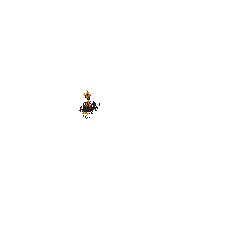

In [95]:
t = time.time()

draw_top_regions(ups, mega_regions, mega_region_sizes, 100, output_file_name='../plots/top_region_mega')

print("time = ", time.time()-t, " seconds")

## Part 4: Region Clustering Again

In [104]:
#Building region graph and saving it

t = time.time()

G_reg_3 = build_region_graph(G_ups, mega_regions, ups, updates_proj, .5, 'reg_3')

pfile = open('reg_3_graph.pkl', 'wb')
pickle.dump(G_reg_3, pfile)
pfile.close()

print("time = ", time.time()-t, " seconds")

#labelled regions =  579497
#unlabelled regions =  1244525
#true edges =  8893933
#false edges =  2497871
#unlabelled edges =  1673806
time =  2544.638300180435  seconds


In [105]:
#Prepares data for feature computation and saves it.

t = time.time()

mega_region_durations = compute_region_durations(mega_regions, durations, ups)
users_per_mega_region = compute_users_per_region(mega_regions, ups)

emb_sign = features[3]['data']['emb']
user_index_sign = features[3]['data']['index']

emb_act = features[4]['data']['emb']
user_index_act = features[4]['data']['index']

mega_region_sign_emb = compute_user_vector_regions(mega_regions, emb_sign, user_index_sign, ups)
mega_region_act_emb = compute_user_vector_regions(mega_regions, emb_act, user_index_act, ups)

user_color = features[5]['data']['emb']
user_index_color = features[5]['data']['index']

mega_region_colors_emb = compute_user_vector_regions(mega_regions, user_color, user_index_color, ups)

mega_region_colors = compute_region_colors(mega_regions, ups)

mega_bounding_boxes = compute_region_bounding_boxes(mega_regions, ups)

ultra_region_features = [{'name': "distance_sign_embedding", 'func': distance_region_user_embedding, 'data': mega_region_sign_emb},
    {'name': "distance_act_embedding", 'func': distance_region_user_embedding, 'data': mega_region_act_emb},
    {'name': "users_per_region", 'func': distance_users_per_region, 'data':{'users': users_per_mega_region, 'regions':mega_regions}}, 
    {'name': "pos_distance", 'func': avg_update_pos_distance, 'data':mega_regions},
    {'name': "sizes", 'func': sizes, 'data':super_regions},
    {'name': "bounding_box", 'func': bounding_box_distance, 'data':mega_bounding_boxes},
    {'name': "dist_region_color", 'func': distance_region_colors, 'data':mega_region_colors},
    {'name': 'avg_update_distance', 'func': avg_update_pos_distance, 'data':mega_regions},
    {'name': 'dist_user_colors', 'func': distance_region_user_colors, 'data':mega_region_colors_emb},
    {'name': 'dist_region_durations', 'func': distance_region_durations, 'data':mega_region_durations},
    {'name': 'diff_internal_weight', 'func': difference_internal_weights, 'data':mega_int_weights},
    {'name': 'sum_internal_weight', 'func': sum_internal_weights, 'data':mega_int_weights}
]


pfile = open('features_ultra_regions.pkl', 'wb')
pickle.dump(ultra_region_features, pfile)
pfile.close()

print("time = ", time.time()-t, " seconds")

NameError: name 'mega_region_features' is not defined

In [ ]:
#Creating feature matrix A and vector of labels b
#for learning an region edge weight model

t = time.time()

A, b = build_feat_label_regions(G_reg_3, ups, ultra_region_features)

print(A.shape)
print(b.sum() / b.shape[0])

print("time = ", time.time()-t, " seconds")

In [108]:
scaler_A = StandardScaler()
scaler_b = StandardScaler()

scaler_A.fit(A)
scaled_A = scaler_A.transform(A)

transformed_b = np.matrix(b).T
scaler_b.fit(transformed_b)
scaled_b = scaler_b.transform(transformed_b)
scaled_b = scaled_b.T[0]

In [ ]:
#Learning region edge weight model using gradient boosting regression
#and saving model.

t = time.time()

model = GradientBoostingRegressor(random_state=1, n_estimators=50).fit(A, b)

pfile = open('model_super_regions.pkl', 'wb')
pickle.dump(model, pfile)
pfile.close()

print("time = ", time.time()-t, " seconds")

In [110]:
#Feature importances

for f in range(len(ultra_region_features)):
    print("feature: ", ultra_region_features[f]['name'], model.feature_importances_[f])

feature:  distance_sign_embedding 0.18306123079637754
feature:  distance_act_embedding 0.0005638441172713993
feature:  users_per_region 0.006418544315223514
feature:  pos_distance 0.07699681825328364
feature:  sizes 0.0033672512183984394
feature:  bounding_box 0.008985482374719205
feature:  dist_region_color 0.5584205596899029
feature:  avg_update_distance 0.04715668584478784
feature:  dist_user_colors 0.019044075121686425
feature:  dist_region_durations 0.08592796061942462
feature:  diff_internal_weight 0.008757556749822341
feature:  sum_internal_weight 0.0012999908991022623


In [111]:
t = time.time()

compute_edge_weights_multithread(G_reg_3, ups, model, ultra_region_features, 'features_ultra_regions.pkl', num_threads)
G_reg_3.sort_edges()

print("time = ", time.time()-t, " seconds")

KeyboardInterrupt: 

In [96]:
t = time.time()

print(recall(mega_regions, updates_proj, ups, threshold=0.5, pixel=False))

print("time = ", time.time()-t, " seconds")

0.13714285714285715
time =  24.75730276107788  seconds


In [98]:
t = time.time()

print(precision(mega_regions, updates_proj, ups, threshold=0.5, pixel=True))

print("time = ", time.time()-t, " seconds")

0.0012435713683500548
time =  16.038394689559937  seconds


In [31]:
updates_proj

NameError: name 'updates_proj' is not defined

In [99]:
t = time.time()

print(recall(regions, updates_proj, ups, threshold=0.5, pixel=False))

print("time = ", time.time()-t, " seconds")

0.030714285714285715
time =  21.7175931930542  seconds


In [100]:
t = time.time()

print(recall(super_regions, updates_proj, ups, threshold=0.5, pixel=False))

print("time = ", time.time()-t, " seconds")

0.07928571428571428
time =  21.760384559631348  seconds


In [29]:
def compute_updates_per_project(ups, pixel):
    '''
        Returns a dictionary of dictionaries
        where [proj][update] is True if 
        the update belongs to the project.
    '''
    updates_proj = {}
    
    for u in range(len(ups)):
        up = ups[u]
        if pixel is True:
            if up[6] == 1:
                if up[5] not in updates_proj:
                    updates_proj[up[5]] = {}
                    
                updates_proj[up[5]][u] = True
        else:
            if up[7] == 1:
                if up[5] not in updates_proj:
                    updates_proj[up[5]] = {}
                    
                updates_proj[up[5]][u] = True
                
    return updates_proj

def max_intersection_over_union(region, updates_proj, ups, pixel):
    '''
        Computes value of intersection over union for 
        maximum value project. If pixel is True takes into
        account only final updates as true positives, otherwise
        also takes into account updates with the same color as those.
    '''
    inters = {}
    size_final = 0
    
    for u in region:
        up = ups[u]
        
        if pixel is True:
            if up[6] == 1:
                if up[5] not in inters:
                    inters[up[5]] = 0
                    size_final = size_final + 1
                    
                inters[up[5]] = inters[up[5]] + 1
        else:                
            if up[7] == 1:
                if up[5] not in inters:
                    inters[up[5]] = 0
                    
                inters[up[5]] = inters[up[5]] + 1
                size_final = size_final + 1
    
    for proj in inters:
        inters[proj] = inters[proj] / (len(updates_proj[proj])+size_final-inters[proj])
    
    if len(inters) > 0:
        max_proj, max_score = max(inters.items(), key=operator.itemgetter(1))
    else:
        max_proj = 0
        max_score = 0

    return max_proj, max_score

def recall(regions, updates_proj, ups, threshold, pixel):
    '''
        Computes recall of the regions based on 
        matching threshold for intersection-over-union.
    '''
    recovered_projs = {}
    for region in regions:
        proj, score = max_intersection_over_union(region, updates_proj, ups, pixel)
        
        if score > threshold:
            recovered_projs[proj] = True
            
    return len(recovered_projs) / len(updates_proj)

def precision(regions, updates_proj, ups, threshold, pixel):
    '''
        Computes precision of the regions based on 
        matching threshold for intersection-over-union.
    '''
    tp = 0.
    fp = 0.
    for region in regions:
        proj, score = max_intersection_over_union(region, updates_proj, ups, pixel)
        
        if score > 0:
            if score > threshold :
                tp = tp + 1
            else:
                fp = fp + 1

    return tp / (tp + fp)

def f1_score(regions, updates_proj, ups, threshold, pixel):
    '''
        Computes F1-score of the regions based on 
        matching threshold for intersection-over-union.
    '''
    prec = precision(regions, updates_proj, ups, threshold, pixel)
    rec = recall(regions, updates_proj, ups, threshold, pixel)
    
    return 2 * prec * rec / (prec + rec)

def f_gss_ups(kappa, args):
    '''
        Performs update segmentation with the given value of
        kappa and returns the score using the given metric.
    '''
    G, ups, updates_proj, threshold, pixel, metric = args
    
    comp_assign, int_weights = region_segmentation(G, ups, kappa)
    regions, sizes, int_weights = extract_regions(comp_assign, int_weights)
    
    m = metric(regions, updates_proj, ups, threshold, pixel)
    
    print("kappa = ", kappa, " score = ", m)
    
    return -m
    

def f_gss_region(kappa, args):
    '''
        Performs super region segmentation using the given value
        of kappa and returns the score using the given metric.
    '''
    G, ups, regions, updates_proj, threshold, pixel, metric = args
    
    comp_assign_reg, int_weights_reg = region_segmentation(G, regions, kappa)
    reg_regions, reg_sizes, super_int_weights = extract_regions(comp_assign_reg, int_weights_reg)
    super_regions, super_region_sizes, super_region_assign = extract_super_region_info(reg_regions, regions)

    m = metric(super_regions, updates_proj, ups, threshold, pixel)
    
    print("kappa = ", kappa, " score = ", m)
    
    return -m

invphi = (math.sqrt(5) - 1) / 2  # 1 / phi
invphi2 = (3 - math.sqrt(5)) / 2  # 1 / phi^2

def gss(f, args, a, b, tol=1e-5):
    """Golden section search.

    Given a function f with a single local minimum in
    the interval [a,b], gss returns a subset interval
    [c,d] that contains the minimum with d-c <= tol.

    modified from: https://en.wikipedia.org/wiki/Golden-section_search
    
    Usage: gss(f_gss, [G_reg_2, ups, super_regions, updates_proj, .5, False, recall], 0., 1.)
    """

    (a, b) = (min(a, b), max(a, b))
    h = b - a
    if h <= tol:
        return (a, b)

    # Required steps to achieve tolerance
    n = int(math.ceil(math.log(tol / h) / math.log(invphi)))

    c = a + invphi2 * h
    d = a + invphi * h
    yc = f(c, args)
    yd = f(d, args)

    for k in range(n-1):
        if yc < yd:
            b = d
            d = c
            yd = yc
            h = invphi * h
            c = a + invphi2 * h
            yc = f(c, args)
        else:
            a = c
            c = d
            yc = yd
            h = invphi * h
            d = a + invphi * h
            yd = f(d, args)

    if yc < yd:
        return (a, d)
    else:
        return (c, b)
    
def superv_reg_segm_ups(G, ups, min_kappa, max_kappa, updates_proj, metric, threshold=0.5, pixel=False, tol=1e-2):
    '''
        Returns segmentation that maximizes the metric by performing a 1-d search
        over kappa.
    '''
    kappa_range = gss(f_gss_ups, [G, ups, updates_proj, threshold, False, recall], 0., 1.)
    kappa = (kappa_range[0]+kappa_range[1]) / 2
    comp_assign, int_weights = region_segmentation(G_ups, ups, kappa)
    regions, sizes, int_weights = extract_regions(comp_assign, int_weights)
    
    print("score = ", metric(regions, updates_proj, ups, threshold, pixel))
    
    return regions, sizes, int_weights

def superv_reg_segm_reg(G, ups, regions, min_kappa, max_kappa, updates_proj, metric, threshold=0.5, pixel=False, tol=1e-2):
    '''
        Returns segmentation that maximizes the metric by performing a 1-d search
        over kappa.
    '''
    kappa_range = gss(f_gss_region, [G, ups, regions, updates_proj, threshold, False, recall], 0., 1.)
    kappa = (kappa_range[0]+kappa_range[1]) / 2
    
    comp_assign_reg, int_weights_reg = region_segmentation(G, regions, kappa)
    reg_regions, reg_sizes, super_int_weights = extract_regions(comp_assign_reg, int_weights_reg)
    super_regions, super_region_sizes, super_region_assign = extract_super_region_info(reg_regions, regions)
    
    print("score = ", metric(super_regions, updates_proj, ups, threshold, pixel))
    
    return super_regions, super_region_sizes, super_int_weights

#super_regions, super_region_sizes, super_int_weights = superv_reg_segm_reg(G_reg, ups, regions, 0., 2., updates_proj, recall)

In [299]:
mega_regions, mega_region_sizes, mega_int_weights = superv_reg_segm_reg(G_reg_2, ups, super_regions, 0., 2., updates_proj, recall)

kappa =  0.3819660112501051  score =  0.10785714285714286
kappa =  0.6180339887498949  score =  0.10785714285714286
kappa =  0.7639320225002103  score =  0.10928571428571429
kappa =  0.8541019662496847  score =  0.11142857142857143
kappa =  0.9098300562505258  score =  0.06
kappa =  0.8196601125010515  score =  0.11
kappa =  0.8753882025018928  score =  0.09642857142857143
kappa =  0.8409463487532597  score =  0.11142857142857143
kappa =  0.8622325850054678  score =  0.10785714285714286
kappa =  0.849076967509043  score =  0.11357142857142857
kappa =  0.8459713474939011  score =  0.11285714285714285
kappa =  0.8509963462345427  score =  0.11285714285714285
kappa =  0.8478907262194008  score =  0.11285714285714285
kappa =  0.8498101049449004  score =  0.11214285714285714
kappa =  0.8486238636552582  score =  0.11285714285714285
kappa =  0.8493570010911157  score =  0.11357142857142857
kappa =  0.8495300713628279  score =  0.11214285714285714
kappa =  0.8492500377807553  score =  0.11357

In [125]:
gss(f_gss, [G_reg_2, ups, super_regions, updates_proj, .5, False, recall], 0., 1.)

kappa =  0.3819660112501051
kappa =  0.6180339887498949
kappa =  0.7639320225002103
kappa =  0.5278640450004206
kappa =  0.6737620787507361
kappa =  0.5835921350012618
kappa =  0.6393202250021031
kappa =  0.652475842498528
kappa =  0.6311896062463197
kappa =  0.6443452237427445
kappa =  0.6474508437578864
kappa =  0.6493702224833859
kappa =  0.6505564637730282
kappa =  0.6512896012088856
kappa =  0.6517427050626704
kappa =  0.652022738644743
kappa =  0.6521958089164552
kappa =  0.6523027722268157
kappa =  0.6523688791881674
kappa =  0.6522619158778071
kappa =  0.652328022839159
kappa =  0.6523436285758241
kappa =  0.6523532734515025
kappa =  0.6523376677148375
kappa =  0.6523473125905159


(0.6523436285758241, 0.6523532734515025)

In [154]:
superv_reg_segm_ups(G_ups, ups, 0., 2., updates_proj, recall)

kappa =  0.3819660112501051  score =  0.020714285714285713
kappa =  0.6180339887498949  score =  0.04214285714285714
kappa =  0.7639320225002103  score =  0.054285714285714284
kappa =  0.8541019662496847  score =  0.054285714285714284
kappa =  0.9098300562505258  score =  0.05857142857142857
kappa =  0.944271909999159  score =  0.05714285714285714
kappa =  0.8885438199983178  score =  0.05785714285714286
kappa =  0.9229856737469508  score =  0.05785714285714286
kappa =  0.9016994374947426  score =  0.05928571428571429
kappa =  0.8966744387541011  score =  0.05785714285714286
kappa =  0.9048050575098845  score =  0.05857142857142857
kappa =  0.8997800587692429  score =  0.05857142857142857
kappa =  0.9028856787843847  score =  0.05857142857142857


KeyboardInterrupt: 

kappa =  0.3819660112501051
kappa =  0.3819660112501051  score =  0.05928571428571429
kappa =  0.6180339887498949
kappa =  0.6180339887498949  score =  0.06785714285714285
kappa =  0.7639320225002103
kappa =  0.7639320225002103  score =  0.10071428571428571
kappa =  0.8541019662496847
kappa =  0.8541019662496847  score =  0.08785714285714286
kappa =  0.7082039324993692
kappa =  0.7082039324993692  score =  0.08357142857142857
kappa =  0.7983738762488435
kappa =  0.7983738762488435  score =  0.10357142857142858
kappa =  0.8196601125010515
kappa =  0.8196601125010515  score =  0.1
kappa =  0.7852182587524185
kappa =  0.7852182587524185  score =  0.10785714285714286
kappa =  0.7770876399966351
kappa =  0.7770876399966351  score =  0.10714285714285714
kappa =  0.7902432574930599
kappa =  0.7902432574930599  score =  0.10642857142857143
kappa =  0.7821126387372765
kappa =  0.7821126387372765  score =  0.10785714285714286
kappa =  0.787137637477918
kappa =  0.787137637477918  score =  0.1071

In [149]:
#Neighborhood information for a particular region

region_neighborhood(1677, G_reg_2, ups, super_region_features, super_regions)

807 , 1677 , 2
size_u= 39122  size_v= 129036
distance_user_embedding   0.02948355696780013
users_per_region   0.28579827207197994
superposition   0.356353591160221
pos_distance   19.338530798286442
sizes   168158
bounding_box   0.0
dist_region_color   0.7749614754040596
avg_update_distance   19.338530798286442
dist_user_colors   0.10297529656600568
dist_region_durations   0.0013469174917221105
diff_internal_weight   0.040619894176852356
sum_internal_weight   0.9741261368420795

1677 , 480068 , 2
size_u= 129036  size_v= 187
distance_user_embedding   0.27210895147090935
users_per_region   0.27807486631016043
superposition   0.4507042253521127
pos_distance   103.10684585148068
sizes   129223
bounding_box   0.0
dist_region_color   0.09874042529771976
avg_update_distance   103.10684585148068
dist_user_colors   0.12731554191746075
dist_region_durations   0.5129080668791106
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 818333 , 2
size_u= 129036  si

superposition   0.24271844660194175
pos_distance   166.0126162508738
sizes   129262
bounding_box   0.006127939418094859
dist_region_color   0.3958404830153731
avg_update_distance   166.0126162508738
dist_user_colors   0.12344885634691738
dist_region_durations   0.27037088036145984
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 271148 , 0
size_u= 129036  size_v= 321
distance_user_embedding   0.1754552580040669
users_per_region   0.46105919003115264
superposition   0.0
pos_distance   71.23248517766021
sizes   129357
bounding_box   0.0
dist_region_color   0.6120852892462381
avg_update_distance   71.23248517766021
dist_user_colors   0.2799099324113259
dist_region_durations   0.5388414908309971
diff_internal_weight   0.037072474843067416
sum_internal_weight   1.0518185058619993

1677 , 351778 , 2
size_u= 129036  size_v= 443
distance_user_embedding   0.17329735202264834
users_per_region   0.04966139954853273
superposition   0.31654676258992803
pos_

avg_update_distance   47.171480074089835
dist_user_colors   0.14810696408063195
dist_region_durations   0.32672329060207006
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 619503 , 2
size_u= 129036  size_v= 89
distance_user_embedding   0.15251652291222834
users_per_region   0.11235955056179775
superposition   0.2222222222222222
pos_distance   33.78183674135872
sizes   129125
bounding_box   0.0
dist_region_color   0.6355048203602096
avg_update_distance   33.78183674135872
dist_user_colors   0.058050114049468804
dist_region_durations   0.9334308872376149
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 652608 , 0
size_u= 129036  size_v= 67
distance_user_embedding   0.22723890384989684
users_per_region   0.34328358208955223
superposition   0.38461538461538464
pos_distance   37.29389516279799
sizes   129103
bounding_box   0.0
dist_region_color   0.49126368992015657
avg_update_distance   37.29389516279799
d

superposition   0.8771929824561403
pos_distance   132.25476153710682
sizes   129179
bounding_box   0.0
dist_region_color   0.8032813307155351
avg_update_distance   132.25476153710682
dist_user_colors   0.18630647454656446
dist_region_durations   0.556452973634418
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 681254 , 0
size_u= 129036  size_v= 121
distance_user_embedding   0.14125317929880934
users_per_region   0.18181818181818182
superposition   0.5849056603773585
pos_distance   141.18838781575303
sizes   129157
bounding_box   0.0
dist_region_color   0.6740388805584143
avg_update_distance   141.18838781575303
dist_user_colors   0.1861097911387517
dist_region_durations   0.6062805056933529
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 282275 , 2
size_u= 129036  size_v= 204
distance_user_embedding   0.37646609263216435
users_per_region   0.6323529411764706
superposition   0.11504424778761062
pos_dis

avg_update_distance   73.76569402001554
dist_user_colors   0.24133557299332065
dist_region_durations   0.055255205532370066
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 3805 , 2
size_u= 129036  size_v= 394
distance_user_embedding   0.3565403840859848
users_per_region   0.5913705583756346
superposition   0.2556053811659193
pos_distance   72.75409614198436
sizes   129430
bounding_box   0.0
dist_region_color   0.5455226519243124
avg_update_distance   72.75409614198436
dist_user_colors   0.18102394797426713
dist_region_durations   0.010427861856488807
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 2488 , 2
size_u= 129036  size_v= 201
distance_user_embedding   0.4407498893596104
users_per_region   0.6666666666666666
superposition   0.4148936170212766
pos_distance   34.29450110073798
sizes   129237
bounding_box   0.0
dist_region_color   0.3316039767682558
avg_update_distance   34.29450110073798
dist_use

superposition   0.14583333333333334
pos_distance   109.65526735730504
sizes   129105
bounding_box   0.0
dist_region_color   0.3357067862423294
avg_update_distance   109.65526735730504
dist_user_colors   0.13154227691800324
dist_region_durations   0.8391414219258009
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 162971 , 2
size_u= 129036  size_v= 127
distance_user_embedding   0.5511527502058181
users_per_region   0.7637795275590551
superposition   0.06172839506172839
pos_distance   103.74361027518455
sizes   129163
bounding_box   0.0
dist_region_color   0.34820911847099745
avg_update_distance   103.74361027518455
dist_user_colors   0.2591080892429789
dist_region_durations   0.3656138545134233
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 47685 , 2
size_u= 129036  size_v= 702
distance_user_embedding   0.5909385939798789
users_per_region   0.7564102564102564
superposition   0.07917888563049853
pos_dis

avg_update_distance   85.08870464824454
dist_user_colors   0.34200814436533367
dist_region_durations   0.001299965601239128
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 2754 , 2
size_u= 129036  size_v= 909
distance_user_embedding   0.6959509280487163
users_per_region   0.9053905390539054
superposition   0.21025641025641026
pos_distance   130.04153692931578
sizes   129945
bounding_box   0.0
dist_region_color   0.40148398732740376
avg_update_distance   130.04153692931578
dist_user_colors   0.19555613475646494
dist_region_durations   0.008752475870005938
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 2762 , 2
size_u= 129036  size_v= 183
distance_user_embedding   0.7583351982558192
users_per_region   0.9562841530054644
superposition   0.008695652173913044
pos_distance   120.00739649378492
sizes   129219
bounding_box   0.0
dist_region_color   0.3861358553388836
avg_update_distance   120.00739649378492


superposition   0.05660377358490566
pos_distance   42.398714824791085
sizes   129212
bounding_box   0.14913877608178128
dist_region_color   0.45320315824477453
avg_update_distance   42.398714824791085
dist_user_colors   0.2457962507843292
dist_region_durations   0.1310465038366473
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 374309 , 2
size_u= 129036  size_v= 199
distance_user_embedding   0.6433114412544331
users_per_region   0.7688442211055276
superposition   0.01834862385321101
pos_distance   155.28513550328088
sizes   129235
bounding_box   0.011454904542462147
dist_region_color   0.43758529620731457
avg_update_distance   155.28513550328088
dist_user_colors   0.18393859579743266
dist_region_durations   0.4631457913791167
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 8302 , 2
size_u= 129036  size_v= 425
distance_user_embedding   0.6278054012156054
users_per_region   0.76
superposition   0.397260

avg_update_distance   97.8335293914787
dist_user_colors   0.28447415118635533
dist_region_durations   0.8327310756969916
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 875117 , 0
size_u= 129036  size_v= 68
distance_user_embedding   0.610422629868108
users_per_region   0.6617647058823529
superposition   0.09523809523809523
pos_distance   210.0952267214786
sizes   129104
bounding_box   0.0
dist_region_color   0.6355048203602096
avg_update_distance   210.0952267214786
dist_user_colors   0.19618766461555148
dist_region_durations   0.8863016561071617
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 29933 , 2
size_u= 129036  size_v= 94
distance_user_embedding   0.30985997821473843
users_per_region   0.7021276595744681
superposition   0.2835820895522388
pos_distance   49.071198530877034
sizes   129130
bounding_box   0.0
dist_region_color   0.7318198516923861
avg_update_distance   49.071198530877034
dist_user

superposition   0.06172839506172839
pos_distance   156.1071066484712
sizes   129136
bounding_box   0.0
dist_region_color   0.4768535912458538
avg_update_distance   156.1071066484712
dist_user_colors   0.16178781877531923
dist_region_durations   0.268778763646802
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 502555 , 2
size_u= 129036  size_v= 77
distance_user_embedding   0.4847228888116547
users_per_region   0.8571428571428571
superposition   0.03636363636363636
pos_distance   45.90702854372215
sizes   129113
bounding_box   0.0672023827991685
dist_region_color   0.6497426672029109
avg_update_distance   45.90702854372215
dist_user_colors   0.3703738198116324
dist_region_durations   0.6331395839546041
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 731963 , 2
size_u= 129036  size_v= 67
distance_user_embedding   1.1680600505002943
users_per_region   0.9253731343283582
superposition   0.1568627450980392


avg_update_distance   125.26626280104928
dist_user_colors   0.2267105415356604
dist_region_durations   0.1778939997444694
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 2676 , 2
size_u= 129036  size_v= 72
distance_user_embedding   0.8551367635553435
users_per_region   1.0
superposition   0.16666666666666666
pos_distance   42.742941468868715
sizes   129108
bounding_box   0.0
dist_region_color   0.6379305000154996
avg_update_distance   42.742941468868715
dist_user_colors   0.3311642304090814
dist_region_durations   0.1810039393360776
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 3227 , 2
size_u= 129036  size_v= 196
distance_user_embedding   0.8223083433424585
users_per_region   0.9183673469387755
superposition   0.13043478260869565
pos_distance   74.20611968557456
sizes   129232
bounding_box   0.08885106639354139
dist_region_color   0.659806850295219
avg_update_distance   74.20611968557456
dist_user_

superposition   0.8
pos_distance   121.62694886311664
sizes   129236
bounding_box   0.0
dist_region_color   0.4921445178089836
avg_update_distance   121.62694886311664
dist_user_colors   0.30653026899427716
dist_region_durations   0.183417848978904
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 484093 , 2
size_u= 129036  size_v= 100
distance_user_embedding   0.45917350730471435
users_per_region   0.83
superposition   0.16279069767441862
pos_distance   34.90624760480074
sizes   129136
bounding_box   0.006061511890527434
dist_region_color   0.7250767227750394
avg_update_distance   34.90624760480074
dist_user_colors   0.3748473858537522
dist_region_durations   0.9452915308129956
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 2293 , 2
size_u= 129036  size_v= 1095
distance_user_embedding   0.9039659421922156
users_per_region   0.8237442922374429
superposition   0.5075862068965518
pos_distance   28.977802

avg_update_distance   45.07643950767606
dist_user_colors   0.3174803516922523
dist_region_durations   0.8968210734700914
diff_internal_weight   0.03970844683581298
sum_internal_weight   1.0544544778547449

1677 , 65227 , 2
size_u= 129036  size_v= 379
distance_user_embedding   0.9588834804353585
users_per_region   0.8601583113456465
superposition   0.8726415094339622
pos_distance   93.94551059371123
sizes   129415
bounding_box   0.0
dist_region_color   0.6061247680281652
avg_update_distance   93.94551059371123
dist_user_colors   0.24676069132606937
dist_region_durations   0.17506293970952158
diff_internal_weight   0.018158745907835117
sum_internal_weight   0.9965872851110966

1677 , 318432 , 2
size_u= 129036  size_v= 97
distance_user_embedding   0.8840362112347353
users_per_region   0.9072164948453608
superposition   0.13636363636363635
pos_distance   39.94348702588308
sizes   129133
bounding_box   0.05203462656388222
dist_region_color   0.6116860059511883
avg_update_distance   39.94348

avg_update_distance   228.3118145441551
dist_user_colors   0.2067063409155674
dist_region_durations   0.6454678420578874
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 6103 , 2
size_u= 129036  size_v= 58
distance_user_embedding   0.6526588334798891
users_per_region   0.9310344827586207
superposition   0.7358490566037735
pos_distance   11.138374564116688
sizes   129094
bounding_box   0.0
dist_region_color   0.6255618587060976
avg_update_distance   11.138374564116688
dist_user_colors   0.4121756125531796
dist_region_durations   0.22913292665214924
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 249767 , 2
size_u= 129036  size_v= 62
distance_user_embedding   0.7534272498246124
users_per_region   0.7903225806451613
superposition   0.0
pos_distance   159.36084000136302
sizes   129098
bounding_box   0.0
dist_region_color   0.6317326797522872
avg_update_distance   159.36084000136302
dist_user_colors   0.249

superposition   0.8225806451612904
pos_distance   28.503028767653852
sizes   129145
bounding_box   0.0
dist_region_color   0.38385817086533847
avg_update_distance   28.503028767653852
dist_user_colors   0.21114173862797148
dist_region_durations   0.4615439175044348
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 216492 , 2
size_u= 129036  size_v= 91
distance_user_embedding   0.6568650565208757
users_per_region   0.8681318681318682
superposition   0.0392156862745098
pos_distance   160.39340799142013
sizes   129127
bounding_box   0.0
dist_region_color   0.6638272682399902
avg_update_distance   160.39340799142013
dist_user_colors   0.3107754897067643
dist_region_durations   0.2473475926864248
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 63263 , 2
size_u= 129036  size_v= 67
distance_user_embedding   0.5916657979828048
users_per_region   0.7014925373134329
superposition   0.918918918918919
pos_distance 

avg_update_distance   17.96687126306585
dist_user_colors   0.25687306383235564
dist_region_durations   0.5130324496861687
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 14981 , 0
size_u= 129036  size_v= 1537
distance_user_embedding   0.7828801080572454
users_per_region   0.7781392322706572
superposition   0.39509954058192953
pos_distance   91.67945396568118
sizes   130573
bounding_box   0.0707654823587466
dist_region_color   0.6355048203602096
avg_update_distance   91.67945396568118
dist_user_colors   0.33190360400860586
dist_region_durations   0.012900626011968397
diff_internal_weight   0.03657012075501109
sum_internal_weight   1.0513161517739429

1677 , 819035 , 2
size_u= 129036  size_v= 72
distance_user_embedding   0.6828944056021943
users_per_region   0.8888888888888888
superposition   0.625
pos_distance   104.23135312857247
sizes   129108
bounding_box   0.0
dist_region_color   0.7223720512105148
avg_update_distance   104.23135312857247
d

superposition   0.22566371681415928
pos_distance   60.113163263838594
sizes   129738
bounding_box   0.0
dist_region_color   0.6426055353796449
avg_update_distance   60.113163263838594
dist_user_colors   0.3220135747336449
dist_region_durations   0.6194765370803533
diff_internal_weight   0.07479992003320135
sum_internal_weight   1.0895459510521333

1677 , 148160 , 2
size_u= 129036  size_v= 764
distance_user_embedding   0.6306331717647458
users_per_region   0.9018324607329843
superposition   0.05846153846153846
pos_distance   223.43955432718005
sizes   129800
bounding_box   0.10365027965852222
dist_region_color   0.9999380017979479
avg_update_distance   223.43955432718005
dist_user_colors   0.36494958400790445
dist_region_durations   0.18345317873839595
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 155245 , 2
size_u= 129036  size_v= 160
distance_user_embedding   0.617915969297122
users_per_region   0.825
superposition   0.42592592592592593
pos

avg_update_distance   199.19931160636312
dist_user_colors   0.3389475024910362
dist_region_durations   0.008766299266343758
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 6737 , 2
size_u= 129036  size_v= 59
distance_user_embedding   0.8749269279900934
users_per_region   1.0
superposition   0.6041666666666666
pos_distance   111.77319581400484
sizes   129095
bounding_box   0.06776085135428625
dist_region_color   0.6491214381901569
avg_update_distance   111.77319581400484
dist_user_colors   0.4213804227786554
dist_region_durations   0.27234388412725985
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 93158 , 2
size_u= 129036  size_v= 8959
distance_user_embedding   0.5236302263912217
users_per_region   0.8572385310860587
superposition   0.01320321469575201
pos_distance   196.6979302581917
sizes   137995
bounding_box   0.10092648948400622
dist_region_color   0.7752952664372733
avg_update_distance   196.697

superposition   0.3770491803278688
pos_distance   90.67739662170126
sizes   129312
bounding_box   0.0
dist_region_color   0.6803857905512043
avg_update_distance   90.67739662170126
dist_user_colors   0.3576504994828953
dist_region_durations   0.40997521134667736
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 3547 , 2
size_u= 129036  size_v= 111
distance_user_embedding   0.7752326079295176
users_per_region   0.9009009009009009
superposition   0.07692307692307693
pos_distance   164.5920819753408
sizes   129147
bounding_box   0.02922603626943005
dist_region_color   0.7810516738257833
avg_update_distance   164.5920819753408
dist_user_colors   0.34632846128744443
dist_region_durations   0.0024745829881189785
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 3644 , 2
size_u= 129036  size_v= 361
distance_user_embedding   0.7864228440016254
users_per_region   0.9279778393351801
superposition   0.19760479041916

superposition   0.891213389121339
pos_distance   124.64895580110681
sizes   129466
bounding_box   0.0
dist_region_color   0.4190780723172982
avg_update_distance   124.64895580110681
dist_user_colors   0.2171382783492377
dist_region_durations   0.21252009098637326
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 174476 , 2
size_u= 129036  size_v= 471
distance_user_embedding   0.8440307976152475
users_per_region   0.6878980891719745
superposition   0.8957654723127035
pos_distance   151.03585004991234
sizes   129507
bounding_box   0.0
dist_region_color   0.3800073173674142
avg_update_distance   151.03585004991234
dist_user_colors   0.17156186550567065
dist_region_durations   0.21182433015033375
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 549706 , 2
size_u= 129036  size_v= 83
distance_user_embedding   0.6393763925661664
users_per_region   0.6987951807228916
superposition   0.0
pos_distance   52.1234718

avg_update_distance   10.317309845140983
dist_user_colors   0.4578082875467072
dist_region_durations   0.6145697243829182
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 130753 , 2
size_u= 129036  size_v= 77
distance_user_embedding   1.100766115909717
users_per_region   0.8961038961038961
superposition   0.9814814814814815
pos_distance   16.688985972965757
sizes   129113
bounding_box   0.0
dist_region_color   0.6333845019793127
avg_update_distance   16.688985972965757
dist_user_colors   0.31238717502606994
dist_region_durations   0.7100048791244367
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 3366 , 2
size_u= 129036  size_v= 200
distance_user_embedding   0.8860482112113574
users_per_region   0.86
superposition   0.9112426035502958
pos_distance   155.17779392544216
sizes   129236
bounding_box   0.0
dist_region_color   0.5952408630149726
avg_update_distance   155.17779392544216
dist_user_colors   0.2

superposition   0.75
pos_distance   187.12941878456772
sizes   129197
bounding_box   0.023918923322579593
dist_region_color   0.38638993133795396
avg_update_distance   187.12941878456772
dist_user_colors   0.15819785455832958
dist_region_durations   0.4631624094906812
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 64220 , 2
size_u= 129036  size_v= 514
distance_user_embedding   0.8364466181497089
users_per_region   0.7470817120622568
superposition   0.7407407407407407
pos_distance   75.6832042486379
sizes   129550
bounding_box   0.0
dist_region_color   0.570539600265989
avg_update_distance   75.6832042486379
dist_user_colors   0.23913789090937598
dist_region_durations   0.059470817420083644
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 207231 , 2
size_u= 129036  size_v= 99
distance_user_embedding   1.0026927422031973
users_per_region   0.7373737373737373
superposition   0.8955223880597015
pos_distan

avg_update_distance   110.07049220582714
dist_user_colors   0.3049306907716334
dist_region_durations   0.42557017654240437
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 184123 , 2
size_u= 129036  size_v= 76
distance_user_embedding   0.9952523974177603
users_per_region   0.9605263157894737
superposition   0.02
pos_distance   52.63052053532687
sizes   129112
bounding_box   0.029792746113989636
dist_region_color   0.946111733812351
avg_update_distance   52.63052053532687
dist_user_colors   0.45723590621021937
dist_region_durations   0.8147874235244013
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 8691 , 2
size_u= 129036  size_v= 58
distance_user_embedding   0.9437953688851642
users_per_region   0.9827586206896551
superposition   1.0
pos_distance   97.25982746173956
sizes   129094
bounding_box   0.0
dist_region_color   0.6099853449077562
avg_update_distance   97.25982746173956
dist_user_colors   0.425

superposition   0.27560718057022177
pos_distance   196.2905653608492
sizes   133836
bounding_box   0.0
dist_region_color   0.7262480431817477
avg_update_distance   196.2905653608492
dist_user_colors   0.2928779098464227
dist_region_durations   0.0017512524099044802
diff_internal_weight   0.056303207402703226
sum_internal_weight   1.071049238421635

1677 , 740748 , 2
size_u= 129036  size_v= 527
distance_user_embedding   0.9839970899995518
users_per_region   0.872865275142315
superposition   0.028455284552845527
pos_distance   60.275481261968295
sizes   129563
bounding_box   0.16325377576893396
dist_region_color   0.6849235636872413
avg_update_distance   60.275481261968295
dist_user_colors   0.3682430453116261
dist_region_durations   0.6688300343002739
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 25709 , 0
size_u= 129036  size_v= 15607
distance_user_embedding   0.7322577367844951
users_per_region   0.8847312103543282
superposition   0.0986629

superposition   0.019505398815743643
pos_distance   192.91412216505148
sizes   157680
bounding_box   0.23451776649746192
dist_region_color   0.8699479241076035
avg_update_distance   192.91412216505148
dist_user_colors   0.4847805297020791
dist_region_durations   0.0013856240002262377
diff_internal_weight   0.016278064469401166
sum_internal_weight   1.031024095488333

1677 , 15214 , 2
size_u= 129036  size_v= 4683
distance_user_embedding   0.8684547125553403
users_per_region   0.827247490924621
superposition   0.2705761316872428
pos_distance   56.223890020529915
sizes   133719
bounding_box   0.1374838939605779
dist_region_color   0.7749689368553475
avg_update_distance   56.223890020529915
dist_user_colors   0.3047755514970729
dist_region_durations   0.013093791603876248
diff_internal_weight   0.0014488293482273207
sum_internal_weight   1.0161948603671591

1677 , 93607 , 2
size_u= 129036  size_v= 58
distance_user_embedding   1.743480836262438
users_per_region   0.9655172413793104
superpos

avg_update_distance   109.25598488546733
dist_user_colors   0.4940325866504587
dist_region_durations   0.29738181317583634
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 108170 , 0
size_u= 129036  size_v= 147
distance_user_embedding   0.953899285366503
users_per_region   0.8299319727891157
superposition   0.9285714285714286
pos_distance   32.77841861664874
sizes   129183
bounding_box   0.0
dist_region_color   0.7330142323831792
avg_update_distance   32.77841861664874
dist_user_colors   0.29150043074173193
dist_region_durations   0.1311507791376142
diff_internal_weight   0.00575394369784632
sum_internal_weight   1.020499974716778

1677 , 279941 , 2
size_u= 129036  size_v= 109
distance_user_embedding   0.9673726099273406
users_per_region   0.981651376146789
superposition   0.8518518518518519
pos_distance   216.37083694461919
sizes   129145
bounding_box   0.0
dist_region_color   0.999984500449487
avg_update_distance   216.37083694461919
dist_use

superposition   0.9555555555555556
pos_distance   166.7747133161716
sizes   129090
bounding_box   0.0
dist_region_color   0.8592149994316831
avg_update_distance   166.7747133161716
dist_user_colors   0.601502485215501
dist_region_durations   0.6111621811238402
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 3711 , 2
size_u= 129036  size_v= 63
distance_user_embedding   1.274455902253561
users_per_region   0.9841269841269841
superposition   0.9821428571428571
pos_distance   41.40426760887219
sizes   129099
bounding_box   0.0
dist_region_color   0.7747760314950867
avg_update_distance   41.40426760887219
dist_user_colors   0.591205674141676
dist_region_durations   0.4588337227190702
diff_internal_weight   0.5073730155094659
sum_internal_weight   0.5073730155094659

1677 , 2891 , 2
size_u= 129036  size_v= 67
distance_user_embedding   1.8522144354661494
users_per_region   1.0
superposition   0.9848484848484849
pos_distance   42.9049775096754
sizes  

avg_update_distance   87.93746077181012
dist_user_colors   0.5745662857016645
dist_region_durations   0.5681857619008635
diff_internal_weight   0.025838938987052584
sum_internal_weight   1.0405849700059844

1677 , 279751 , 2
size_u= 129036  size_v= 122
distance_user_embedding   1.3134961306315316
users_per_region   0.9590163934426229
superposition   0.95
pos_distance   46.499302162981586
sizes   129158
bounding_box   0.0
dist_region_color   0.6255618587060976
avg_update_distance   46.499302162981586
dist_user_colors   0.3698551764910005
dist_region_durations   0.33189107210309055
diff_internal_weight   0.022888294256054542
sum_internal_weight   0.9918577367628773



<Figure size 432x288 with 0 Axes>

<Figure size 7200x7200 with 0 Axes>

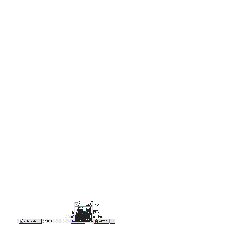

In [147]:
draw_region(ups, super_regions[1392], '../plots/region.svg')

In [297]:
len(super_regions)

1060790